# Capstone 2: *National Transit Database*
## *Preprocessing, Training, and Modeling*
***

## 3.1 Table of Contents<a id='3.1_Contents'></a>
* [3 Preprocessing and Training](#3_Preprocessing_and_Training)
  * [3.1 Table of Contents](#3.1_Contents)
  * [3.2 Introduction](#3.2_Introduction)
  * [3.3 Importing the Dependencies](#3.3_Importing_the_Dependencies)
  * [3.4 Importing the Data](#3.4_Importing_the_Data)
  * [3.5 The Definition of Safety](#3.5_The_Definition_of_Safety)
      * [3.5.1 Understanding the 'Total Events' Column](#3.5.1_Understanding_the_Total_Events_Column)
      * [3.5.2 Dropping the Columns Captured by 'Total Events'](#3.5.2_Dropping_the_Columns_Captured_by_Total_Events)
  * [3.6 Creating a 'Date' Column](#3.6_Creating_a_Date_Column)
  * [3.7 Exploratory Aggregation](#3.7_Exploratory_Aggregation)
      * [3.7.1 Time Series of the Features of the Future Target](#3.7.1_Time_Series_of_the_Features_of_the_Future_Target)
      * [3.7.2 Time Series of the Feature of the Future Target by Mode](#3.7.2_Time_Series_of_the_Future_Target_by_Mode)
      * [3.7.3 Time Series Examining Light Rail](#3.7.3_Time_Series_Examining_Light_Rail)
  * [3.8 First Modeling Dataframe:  Aggregated by Time for the Whole Nation](#3.8_First_Modeling_Dataframe)
      * [3.8.1 Encoding the Data for Modeling](#3.8.1_Encoding_the_Data_for_Modeling)
          * [3.8.1.1 Encoding the Categorical Features](#3.8.1.1_Encoding_the_Categorical_Features)
          * [3.8.1.2 Creating '...OTHER' Columns for Mode and Organization Type](#3.8.1.2_Creating_OTHER_Columns_for_Mode_and_Organization_Type)
      * [3.8.2 Aggregating the Data for Modeling](#3.8.2_Aggregating_the_Data_for_Modeling)
          * [3.8.2.1 Part 1 of Aggregation](#3.8.2.1_Part_1_of_Aggregation)
          * [3.8.2.2 Part 2 of Aggregation](#3.8.2.2_Part_2_of_Aggregation)
          * [3.8.2.3 Joining Part 1 and Part 2](#3.8.2.3_Joining_Part_1_and_Part_2)
          * [3.8.2.4 Checking the Aggregation](#3.8.2.4_Checking_the_Aggregation)
      * [3.8.3 Creating the Target](#3.8.3_Creating_the_Target)
          * [3.8.3.1 Creating the 'Safety Ratio' Column](#3.8.3.1_Creating_the_Safety_Ratio_Column)
          * [3.8.3.2 Dropping the Columns Used to Calculate 'Safety Ratio'](#3.8.3.2_Dropping_the_Columns_Used_to_Calculate_Safety_Ratio)
      * [3.8.4 Exploring the Data](#3.8.4_Exploring_the_Data)
      * [3.8.5 Model Trials: Regression](#3.8.5_Model_Trials_Regression)
          * [3.8.5.1 Train/Test Split](#3.8.5.1_Train_Test_Split)
          * [3.8.5.2 Linear Regression](#3.8.5.2_Linear_Regression)
          * [3.8.5.3 Random Forest](#3.8.5.3_Random_Forest)
          * [3.8.5.4 KNN](#3.8.5.4_KNN)
          * [3.8.5.5 Comparing the Models' Performance](#3.8.5.5_Comparing_the_Models_Performance)
  * [3.9 Summary](#3.9_Summary)          
* [4 Modeling](#4_Modeling)
    * [4.1 A Deeper Look into the First Modeling Dataframe](#4.1_A_Deeper_Look_into_the_First_Modeling_Dataframe)
        * [4.1.1 Linear Regression Coefficients](#4.1.1_Linear_Regression_Coefficients)
        * [4.1.2 Random Forest Feature Importance](#4.1.2_Random_Forest_Feature_Importance)
        * [4.1.3 XGBoost Regression](#4.1.3_XGBoost_Regression)
        * [4.1.4 Modeling the Whole Dataset](#4.1.4_Modeling_the_Whole_Dataset)
    * [4.2 Second Modeling Dataframe:  Aggregated by Time and Location](#4.2_Second_Modeling_Dataframe)
        * [4.2.1 Aggregating the Data for Modeling](#4.2.1_Aggregating_the_Data_for_Modeling)
        * [4.2.2 Creating the Target](#4.2.2_Creating_the_Target)
        * [4.2.3 Exploring the Data](#4.2.3_Exploring_the_Data)
        * [4.2.4 Model Trials: Regression](#4.2.4_Model_Trials_Regression)
            * [4.2.4.1 Train/Test Split](#4.2.4.1_Train_Test_Split)
            * [4.2.4.2 Linear Regression](#4.2.4.2_Linear_Regression)
            * [4.2.4.3 Random Forest](#4.2.4.3_Random_Forest)
            * [4.2.4.4 KNN](#4.2.4.4_KNN)
            * [4.2.4.5 Comparing the Models' Performance](#4.2.4.5_Comparing_the_Models_Performance)
            * [4.2.4.6 XGBoost Regression](#4.2.4.6_XGBoost_Regression)
            * [4.2.4.7 Modeling the Whole Dataset](#4.2.4.7_Modeling_the_Whole_Dataset)
            * [4.2.4.8 Modeling Nashville's Data](#4.2.4.8_Modeling_Nashvilles_Data)
    * [4.3 Third Modeling Dataframe:  Aggregated by Time and Mode for the Whole Nation](#4.3_Third_Modeling_Dataframe)
        * [4.3.1 Encoding the Data for Modeling](#4.3.1_Encoding_the_Data_for_Modeling)
            * [4.3.1.1 Encoding the Categorical Features](#4.3.1.1_Encoding_the_Categorical_Features)
            * [4.3.1.2 Creating '...OTHER' Columns for Organization Type](#4.3.1.2_Creating_OTHER_Columns_for_Organization_Type)
        * [4.3.2 Aggregating the Data for Modeling](#4.3.2_Aggregating_the_Data_for_Modeling)
            * [4.3.2.1 Part 1 of Aggregation](#4.3.2.1_Part_1_of_Aggregation)
            * [4.3.2.2 Part 2 of Aggregation](#4.3.2.2_Part_2_of_Aggregation)
            * [4.3.2.3 Joining Part 1 and Part 2](#4.3.2.3_Joining_Part_1_and_Part_2)
            * [4.3.2.4 Encoding 'Mode'](#4.3.2.4_Encoding_Mode)
            * [4.3.2.5 Checking the Aggregation](#4.3.2.5_Checking_the_Aggregation)
        * [4.3.3 Creating the Target](#4.3.3_Creating_the_Target)
        * [4.3.4 Exploring the Data](#4.3.4_Exploring_the_Data)
        * [4.3.5 Model Trials: Regression](#4.3.5_Model_Trials_Regression)
            * [4.3.5.1 Train/Test Split](#4.3.5.1_Train_Test_Split)
            * [4.3.5.2 Linear Regression](#4.3.5.2_Linear_Regression)
            * [4.3.5.3 Random Forest](#4.3.5.3_Random_Forest)
            * [4.3.5.4 KNN](#4.3.5.4_KNN)
            * [4.3.5.5 Comparing the Models' Performance](#4.3.5.5_Comparing_the_Models_Performance)
            * [4.3.5.6 XGBoost Regression](#4.3.5.6_XGBoost_Regression)
            * [4.3.5.7 Modeling the Whole Dataset](#4.3.5.7_Modeling_the_Whole_Dataset)
            * [4.3.5.8 Modeling Specific Modes](#4.3.5.8_Modeling_Specific_Modes)
    * [4.4 Save the Data](#4.4_Save_the_Data)
    * [4.5 Summary](#4.5_Summary)

## 3.2 Introduction
<a id='3.2_Introduction'></a>

In the preceeding notebook, I refined the dataframes and began to explore the relationships between the variables.  In this notebook, I will further refine the data so only clear, valuable, numeric columns are remaining for the independent variables and so there is a single, clear, and distinct value for the dependent variable.  I will then split the data in train/test sets and evaluate the performance of regression models.

**Acronyms used in this notebook:**
* FTA: Federal Transit Administration
* MTA: Metropolitan Transit Authority
* NTD: National Transit Database
* SPM: Safety Performance Measure
* SPT: Safety Performance Target
* SR: Safety Ratio
* VRM: Vehicle Revenue Miles

**Definitions used in this notebook:**
* Section = Unique combinations of '5 DIgit NTD ID', 'Agency', and 'Primary UZA Name'
* Location = String in 'Primary UZA Name' Column

## 3.3 Importing the Dependencies
<a id='3.3_Importing_the_Dependencies'></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from itertools import groupby
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_percentage_error
from scipy import stats
#from pandas_profiling import ProfileReport
import matplotlib.ticker as ticker
import xgboost as xgb
from xgboost import plot_importance
import shap 

pd.set_option('display.max_rows', 70)

## 3.4 Importing the Data
<a id='3.4_Importing_the_Data'></a>

In [2]:
National_data = pd.read_csv("reduced_data.csv")
Nashville_data = pd.read_csv("Nashville_data.csv")

In [3]:
#National_data.info()

In [4]:
Nashville_data['Primary UZA Name'].unique()

array(['Nashville-Davidson, TN'], dtype=object)

In [5]:
National_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129752 entries, 0 to 129751
Data columns (total 26 columns):
 #   Column                                 Non-Null Count   Dtype  
---  ------                                 --------------   -----  
 0   5 DIgit NTD ID                         129752 non-null  int64  
 1   Agency                                 129752 non-null  object 
 2   Organization Type                      129752 non-null  object 
 3   Mode                                   129752 non-null  object 
 4   Type of Service                        129752 non-null  object 
 5   Rail (Y/N)                             129752 non-null  bool   
 6   Primary UZA Code                       129752 non-null  float64
 7   Primary UZA Name                       129752 non-null  object 
 8   Primary UZA Sq Miles                   129752 non-null  float64
 9   Primary UZA Population                 129752 non-null  float64
 10  Service Area Sq Miles                  129752 non-null  

## 3.5 The Definition of Safety
<a id='3.5_The_Definition_of_Safety'></a>

The FTA requires public transportation providers to establish SPMs and use them to set annual SPTs.  These targets must depend only on data submittable to the NTD. Since my goal is to assit Nashville in its decision-making, I will use the SPMs of it's largest NTD reporter to guide my definition of safety.  The SPMs and SPTs for the MTA dba WeGo Public Transit can be found on page 8 of this document: [MTA Safety Performance Measures](https://www.wegotransit.com/file.aspx?DocumentId=102).  MTA's chosen SPMs match the example given by the FTA in their Safety Performance Targets Guide which can be found here: [FTA SPT Guide](https://www.transit.dot.gov/sites/fta.dot.gov/files/2021-06/SPTs-Guide-v2-20210629.pdf).

In a future project, it would be great to incorporate System Reliability as part of the target definition of safety.  The data about failures (needed for System Reliability) is stored in separate annual Vehicle Maintenance xlsx files available through the NTD.

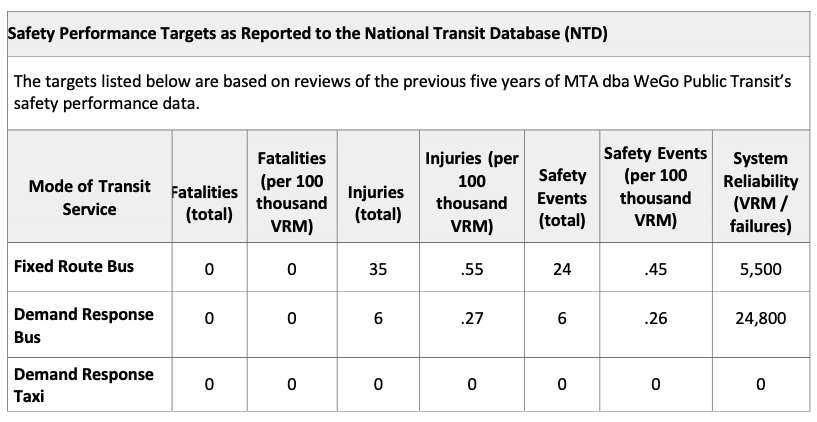

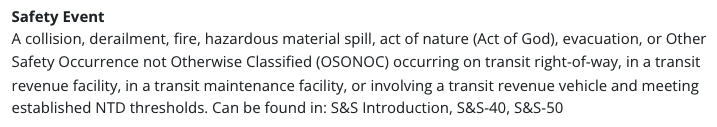

### 3.5.1 Understanding the 'Total Events' Column
<a id='3.5.1_Understanding_the_Total_Events_Column'></a>
The NTD database does not have a column called 'Total Safety Events' so I will verify that the 'Toal Events' column is a total of all the events listed in the definition above from given in the [FTA Glossary](https://www.transit.dot.gov/ntd/national-transit-database-ntd-glossary).

In [6]:
National_events = National_data.iloc[:, 18:24]
Nashville_events = Nashville_data.iloc[:, 18:24]


In [7]:
#Check to see if 'Total Events" captures all data in columns 'Total Collisions', 
#'Total Derailments', 'Total Fires',
#'Total Security Events', and 'Total Events Not Otherwise Classified'

count1 = 0
count2 = 0

for i in National_events.index:
    if sum(National_events.iloc[i,[5]]) != sum(National_events.iloc[i,0:5]):
        count1 += 1
        list5.append(i)

for i in Nashville_events.index:
    if sum(Nashville_events.iloc[i,[5]]) != sum(Nashville_events.iloc[i,0:5]):
        count2 += 1
        list5.append(i)        

print('There are ',count1, "rows where 'Total Events' does not match the sum of the other National columns")
print('There are ',count2, "rows where 'Total Events' does not match the sum of the other Nashville columns")

There are  0 rows where 'Total Events' does not match the sum of the other National columns
There are  0 rows where 'Total Events' does not match the sum of the other Nashville columns


### 3.5.2 Dropping the Columns Captured by 'Total Events'
<a id='3.5.2_Dropping_the_Columns_Captured_by_Total_Events'></a>

In [8]:
National_data.shape

(129752, 26)

In [9]:
Nashville_data.shape

(750, 26)

In [10]:
National_data = National_data.drop(National_data.iloc[:, 18:23], axis=1)
Nashville_data = Nashville_data.drop(Nashville_data.iloc[:, 18:23], axis=1)


In [11]:
National_data.shape

(129752, 21)

In [12]:
Nashville_data.shape

(750, 21)

## 3.6 Creating a 'Date' Column
<a id='3.6_Creating_a_Date_Column'></a>

I will create a datetime column for time series analysis.

In [13]:
# Create date column, assign 1 as the day value

National_data['Date'] = pd.to_datetime(National_data[['Year','Month']].assign(Day=1))
Nashville_data['Date'] = pd.to_datetime(Nashville_data[['Year','Month']].assign(Day=1))

In [14]:
# make the date column the index

National_data = National_data.set_index('Date')
Nashville_data = Nashville_data.set_index('Date')

In [15]:
National_data.head()

,5 DIgit NTD ID,Agency,Organization Type,Mode,Type of Service,Rail (Y/N),Primary UZA Code,Primary UZA Name,Primary UZA Sq Miles,Primary UZA Population,...,Service Area Population,Year,Month,Vehicles,Vehicle Revenue Miles,Vehicle Revenue Hours,Ridership,Total Events,Total Fatalities,Total Injuries
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,8,Tri-County Metropolitan Transportation Distric...,Independent Public Agency or Authority of Tran...,LR,DO,True,24.0,"Portland, OR-WA",524.0,1849898.0,...,1542044.0,2014,1,104,636145,43533,3030400,1,0,1
2014-01-01,8,Tri-County Metropolitan Transportation Distric...,Independent Public Agency or Authority of Tran...,MB,DO,False,24.0,"Portland, OR-WA",524.0,1849898.0,...,1542044.0,2014,1,516,1605059,136485,5235300,6,0,11
2014-01-01,20008,MTA New York City Transit,"Subsidiary Unit of a Transit Agency, Reporting...",DR,PT,False,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,...,8491079.0,2014,1,1579,3704416,317934,474836,11,0,17
2014-01-01,20008,MTA New York City Transit,"Subsidiary Unit of a Transit Agency, Reporting...",HR,DO,True,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,...,8491079.0,2014,1,5232,29283817,1611532,208881579,13,2,9
2014-01-01,20008,MTA New York City Transit,"Subsidiary Unit of a Transit Agency, Reporting...",MB,DO,False,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,...,8491079.0,2014,1,3282,7166888,1013133,57418953,30,1,42


In [16]:
National_data.shape

(129752, 21)

## 3.7 Exploratory Aggregation
<a id='3.7_Exploratory_Aggregation'></a>

### 3.7.1 Time Series of the Features of the Future Target
<a id='3.7.1_Time_Series_of_the_Features_of_the_Future_Target'></a>

|  |  |
|:---------|:-------------|
|Time|Time|
|Dimensions (National)|The Nation|
|Dimensions (Nashville)|Location|
|Features of the Target|Total Fatalities|
||Total Injuries|
||Total Events|
||Vehicle Revenue Miles|


**National Aggregation**

Aggregation at the National level for time series of Total Fatalities, Injuries, Events, and Vehicle Revenue Miles which are the columns I will use to define safety (the target) later in the notebook.  The National_data dataframe has one monthly entry for each mode for each section (as defined in 3.2). The aggregation below (National_FIEVRM_df) yields one single row per month.

In [17]:

National_FIEVRM_df = National_data.groupby('Date').agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum')
)


In [18]:
# 102 rows - each representing of month of National data
# 4 columns - each containing the sum for the entire nation for that month

National_FIEVRM_df.shape

(102, 4)

In [19]:
National_FIEVRM_df.head()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum
Date,,,,
2014-01-01,20,797,531,328452031
2014-02-01,18,853,528,302314486
2014-03-01,23,903,536,332714067
2014-04-01,16,777,505,337326111
2014-05-01,18,998,558,335112466


In [20]:
National_FIEVRM_df.tail()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum
Date,,,,
2022-02-01,28,664,742,274711851
2022-03-01,25,720,767,312390870
2022-04-01,38,620,701,294246129
2022-05-01,28,622,694,299658724
2022-06-01,19,727,681,295103674


In [21]:
plt.style.use('fivethirtyeight')


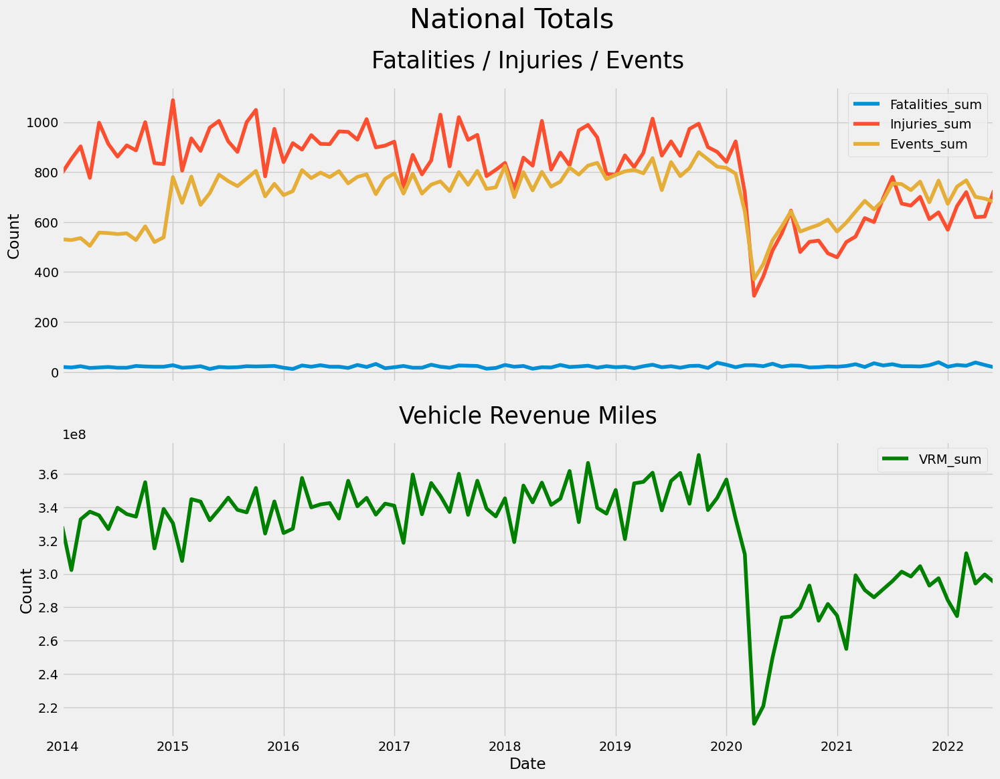

In [22]:
fig, ax =plt.subplots(2,1,figsize=(16,12), sharex=True)
fig.suptitle("National Totals", fontsize=30)
#plt.subplots_adjust(hspace=1)

National_FIEVRM_df[['Fatalities_sum','Injuries_sum','Events_sum']].plot(kind='line',legend=True, ax=ax[0])
ax[0].set_title("Fatalities / Injuries / Events", fontsize=25, pad=20)
ax[0].set_ylabel("Count")
#ax[0].yaxis.set_major_locator(ticker.MultipleLocator(50))


National_FIEVRM_df[['VRM_sum']].plot(kind='line',legend=True, ax=ax[1], color='green')
ax[1].set_title("Vehicle Revenue Miles", fontsize=25, pad=20)
ax[1].set_ylabel("Count")

plt.show()

**Local Aggregation**

Aggregation at the local level for time series of Total Fatalities, Injuries, Events, and Vehicle Revenue Miles which are the columns I will use to define safety (the target) later in the notebook.  The Nashville_data dataframe has one monthly entry for each mode for each section (as defined in 3.2).  The aggregation below (Nashville_FIEVRM_df) looks at one specific location (as defined in 3.2) - Nashville - and yields one single row per month for Nashville only.

In [23]:

location = (National_data['5 DIgit NTD ID'].isin([40178, 40004, 40159])) & \
           (National_data['Primary UZA Name'].isin(['Nashville-Davidson, TN'])) & \
           (National_data['Agency'].isin(['The Transportation Management Association Group',
       'Metropolitan Transit Authority',
       'Regional Transportation Authority']))

subset = National_data[location]


In [24]:
Nashville_FIEVRM_df = subset.groupby('Date').agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum')
)


In [25]:
Nashville_FIEVRM_df.shape

(102, 4)

In [26]:
Nashville_FIEVRM_df.head()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum
Date,,,,
2014-01-01,0,0,0,887200
2014-02-01,0,0,1,831134
2014-03-01,0,2,2,890363
2014-04-01,0,2,2,920397
2014-05-01,0,5,3,907490


In [27]:
Nashville_FIEVRM_df.tail()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum
Date,,,,
2022-02-01,0,2,3,750457
2022-03-01,0,0,0,870772
2022-04-01,1,2,3,863615
2022-05-01,0,5,2,877411
2022-06-01,0,1,1,889281


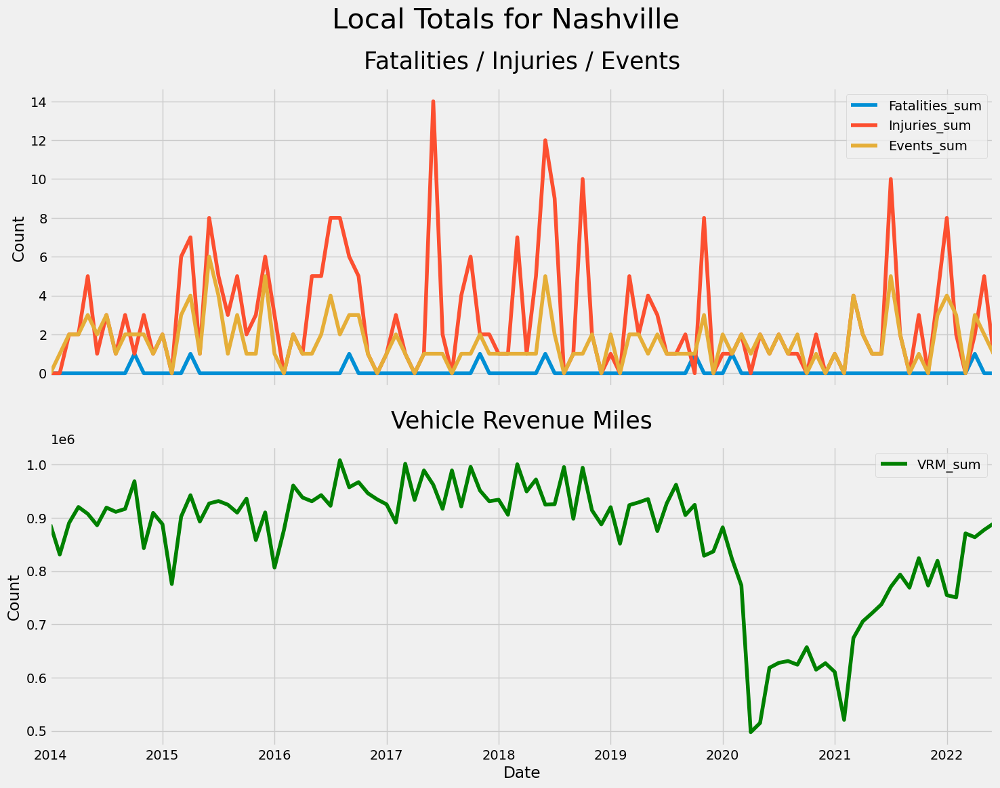

In [28]:
fig, ax =plt.subplots(2,1,figsize=(16,12), sharex=True)
fig.suptitle("Local Totals for Nashville", fontsize=30)
#plt.subplots_adjust(hspace=1)

Nashville_FIEVRM_df[['Fatalities_sum','Injuries_sum','Events_sum']].plot(kind='line',legend=True, ax=ax[0])
ax[0].set_title("Fatalities / Injuries / Events", fontsize=25, pad=20)
ax[0].set_ylabel("Count")

Nashville_FIEVRM_df[['VRM_sum']].plot(kind='line',legend=True, ax=ax[1], color='green')
ax[1].set_title("Vehicle Revenue Miles", fontsize=25, pad=20)
ax[1].set_ylabel("Count")

plt.show()

### 3.7.2 Time Series of the Feature of the Future Target by Mode
<a id='3.7.2_Time_Series_of_the_Future_Target_by_Mode'></a>
Looking at the same features again but this time with respect to mode.  

|  |  |
|:---------|:-------------|
|Time|Time|
|Dimensions (National)|The Nation, Mode|
|Dimensions (Nashville)|Location, Mode|
|Features of the Target|Total Fatalities|
||Total Injuries|
||Total Events|
||Vehicle Revenue Miles|


In [29]:

National_mode_df = National_data.groupby(['Date','Mode']).agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum')
)

In [30]:

Nashville_mode_df = subset.groupby(['Date','Mode']).agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum')
)


In [31]:
National_mode_df.head()

Fatalities_sum  Injuries_sum  Events_sum   VRM_sum
Date       Mode                                                    
2014-01-01 CB                 2            40           6   9799029
           CC                 0             0           0     25284
           CR                 0             0           0  28062564
           DR                 0            76          52  59090140
           HR                 5            31          45  55530393

**National Aggregation**

Looking at the columns which will define safety with respect to each mode on the National level.

In [32]:
# plots four time series lineplots for the features of the target for a given dataframe

def plot_modes_time (title, df):

    fig, ax =plt.subplots(4,1,figsize=(20,30), sharex=True)
    fig.suptitle(title, fontsize=30)

    sns.lineplot(data = df, x = 'Date', y = 'Fatalities_sum', hue = 'Mode', ax=ax[0], palette='Paired')

    sns.lineplot(data = df, x = 'Date', y = 'Injuries_sum', hue = 'Mode', ax=ax[1], palette='Paired')

    sns.lineplot(data = df, x = 'Date', y = 'Events_sum', hue = 'Mode', ax=ax[2], palette='Paired')

    sns.lineplot(data = df, x = 'Date', y = 'VRM_sum', hue = 'Mode', ax=ax[3], palette='Paired')

    plt.show()
    

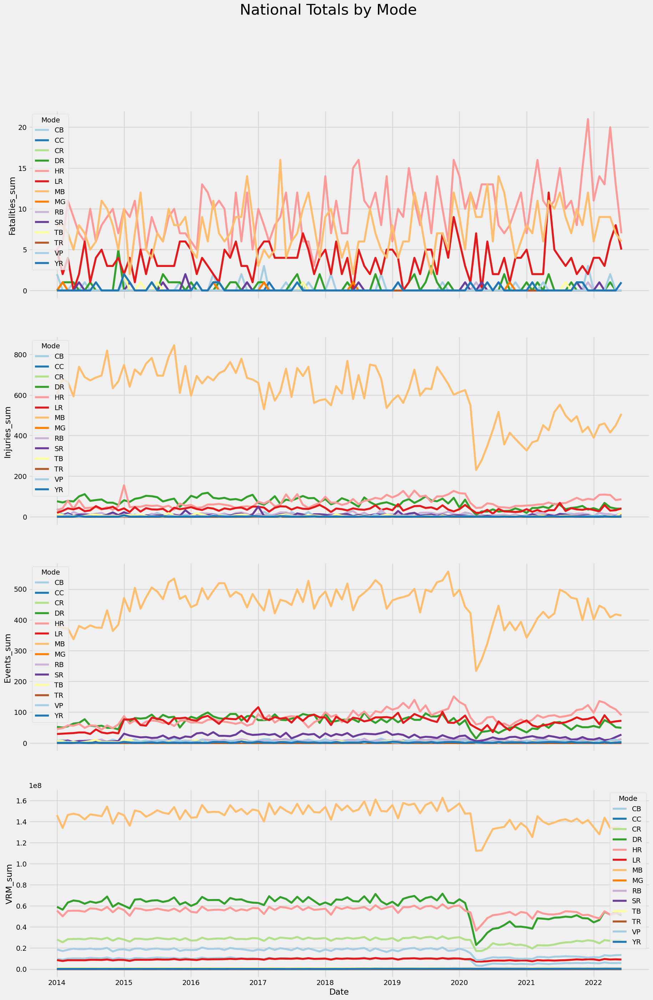

In [33]:
plot_modes_time("National Totals by Mode", National_mode_df)

**Local Aggregation**

Looking at the columns which will define safety with respect to each mode on the local level for Nashville only.

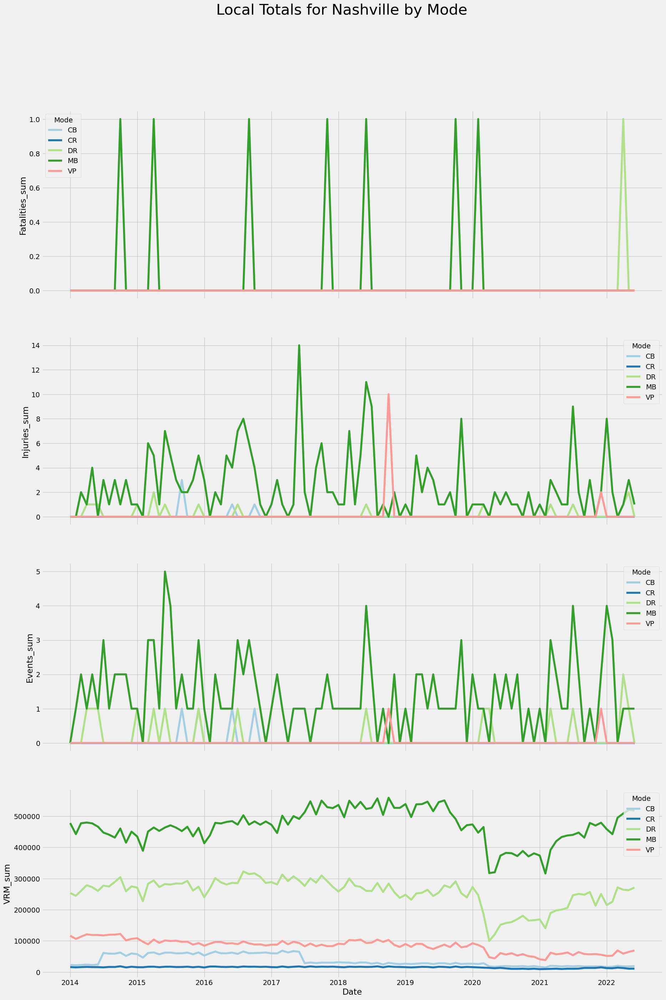

In [34]:
plot_modes_time("Local Totals for Nashville by Mode", Nashville_mode_df)


### 3.7.3 Time Series Examining Light Rail
<a id='3.7.3_Time_Series_Examining_Light_Rail'></a>
Here, I'll take a look at the statistics for a subset of locations which have modes that are exactly the same as Nashville's.  Then I'll take a look at locations which have modes up to an including the ones that Nashville has and I'll compare them to locations which have those modes plus light rail.

Since I am looking for areas approximating the city level with no further subsetting for service areas, I will use locations instead of sections (both defined in 3.2).


In [35]:
# Creating a column which contains all modes for that 'Primary UZA Name'
# in alphabetical order

National_data_copy = National_data.copy()
National_data_copy = National_data_copy.sort_values(by='Mode')
National_data_copy

df = National_data_copy.groupby('Primary UZA Name').agg(
    all_Modes = ('Mode', 'unique')
)

National_data = National_data.join(df, on='Primary UZA Name')

In [36]:
National_data['all_Modes'] = National_data['all_Modes'].astype('string')
National_data['all_Modes'].dtype

string[python]

**Part 1: Locations with exactly the same modes as Nashville**

In [37]:
# extracts specific value from a column

def extract_values_from_column(the_df, the_col, the_values):
    return the_df.loc[the_df[the_col] == (the_values)]

In [38]:
modes_same_as_Nashville_df = extract_values_from_column(
    National_data, 'all_Modes',("['CB' 'CR' 'DR' 'MB' 'VP']"))


In [39]:
modes_same_as_Nashville_df.shape

(1384, 22)

In [40]:
modes_same_as_Nashville_df['Primary UZA Name'].unique()

array(['Stockton, CA', 'Nashville-Davidson, TN'], dtype=object)

Since there is only one other location that has exactly the same modes as Nashville, the data will be insufficient for modeling, but I will take a look at the two here.

In [41]:
modes_subset_same_as_Nashville = modes_same_as_Nashville_df.groupby(['Date', 'Primary UZA Name']).agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum'),
    P_UZA_SM_sum = ('Primary UZA Sq Miles', 'sum'),
    P_UZA_P_sum = ('Primary UZA Population', 'sum'),
    SA_SM_sum = ('Service Area Sq Miles', 'sum'),
    SA_P_sum = ('Service Area Population', 'sum'),
    Ridership_sum = ('Ridership','sum')
)

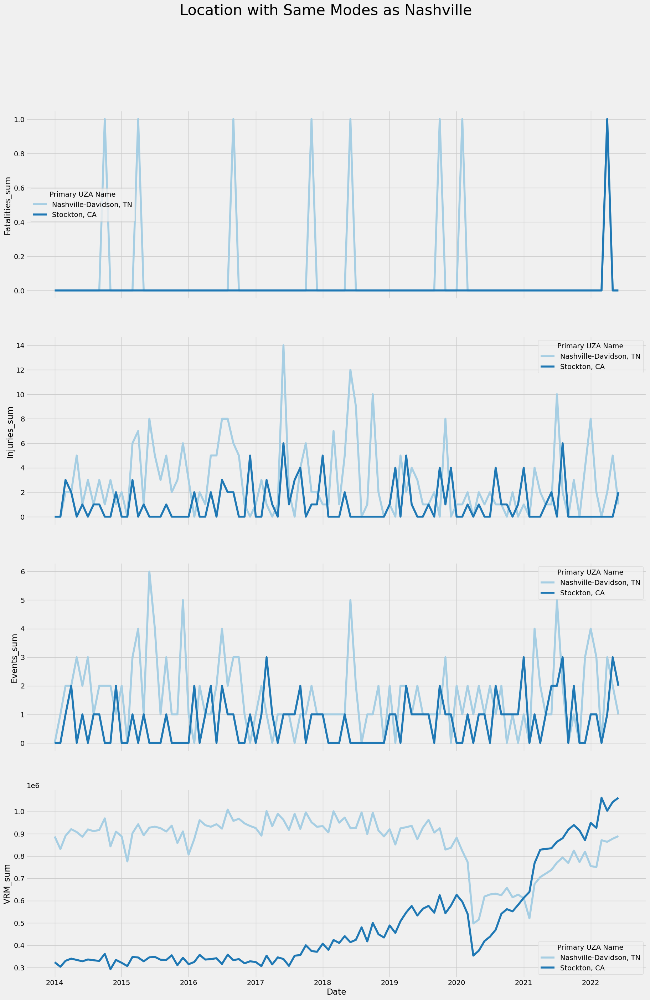

In [42]:
fig, ax =plt.subplots(4,1,figsize=(20,30), sharex=True)
fig.suptitle("Location with Same Modes as Nashville", fontsize=30)

sns.lineplot(data = modes_subset_same_as_Nashville, x = 'Date', y = 'Fatalities_sum', hue = 'Primary UZA Name', ax=ax[0], palette='Paired')

sns.lineplot(data = modes_subset_same_as_Nashville, x = 'Date', y = 'Injuries_sum', hue = 'Primary UZA Name', ax=ax[1], palette='Paired')

sns.lineplot(data = modes_subset_same_as_Nashville, x = 'Date', y = 'Events_sum', hue = 'Primary UZA Name', ax=ax[2], palette='Paired')

sns.lineplot(data = modes_subset_same_as_Nashville, x = 'Date', y = 'VRM_sum', hue = 'Primary UZA Name', ax=ax[3], palette='Paired')

plt.show()

**Part 2: Locations with modes up to and including Nashville's and, both separately and collectively, locations with modes up to and including Nashville's but which also have light rail.**

In [43]:
# extracts values from a column given a list of potential values to match

def extract_more_values_from_column(the_df, the_col, the_values):
    return the_df.loc[the_df[the_col].isin(the_values)]

In [44]:
# locations with modes up to and including those that Nashville has.

modes_similar_to_Nashville = extract_more_values_from_column(National_data, 'all_Modes', 
                                ("['DR' 'MB']", 
                                 "['CB' 'DR' 'MB' 'VP']", 
                                 "['DR' 'MB' 'VP']", 
                                 "['CB' 'MB']", 
                                 "['CB' 'DR' 'MB']", 
                                 "['MB']", "['DR']", 
                                 "['CB' 'DR']", 
                                 "['CR' 'MB']", 
                                 "['CB' 'CR' 'DR' 'MB' 'RB']", 
                                 "['CR' 'DR' 'MB']", 
                                 "['CB']", 
                                 "['DR' 'VP']", 
                                 "['VP']"))


In [45]:
temp = modes_similar_to_Nashville['Primary UZA Name'].nunique()
print("Number of locations with modes up to and including those that Nashville has:", temp)


Number of locations with modes up to and including those that Nashville has: 261


In [46]:
# those locations above plus those with added light rail

modes_similar_to_Nashville_plus_LR = extract_more_values_from_column(National_data, 'all_Modes', 
                                ("['DR' 'MB']", 
                                 "['CB' 'DR' 'MB' 'VP']", 
                                 "['DR' 'MB' 'VP']", 
                                 "['CB' 'MB']", 
                                 "['CB' 'DR' 'MB']", 
                                 "['MB']", "['DR']", 
                                 "['CB' 'DR']", 
                                 "['CR' 'MB']", 
                                 "['CB' 'CR' 'DR' 'MB' 'RB']", 
                                 "['CR' 'DR' 'MB']", 
                                 "['CB']", 
                                 "['DR' 'VP']", 
                                 "['VP']", 
                                 "['DR' 'LR' 'MB' 'VP']", 
                                 "['CB' 'CR' 'DR' 'LR' 'MB' 'VP']", 
                                 "['CB' 'DR' 'LR' 'MB' 'VP']", 
                                 "['CR' 'DR' 'LR' 'MB' 'VP']", 
                                 "['DR' 'LR' 'MB']", ))


In [47]:
temp2 = modes_similar_to_Nashville_plus_LR['Primary UZA Name'].nunique()
print("Number of locations with modes up to and including those that Nashville has plus light rail:", temp2)


Number of locations with modes up to and including those that Nashville has plus light rail: 270


In [48]:
# the locations which are in the second dataframe (which added light rail)
# but which are not in the first

modes_LR = extract_more_values_from_column(National_data, 'all_Modes', 
                                ("['DR' 'LR' 'MB' 'VP']", 
                                 "['CB' 'CR' 'DR' 'LR' 'MB' 'VP']", 
                                 "['CB' 'DR' 'LR' 'MB' 'VP']", 
                                 "['CR' 'DR' 'LR' 'MB' 'VP']", 
                                 "['DR' 'LR' 'MB']", ))


In [49]:
temp3 = modes_LR['Primary UZA Name'].nunique()
print("Number of locations which are in the second dataframe (which added light rail) but which are not in the first:", temp3)


Number of locations which are in the second dataframe (which added light rail) but which are not in the first: 9


In [50]:
# aggregates columns of a given dataframe by mean

def agg_mean(df):

    df = df.groupby('Date').agg(
        Fatalities_avg=('Total Fatalities', 'mean'),
        Injuries_avg=('Total Injuries', 'mean'),
        Events_avg=('Total Events', 'mean'),
        VRM_avg=('Vehicle Revenue Miles','mean'),
        P_UZA_SM_avg = ('Primary UZA Sq Miles', 'mean'),
        P_UZA_P_avg = ('Primary UZA Population', 'mean'),
        SA_SM_avg = ('Service Area Sq Miles', 'mean'),
        SA_P_avg = ('Service Area Population', 'mean'),
        Ridership_avg = ('Ridership','mean')
    )
    return df


In [51]:
modes_subset = agg_mean(modes_similar_to_Nashville)
#modes_subset

In [52]:
modes_subset_plus_LR = agg_mean(modes_similar_to_Nashville_plus_LR)
#modes_subset_plus_LR

In [53]:
modes_subset_LR = agg_mean(modes_LR)
#modes_subset_LR

In [54]:
# plots the specified features for the three dataframes above

def plot_features(features):

    fig, ax =plt.subplots(3,1,figsize=(16,16), sharex=True, sharey=True)
    fig.suptitle("Locations with Modes Similar to Nashville's", fontsize=30)
    plt.subplots_adjust(hspace=1)

    modes_subset[features].plot(kind='line',legend=True, ax=ax[0])
    ax[0].set_title("Locations with Modes up to and Including Nashville's", fontsize=25, pad=20)
    ax[0].set_ylabel("Count")

    modes_subset_plus_LR[features].plot(kind='line',legend=True, ax=ax[1])
    ax[1].set_title("Locations with Modes up to and Including Nashville's\nPlus Light Rail", fontsize=25, pad=20)
    ax[1].set_ylabel("Count")


    modes_subset_LR[features].plot(kind='line',legend=True, ax=ax[2])
    ax[2].set_title("Subset of Locations Included in Second Graph but Not Included in First", fontsize=25, pad=20)
    ax[2].set_ylabel("Count")

    plt.show()

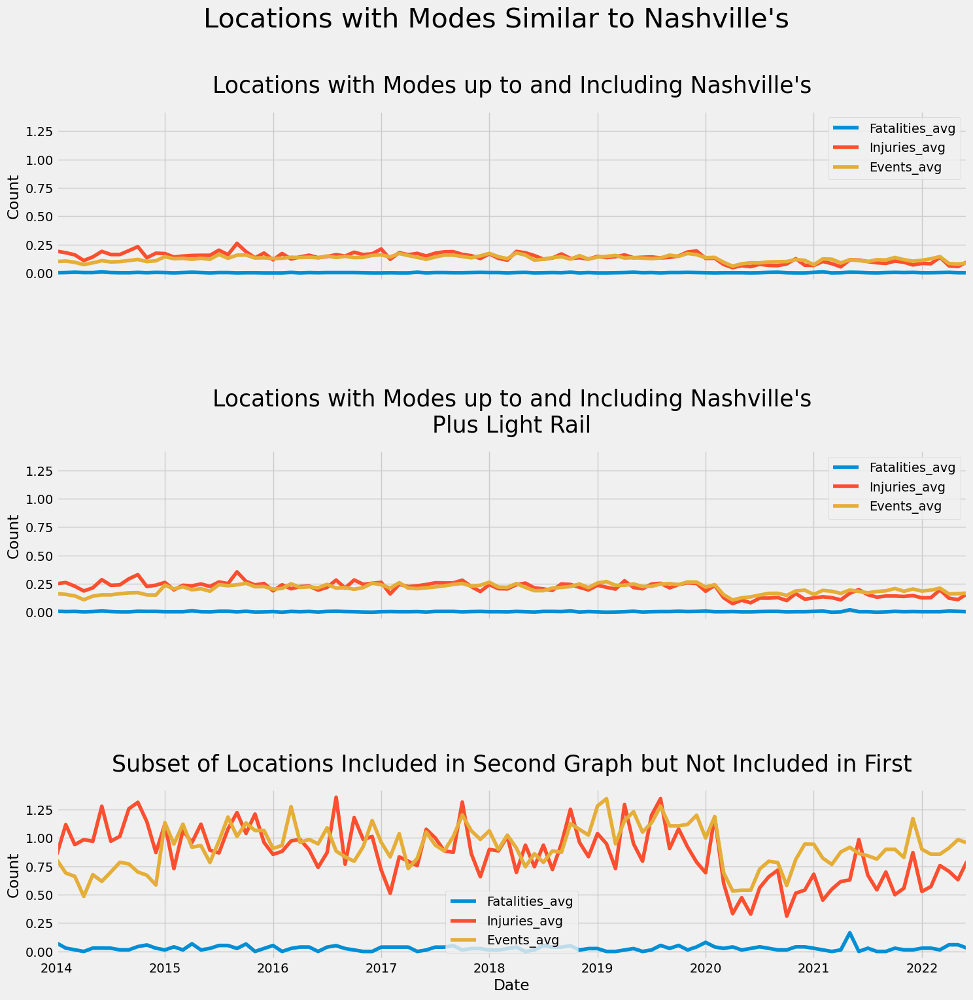

In [55]:
plot_features(['Fatalities_avg','Injuries_avg','Events_avg'])

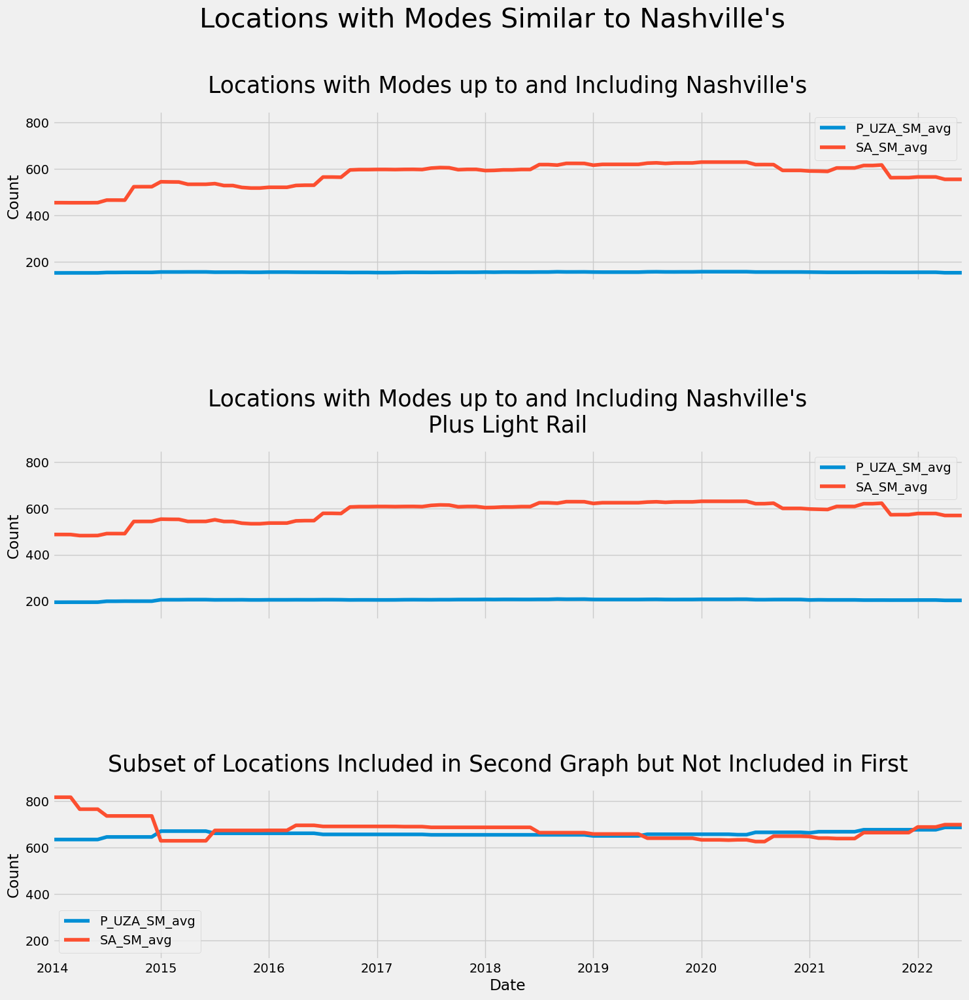

In [56]:
plot_features(['P_UZA_SM_avg','SA_SM_avg'])


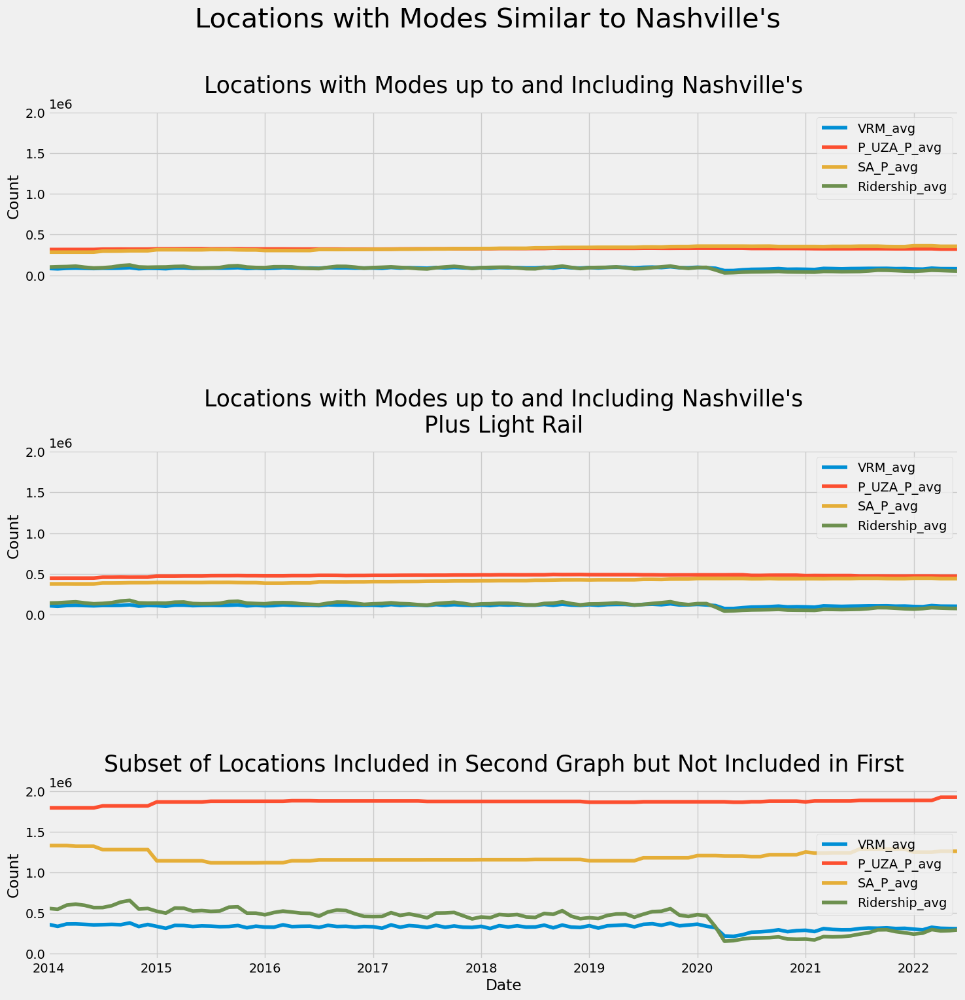

In [57]:
plot_features(['VRM_avg','P_UZA_P_avg','SA_P_avg','Ridership_avg'])


Through these visuals, I can see that the nine locations with modes up to an including Nashville's but which include light rail have a substantially greater average population size for both the primary UZA and the service area.  They also have an appreciable increase in the average number of vehicle revenue miles and ridership.

## 3.8 First Modeling Dataframe: Aggregated by Time for the Whole Nation
<a id='3.8_First_Modeling_Dataframe'></a>


### 3.8.1 Encoding the Data for Modeling
<a id='3.8.1_Encoding_the_Data_for_Modeling'></a>


In [58]:
# saving a copy of the National dataframe which has not been encoded for use later

National_data_before_encoding = National_data.copy()

In [59]:
National_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 129752 entries, 2014-01-01 to 2022-06-01
Data columns (total 22 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   5 DIgit NTD ID           129752 non-null  int64  
 1   Agency                   129752 non-null  object 
 2   Organization Type        129752 non-null  object 
 3   Mode                     129752 non-null  object 
 4   Type of Service          129752 non-null  object 
 5   Rail (Y/N)               129752 non-null  bool   
 6   Primary UZA Code         129752 non-null  float64
 7   Primary UZA Name         129752 non-null  object 
 8   Primary UZA Sq Miles     129752 non-null  float64
 9   Primary UZA Population   129752 non-null  float64
 10  Service Area Sq Miles    129752 non-null  float64
 11  Service Area Population  129752 non-null  float64
 12  Year                     129752 non-null  int64  
 13  Month                    129752 non-null  i

#### 3.8.1.1 Encoding the Categorical Features
<a id= '3.8.1.1_Encoding_the_Categorical_Features'></a>
Time to encode the categorical variables: 'Organization Type', 'Mode', and 'Type of Service'.  Since the names for the types of organizations are so long, I will map them to letters of the alphabet based on the number of times they appear in the National dataframe.

In [60]:
National_data['Organization Type'].value_counts()

Independent Public Agency or Authority of Transit Service                68469
City, County or Local Government Unit or Department of Transportation    46395
MPO, COG or Other Planning Agency                                         2790
State Government Unit or Department of Transportation                     2304
Other Publicly-Owned or Privately Chartered Corporation                   1918
Subsidiary Unit of a Transit Agency, Reporting Separately                 1866
Private-Non-Profit Corporation                                            1721
Private-For-Profit Corporation                                            1573
University                                                                1278
Private Provider Reporting on Behalf of a Public Entity                   1180
Other                                                                      132
Consolidated Reporter                                                      126
Name: Organization Type, dtype: int64

In [61]:
# Renames the Organization Types so the dummied column names won't be so cumbersome

def map_org_type(df):
    df['Organization Type'] = df['Organization Type'].map({
        'Independent Public Agency or Authority of Transit Service' : 'A',
        'Subsidiary Unit of a Transit Agency, Reporting Separately' : 'F',
        'City, County or Local Government Unit or Department of Transportation': 'B',
        'University': 'I',
        'Consolidated Reporter': 'L',
        'Other': 'K',
        'Private-For-Profit Corporation': 'H',
        'Private Provider Reporting on Behalf of a Public Entity': 'J',
        'MPO, COG or Other Planning Agency': 'C',
        'State Government Unit or Department of Transportation': 'D',
        'Private-Non-Profit Corporation': 'G',
        'Other Publicly-Owned or Privately Chartered Corporation': 'E'})


In [62]:
map_org_type(National_data)

In [63]:
National_data = pd.get_dummies(National_data, columns=[
    'Mode','Organization Type','Type of Service'], prefix=['M','OT','ToS'])


In [64]:
National_data.shape

(129752, 49)

In [65]:
National_data.columns

Index(['5 DIgit NTD ID', 'Agency', 'Rail (Y/N)', 'Primary UZA Code',
       'Primary UZA Name', 'Primary UZA Sq Miles', 'Primary UZA Population',
       'Service Area Sq Miles', 'Service Area Population', 'Year', 'Month',
       'Vehicles', 'Vehicle Revenue Miles', 'Vehicle Revenue Hours',
       'Ridership', 'Total Events', 'Total Fatalities', 'Total Injuries',
       'all_Modes', 'M_CB', 'M_CC', 'M_CR', 'M_DR', 'M_HR', 'M_LR', 'M_MB',
       'M_MG', 'M_RB', 'M_SR', 'M_TB', 'M_TR', 'M_VP', 'M_YR', 'OT_A', 'OT_B',
       'OT_C', 'OT_D', 'OT_E', 'OT_F', 'OT_G', 'OT_H', 'OT_I', 'OT_J', 'OT_K',
       'OT_L', 'ToS_DO', 'ToS_PT', 'ToS_TN', 'ToS_TX'],
      dtype='object')

#### 3.8.1.2 Creating '...OTHER' Columns for Mode and Organization Type
<a id='3.8.1.2_Creating_OTHER_Columns_for_Mode_and_Organization_Type'></a>
I will reduce the number of mode columns in the following manner:  I will leave separate columns for all modes which Nashville currently has and also for light rail, which Nashville might consider adding.  All other modes will be combined into the M_OTHER column.  

I will reduce the number of organization type columns by one by combining the OT_K and OT_L columns into an OT_OTHER column since the number of occurrences for these two organization types in the database is very low.

In [66]:
National_data['M_OTHER'] = (National_data['M_CC'] + National_data['M_HR'] +
                            National_data['M_MG'] + National_data['M_RB'] + 
                            National_data['M_SR'] + National_data['M_TB'] + 
                            National_data['M_TR'] + National_data['M_YR'])

National_data['OT_OTHER'] = (National_data['OT_K'] + National_data['OT_L'])


### 3.8.2 Aggregating the Data for Modeling
<a id='3.8.2_Aggregating_the_Data_for_Modeling'></a>
**Choosing the features:**

'Primary UZA Code' and 'Primary UZA Population' are both ordinal representations of the ranking of population size.  However, 'Primary UZA Code' has the one value (602) which is out of place.  So, 'Primary UZA Population' will be used.

The columns 'Vehicles' and 'Vehicle Revenue Hours' will not be used because they are too closely related to 'Vehicle Revenue Miles' which will be used to calculate the target.

**Understanding the aggregation:**

This aggregation will use all of the National data and will result in one single row of data for each month.  This aggregation will come together in two parts which will then be joined into one new dataframe.


|  |  |
|:---------|:-------------|
|Time|Time|
|Dimensions|The Nation|
|Features|Mode (encoded and reduced)|
||Type of Service (ecoded)|
||Organization Type (encoded and reduced)|
||Primary UZA Sq Miles|
||Primary UZA Population|
||Service Area Sq Miles|
||Service Area Population|
||Ridership|
|Target|Safety Ratio|



#### 3.8.2.1 Part 1 of Aggregation
<a id='3.8.2.1_Part_1_of_Aggregation'></a>

Handling all of the columns which can simply be summed (modeling_df_piece_1).  Fatalities, Injuries, Events, and VRM yield a number representing the total number of occurrances for the nation for that month.

The encoded categorical variables will reflect the number of times they occurred in the database during that month.  For example, if in the original data (National_data) there were 50 rows of data for the 'DO' type of service for a given month, then that month's row will have the value of 50 for ToS_DO in the new dataframe.

In [67]:
modeling_df_piece_1 = National_data.groupby(['Date']).agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum'),
    Ridership_sum = ('Ridership','sum'),
    M_CB_Count = ('M_CB', 'sum'),
    M_CR_Count = ('M_CR', 'sum'),
    M_DR_Count = ('M_DR', 'sum'),
    M_MB_Count = ('M_MB', 'sum'),
    M_VP_Count = ('M_VP', 'sum'),
    M_LR_Count = ('M_LR', 'sum'),
    M_OTHER_Count = ('M_OTHER', 'sum'),
    OT_A_Count = ('OT_A', 'sum'),
    OT_B_Count = ('OT_B', 'sum'),
    OT_C_Count = ('OT_C', 'sum'),
    OT_D_Count = ('OT_D', 'sum'),
    OT_E_Count = ('OT_E', 'sum'),
    OT_F_Count = ('OT_F', 'sum'),
    OT_G_Count = ('OT_G', 'sum'),
    OT_H_Count = ('OT_H', 'sum'),
    OT_I_Count = ('OT_I', 'sum'),
    OT_J_Count = ('OT_J', 'sum'),
    OT_OTHER_Count = ('OT_OTHER', 'sum'),
    ToS_DO_Count = ('ToS_DO', 'sum'),
    ToS_PT_Count = ('ToS_PT', 'sum'),
    ToS_TN_Count = ('ToS_TN', 'sum'),
    ToS_TX_Count = ('ToS_TX', 'sum')
).reset_index()


In [68]:
modeling_df_piece_1.shape


(102, 28)

In [69]:
modeling_df_piece_1.head()

,Date,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,M_CB_Count,M_CR_Count,M_DR_Count,M_MB_Count,...,OT_F_Count,OT_G_Count,OT_H_Count,OT_I_Count,OT_J_Count,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count
0,2014-01-01,20,797,531,328452031,808103664,100,23,523.0,471.0,...,28,16,21,9,14,14,690.0,502.0,0,73
1,2014-02-01,18,853,528,302314486,788740957,100,23,523.0,471.0,...,28,16,21,9,14,14,689.0,502.0,0,73
2,2014-03-01,23,903,536,332714067,888517154,100,23,522.0,471.0,...,28,16,21,9,14,14,689.0,502.0,0,72
3,2014-04-01,16,777,505,337326111,895729521,100,23,522.0,471.0,...,28,16,21,9,14,14,689.0,502.0,0,72
4,2014-05-01,18,998,558,335112466,898413957,101,24,521.0,471.0,...,28,16,21,9,14,14,689.0,504.0,0,72


#### 3.8.2.2 Part 2 of Aggregation
<a id='3.8.2.2_Part_2_of_Aggregation'></a>

Handling the four columns with land area size and population.  First I will take the average of each within a given location yielding one single value per location per month (temp_df).

Then, I will add the values of each location together, yielding one single value per month for each of the four columns (modeling_df_piece_2).

In [70]:
# Step 1: averaging within each location
# for example, averaging within Houston TX so Houston has only one value

temp_df = National_data.groupby(['Primary UZA Name', 'Date']).agg(
    P_UZA_SM_avg = ('Primary UZA Sq Miles', 'mean'),
    P_UZA_P_avg = ('Primary UZA Population', 'mean'),
    SA_SM_avg = ('Service Area Sq Miles', 'mean'),
    SA_P_avg = ('Service Area Population', 'mean'),
).reset_index()



In [71]:
temp_df.shape

(30143, 6)

In [72]:
temp_df.head()

,Primary UZA Name,Date,P_UZA_SM_avg,P_UZA_P_avg,SA_SM_avg,SA_P_avg
0,"Aberdeen-Bel Air South-Bel Air North, MD",2014-01-01,131.0,213751.0,131.0,218590.0
1,"Aberdeen-Bel Air South-Bel Air North, MD",2014-02-01,131.0,213751.0,131.0,218590.0
2,"Aberdeen-Bel Air South-Bel Air North, MD",2014-03-01,131.0,213751.0,131.0,218590.0
3,"Aberdeen-Bel Air South-Bel Air North, MD",2014-04-01,131.0,213751.0,131.0,218590.0
4,"Aberdeen-Bel Air South-Bel Air North, MD",2014-05-01,131.0,213751.0,131.0,218590.0


In [73]:
# Step 2: summing the values for each location
# for example, this adds the value found above for Houston 
# to the value for Las Vegas, and so on.

modeling_df_piece_2 = temp_df.groupby('Date').agg(
    P_UZA_SM_National = ('P_UZA_SM_avg','sum'),
    P_UZA_P_National = ('P_UZA_P_avg','sum'),
    SA_SM_National = ('SA_SM_avg','sum'),
    SA_P_National = ('SA_SM_avg','sum')
)
modeling_df_piece_2 = modeling_df_piece_2.round(0)
modeling_df_piece_2

,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National
Date,,,,
2014-01-01,76481.0,202972229.0,139017.0,139017.0
2014-02-01,76481.0,202972229.0,139017.0,139017.0
2014-03-01,76481.0,202972229.0,139017.0,139017.0
2014-04-01,76481.0,202972229.0,137849.0,137849.0
2014-05-01,76481.0,202972229.0,137469.0,137469.0
...,...,...,...,...
2022-02-01,75595.0,201454487.0,169562.0,169562.0
2022-03-01,75595.0,201454487.0,169460.0,169460.0
2022-04-01,74400.0,198790730.0,166154.0,166154.0


#### 3.8.2.3 Joining Part 1 and Part 2
<a id='3.8.2.3_Joining_Part_1_and_Part_2'></a>

Joining the two pieces together to create one dataframe (modeling_df).

In [74]:
modeling_df = modeling_df_piece_1.join(modeling_df_piece_2, on='Date')


In [75]:
modeling_df = modeling_df.set_index('Date')

In [76]:
modeling_df.shape

(102, 31)

In [77]:
modeling_df.head()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,M_CB_Count,M_CR_Count,M_DR_Count,M_MB_Count,M_VP_Count,...,OT_J_Count,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,20,797,531,328452031,808103664,100,23,523.0,471.0,73,...,14,14,690.0,502.0,0,73,76481.0,202972229.0,139017.0,139017.0
2014-02-01,18,853,528,302314486,788740957,100,23,523.0,471.0,72,...,14,14,689.0,502.0,0,73,76481.0,202972229.0,139017.0,139017.0
2014-03-01,23,903,536,332714067,888517154,100,23,522.0,471.0,72,...,14,14,689.0,502.0,0,72,76481.0,202972229.0,139017.0,139017.0
2014-04-01,16,777,505,337326111,895729521,100,23,522.0,471.0,72,...,14,14,689.0,502.0,0,72,76481.0,202972229.0,137849.0,137849.0
2014-05-01,18,998,558,335112466,898413957,101,24,521.0,471.0,72,...,14,14,689.0,504.0,0,72,76481.0,202972229.0,137469.0,137469.0


#### 3.8.2.4 Checking the Aggregation
<a id='3.8.2.4_Checking_the_Aggregation'></a>

In [78]:
# Checks part 1 of the aggregation 

def check_agg_part_1(category, specific, date, mod_df, Nat_df, mod_column, Nat_column):

    print ('\033[1m' + 'Checking Part 1 of Aggregation: ', '\033[0m')
    print("Comparing two calculation for the", category, specific, "for", date)

    e = mod_df[mod_df.index==date]
    e = e[mod_column].loc[e.index==date].item()
    print('modeling dataframe value:', e)

    Check_specific = Nat_df[Nat_df.index==date]
    f = Check_specific[Nat_column].sum()
    print('checked value:', f)


In [79]:
check_agg_part_1('type of service','DO', '2016-08-01', 
                 modeling_df, National_data, 'ToS_DO_Count', 'ToS_DO')

Checking Part 1 of Aggregation:  
Comparing two calculation for the type of service DO for 2016-08-01
modeling dataframe value: 689.0
checked value: 689


In [80]:
# Cheks part 2 step 1 of the aggregation

def check_agg_part_2_step_1(mod_column, Nat_column, location, date, mod_df, Nat_df):

    print ('\033[1m' + 'Checking Part 2 Step 1 of Aggregation: ','\033[0m')
    print("Comparing two calculation for the average", Nat_column, "for", location, date)

    a = mod_df[mod_df['Primary UZA Name']==location]
    a = a[mod_column].loc[a['Date']==date].item()
    print('modeling dataframe value:', a)

    Check_location = Nat_df[Nat_df['Primary UZA Name']==location]
    Check_location = Check_location[Check_location.index==date]

    b = Check_location[Nat_column].mean()
    print('checked value:', b)


In [81]:
check_agg_part_2_step_1('SA_SM_avg', 'Service Area Sq Miles', 'Stockton, CA', 
                        '2021-02-01', temp_df, National_data)


Checking Part 2 Step 1 of Aggregation:  
Comparing two calculation for the average Service Area Sq Miles for Stockton, CA 2021-02-01
modeling dataframe value: 1226.2857142857142
checked value: 1226.2857142857142


In [82]:
# Checks part 2 step 2 of the aggregation

def check_agg_part_2_step_2(mod_column, Nat_column, date, mod_df, temp_df):

    print ('\033[1m' + 'Checking Part 2 Step 2 of Aggregation: ','\033[0m')
    print("Comparing two calculation for the total", Nat_column, "for", date)

    c = mod_df[mod_df.index==date]
    c = c[mod_column].loc[c.index==date].item()
    print('modeling dataframe value:', c)

    Check_date = temp_df[temp_df['Date']==date]
    Check_date = Check_date.drop_duplicates(subset='Primary UZA Name', keep="first")
    Check_date

    d = Check_date[Nat_column].sum()
    print('checked value:', d)


In [83]:
check_agg_part_2_step_2('P_UZA_SM_National', 'P_UZA_SM_avg', '2022-06-01', 
                        modeling_df_piece_2, temp_df)


Checking Part 2 Step 2 of Aggregation:  
Comparing two calculation for the total P_UZA_SM_avg for 2022-06-01
modeling dataframe value: 74400.0
checked value: 74400.0


### 3.8.3 Creating the Target
<a id='3.8.3_Creating_the_Target'></a>

#### 3.8.3.1 Creating the 'Safety Ratio' Column
<a id='3.8.3.1_Creating_the_Safety_Ratio_Column'></a>
Here I will define the target (dependent variable, y) from the aggregated data using this formula:

SAFETY RATIO = ((FATALITIES + INJURIES + EVENTS)/ VEHICLE REVENUE MILES) * 100000

In [84]:
# Creates the target ('Safety Ratio') column

def create_target (df):
    National_Safety = (df['Fatalities_sum'] + df['Injuries_sum'] + df['Events_sum'])
    df['Safety Ratio'] = (National_Safety/df['VRM_sum'])*100000


In [85]:
create_target(modeling_df)
modeling_df.head()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,M_CB_Count,M_CR_Count,M_DR_Count,M_MB_Count,M_VP_Count,...,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National,Safety Ratio
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,20,797,531,328452031,808103664,100,23,523.0,471.0,73,...,14,690.0,502.0,0,73,76481.0,202972229.0,139017.0,139017.0,0.410410
2014-02-01,18,853,528,302314486,788740957,100,23,523.0,471.0,72,...,14,689.0,502.0,0,73,76481.0,202972229.0,139017.0,139017.0,0.462763
2014-03-01,23,903,536,332714067,888517154,100,23,522.0,471.0,72,...,14,689.0,502.0,0,72,76481.0,202972229.0,139017.0,139017.0,0.439416
2014-04-01,16,777,505,337326111,895729521,100,23,522.0,471.0,72,...,14,689.0,502.0,0,72,76481.0,202972229.0,137849.0,137849.0,0.384791
2014-05-01,18,998,558,335112466,898413957,101,24,521.0,471.0,72,...,14,689.0,504.0,0,72,76481.0,202972229.0,137469.0,137469.0,0.469693


In [86]:
modeling_df['Safety Ratio'].isna().sum()

0

In [87]:
#In rows where there were no fatalities, injuries, or events, 
#I end up with Nans because I have divided by zero.  
#I will replace the Nans with zeros since that is the logical value.

#modeling_df['Safety Ratio'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
#modeling_df['Safety Ratio'].isna().sum()


In [88]:
#modeling_df['Safety Ratio'].isna().sum()

#### 3.8.3.2 Dropping the Columns Used to Calculate 'Safety Ratio'
<a id='3.8.3.2_Dropping_the_Columns_Used_to_Calculate_Safety_Ratio'></a>
I will now drop the 'VRM_sum', 'Fatalities_sum', 'Injuries_sum', and 'Events_sum' columns since they are accounted for in the new 'Safety Ratio' column.

In [89]:
modeling_df = modeling_df.drop(['VRM_sum', 'Fatalities_sum','Injuries_sum','Events_sum'], axis=1)


In [90]:
modeling_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 102 entries, 2014-01-01 to 2022-06-01
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Ridership_sum      102 non-null    int64  
 1   M_CB_Count         102 non-null    uint8  
 2   M_CR_Count         102 non-null    uint8  
 3   M_DR_Count         102 non-null    float64
 4   M_MB_Count         102 non-null    float64
 5   M_VP_Count         102 non-null    uint8  
 6   M_LR_Count         102 non-null    uint8  
 7   M_OTHER_Count      102 non-null    uint8  
 8   OT_A_Count         102 non-null    float64
 9   OT_B_Count         102 non-null    float64
 10  OT_C_Count         102 non-null    uint8  
 11  OT_D_Count         102 non-null    uint8  
 12  OT_E_Count         102 non-null    uint8  
 13  OT_F_Count         102 non-null    uint8  
 14  OT_G_Count         102 non-null    uint8  
 15  OT_H_Count         102 non-null    uint8  
 16  OT_I_Co

### 3.8.4 Exploring the Data
<a id='3.8.4_Exploring_the_Data'></a>
I will take a new look at the statistics and relationships now that the target and features are now clearly defined.

In [91]:
modeling_df.describe()

,Ridership_sum,M_CB_Count,M_CR_Count,M_DR_Count,M_MB_Count,M_VP_Count,M_LR_Count,M_OTHER_Count,OT_A_Count,OT_B_Count,...,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National,Safety Ratio
count,1.020000e+02,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,...,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,1.020000e+02,102.000000,102.000000,102.000000
mean,6.966535e+08,93.284314,26.215686,517.656863,466.823529,81.058824,22.970588,64.068627,671.264706,454.852941,...,2.529412,663.970588,540.735294,2.009804,65.362745,75902.843137,2.021085e+08,173451.519608,173451.519608,0.473897
std,2.143982e+08,7.281303,1.958113,5.669957,5.569385,5.610851,0.169792,5.618674,14.363683,12.768616,...,4.658020,20.913048,18.962144,2.615624,5.083051,363.911717,7.648930e+05,13664.396037,13664.396037,0.042941
min,1.575090e+08,83.000000,23.000000,507.000000,454.000000,72.000000,22.000000,52.000000,642.000000,433.000000,...,0.000000,629.000000,502.000000,0.000000,54.000000,74400.000000,1.987907e+08,137469.000000,137469.000000,0.334532
25%,4.917120e+08,87.000000,24.000000,513.000000,463.000000,75.000000,23.000000,61.000000,665.000000,443.250000,...,0.000000,647.250000,527.000000,0.000000,62.250000,75682.000000,2.016423e+08,164929.250000,164929.250000,0.452397
50%,7.949211e+08,90.000000,26.000000,520.000000,467.000000,82.000000,23.000000,63.000000,675.500000,458.500000,...,0.000000,658.500000,543.000000,0.000000,67.000000,75996.000000,2.023652e+08,179757.000000,179757.000000,0.477122
75%,8.402082e+08,101.750000,28.000000,522.000000,471.000000,86.000000,23.000000,69.000000,683.750000,468.000000,...,3.000000,685.000000,558.000000,4.750000,69.000000,76086.000000,2.025826e+08,183522.000000,183522.000000,0.507026
max,9.614771e+08,105.000000,30.000000,526.000000,477.000000,88.000000,23.000000,72.000000,693.000000,471.000000,...,14.000000,692.000000,564.000000,7.000000,73.000000,76481.000000,2.029722e+08,187085.000000,187085.000000,0.573456


In [92]:
#sns.pairplot(modeling_df, corner=True)

<AxesSubplot:>

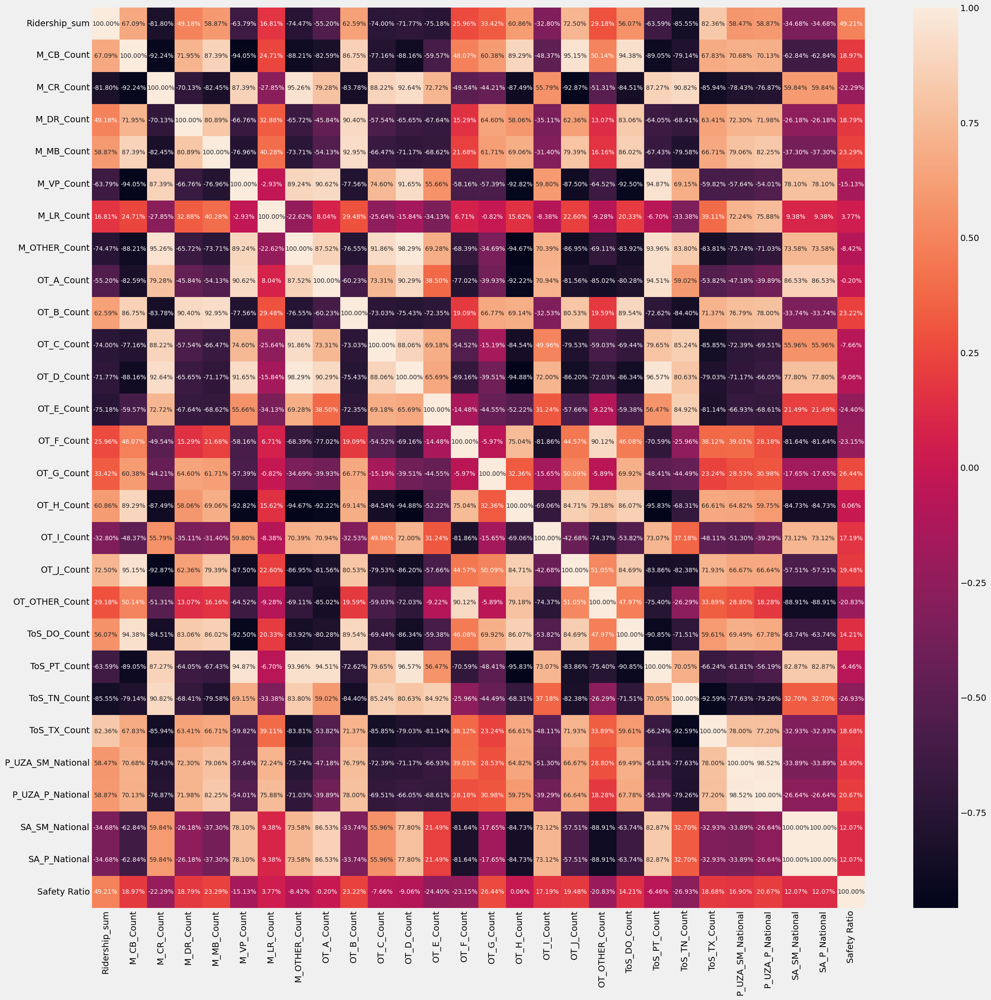

In [93]:
plt.subplots(figsize=(25,25))
sns.heatmap(modeling_df.corr(), annot=True, fmt='.2%', annot_kws={"fontsize":10})

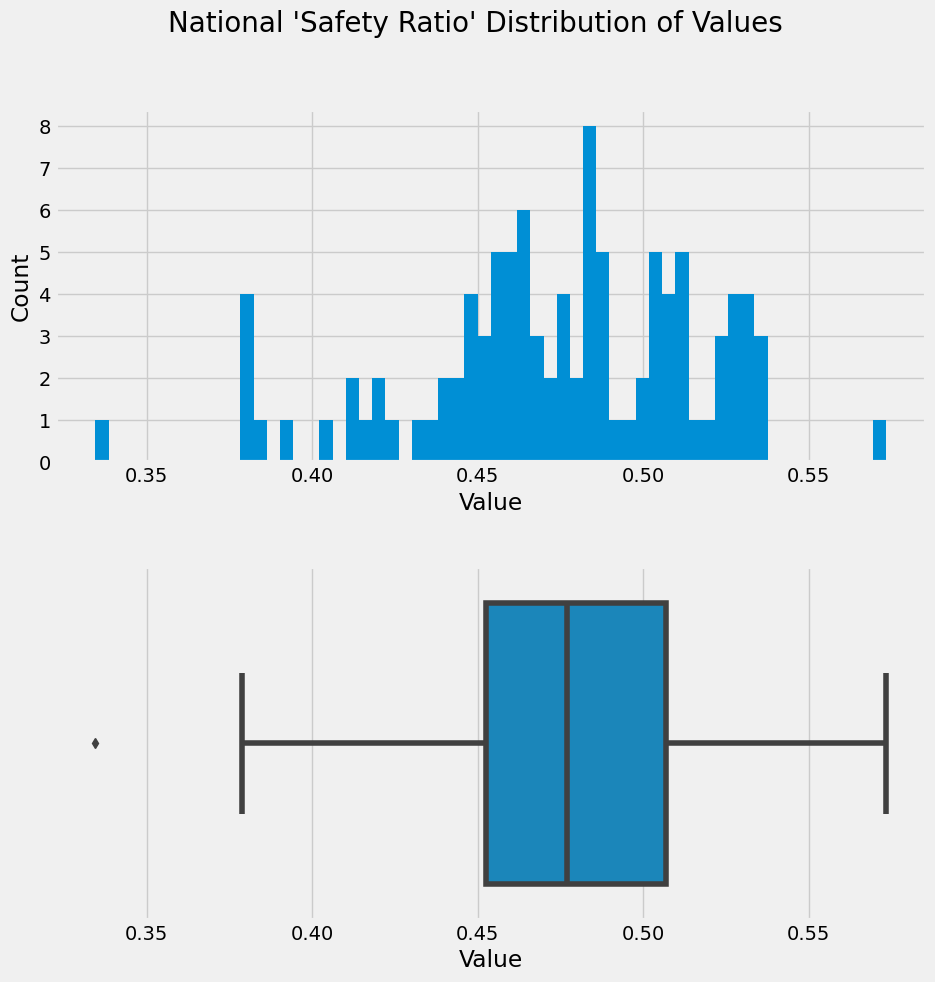

In [94]:
fig, ax =plt.subplots(2,1,figsize=(10,10), sharex=False)
fig.suptitle("National 'Safety Ratio' Distribution of Values", fontsize=20)


modeling_df.hist('Safety Ratio', bins=60, ax=ax[0])
ax[0].set_title("", fontsize=10, pad=20)
ax[0].set_xlabel("Value")
ax[0].set_ylabel("Count")

sns.boxplot(data=modeling_df, x='Safety Ratio', ax=ax[1])
ax[1].set_title('', fontsize=12, pad=20)
ax[1].set_xlabel("Value");


### 3.8.5 Model Trials: Regression
<a id= '3.8.5_Model_Trials_Regression'></a>
I will try three different regression models to see their usefulness for prediction.  The train/test split will respect time order.

In [95]:
# Checking to see if there are any zeros in the values of 'Safety Ratio'.

modeling_df['Safety Ratio'].min()

0.334531842434836

#### 3.8.5.1 Train/Test Split
<a id= '3.8.5.1_Train_Test_Split'></a>

In [96]:
# Dropping the Date column but retaining the time order 

modeling_df.reset_index(inplace=True)
modeling_df = modeling_df.drop(columns='Date')

In [97]:
#Defining X and y from modeling_df

X = modeling_df.drop(['Safety Ratio'], axis = 1)
y = modeling_df['Safety Ratio']

In [98]:
# Train/Test split respecting time order (shuffle=False)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False, random_state=42
)
X_train.index.min(), X_train.index.max()

(0, 80)

In [99]:
X_test.index.min(), X_test.index.max()

(81, 101)

#### 3.8.5.2 Linear Regression
<a id= '3.8.5.2_Linear_Regression'></a>


In [100]:
Model_lr = LinearRegression()

In [101]:
Model_lr.fit(X_train, y_train)

LinearRegression()

In [102]:
y_pred_lr = Model_lr.predict(X_test)

In [103]:
#Evaluation

R2_score_lr = Model_lr.score(X_train, y_train)
print("R Squared score:", R2_score_lr)

MAPE_lr = mean_absolute_percentage_error(y_test, y_pred_lr)
print("MAPE:", MAPE_lr)

MAE_lr = mean_absolute_error(y_test, y_pred_lr)
print("MAE:", MAE_lr)

MSE_lr = mean_squared_error(y_test, y_pred_lr)
print("MSE:", MSE_lr)

R Squared score: 0.6453442439118546
MAPE: 0.12712730846752227
MAE: 0.05841376187886485
MSE: 0.007744798535347564


In [104]:
# Creates a dataframe with all y_test, y_pred, and residual values

def get_residuals(y_pred):
    diff = (y_test - y_pred)

    y_test_series = pd.Series(y_test, name='y_test')
    y_pred_series = pd.Series(y_pred, name='y_pred')
    diff_series = pd.Series(diff, name='residual')

    y_pred_series.index = y_test_series.index

    data=pd.concat([y_test_series, y_pred_series, diff_series], axis=1)

    return data

# Creates a dataframe of statistics for the y_test, y_pred, and residual values

def get_resid_stats(data):
    mode = lambda x: pd.Series.mode(x)[0]
    data_agg = data.agg({
            "y_test": ["min", "max", "median", "mean", mode, "std"],
            "y_pred": ["min", "max", "median", "mean", mode, "std"],
            "residual": ["min", "max", "median", "mean", mode, "std"],})
    return data_agg

In [105]:
get_residuals(y_pred_lr)

,y_test,y_pred,residual
81,0.380515,0.427540,-0.047026
82,0.417012,0.420422,-0.003409
83,0.392577,0.412165,-0.019588
84,0.378903,0.455269,-0.076366
85,0.447780,0.443985,0.003795
86,0.406094,0.449417,-0.043323
87,0.454975,0.454379,0.000596
88,0.449671,0.458456,-0.008784
89,0.484801,0.496971,-0.012169
90,0.529945,0.483706,0.046239


In [106]:
get_resid_stats(get_residuals(y_pred_lr))

,y_test,y_pred,residual
min,0.378903,0.257680,-0.076366
max,0.529945,0.508931,0.225879
median,0.454975,0.443704,0.003795
mean,0.455473,0.422497,0.032976
<lambda>,0.378903,0.257680,-0.076366
std,0.041875,0.074352,0.083608


#### 3.8.5.3 Random Forest
<a id= '3.8.5.3_Random_Forest'></a>

In [107]:
Model_rf = RandomForestRegressor()

In [108]:
Model_rf.fit(X_train, y_train)

RandomForestRegressor()

In [109]:
y_pred_rf = Model_rf.predict(X_test)

In [110]:
# Evaluation

R2_score_rf = Model_rf.score(X_train, y_train)
print("R Squared score:", R2_score_rf)

MAPE_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print("MAPE:", MAPE_rf)

MAE_rf = mean_absolute_error(y_test, y_pred_rf)
print("MAE:", MAE_rf)

MSE_rf = mean_squared_error(y_test, y_pred_rf)
print("MSE:", MSE_rf)

R Squared score: 0.9015537356012967
MAPE: 0.06995059855192623
MAE: 0.03240543090675548
MSE: 0.0015112654755059323


In [111]:
get_residuals(y_pred_rf)

,y_test,y_pred,residual
81,0.380515,0.433555,-0.053041
82,0.417012,0.426269,-0.009256
83,0.392577,0.418486,-0.025910
84,0.378903,0.414377,-0.035474
85,0.447780,0.419116,0.028664
86,0.406094,0.427288,-0.021193
87,0.454975,0.428526,0.026449
88,0.449671,0.428526,0.021145
89,0.484801,0.428586,0.056215
90,0.529945,0.441753,0.088193


In [112]:
get_resid_stats(get_residuals(y_pred_rf))

,y_test,y_pred,residual
min,0.378903,0.414377,-0.053041
max,0.529945,0.451626,0.088193
median,0.454975,0.441829,0.026449
mean,0.455473,0.437284,0.018189
<lambda>,0.378903,0.451383,-0.053041
std,0.041875,0.012080,0.035206


#### 3.8.5.4 KNN
<a id= '3.8.5.4_KNN'></a>

In [113]:
Model_knn = KNeighborsRegressor()

In [114]:
Model_knn.fit(X_train, y_train)

KNeighborsRegressor()

In [115]:
y_pred_knn = Model_knn.predict(X_test)

In [116]:
# Evaluation

R2_score_knn = Model_knn.score(X_train, y_train)
print("R Squared score:", R2_score_knn)

MAPE_knn = mean_absolute_percentage_error(y_test, y_pred_knn)
print("MAPE:", MAPE_knn)

MAE_knn = mean_absolute_error(y_test, y_pred_knn)
print("MAE:", MAE_knn)

MSE_knn = mean_squared_error(y_test, y_pred_knn)
print("MSE:", MSE_knn)

R Squared score: 0.3652786801735439
MAPE: 0.07487352310186128
MAE: 0.03517694096522502
MSE: 0.0018752703432996874


In [117]:
get_residuals(y_pred_knn)

,y_test,y_pred,residual
81,0.380515,0.416281,-0.035766
82,0.417012,0.416281,0.000732
83,0.392577,0.416281,-0.023704
84,0.378903,0.416281,-0.037377
85,0.447780,0.416281,0.031499
86,0.406094,0.416281,-0.010186
87,0.454975,0.429280,0.025695
88,0.449671,0.429280,0.020392
89,0.484801,0.429280,0.055521
90,0.529945,0.429280,0.100666


In [118]:
get_resid_stats(get_residuals(y_pred_knn))

,y_test,y_pred,residual
min,0.378903,0.416281,-0.037377
max,0.529945,0.450928,0.100666
median,0.454975,0.429280,0.025695
mean,0.455473,0.430720,0.024753
<lambda>,0.378903,0.429280,-0.037377
std,0.041875,0.012872,0.036410


#### 3.8.5.5 Comparing the Models' Performance
<a id='3.8.5.5_Comparing_the_Models_Performance'></a>


In [119]:
# Plots the predicted versus actual values for each of the three regression models

def plot_pred_vs_actual(lr, rf, knn, num1, num2):

    fig, ax =plt.subplots(1,3,figsize=(14,4), sharey=True, sharex=True)
    fig.suptitle("Comparing the Predicted Versus Actual Values", fontsize=20, y=1.2)


    sns.scatterplot(x=y_test, y=lr, ax=ax[0])
    ax[0].set_title("Linear Regression", fontsize=15, pad=20)
    ax[0].set_xlabel("Actual")
    ax[0].set_ylabel("Predicted")
    #ax[0].plot([x for x in range (0,2)],[x for x in range (0,2)], color='red')
    ax[0].plot([num1, num2], [num1, num2], linewidth=2, color='red')

    sns.scatterplot(x=y_test, y=rf, ax=ax[1])
    ax[1].set_title("Random Forest", fontsize=15, pad=20)
    ax[1].set_xlabel("Actual")
    ax[1].set_ylabel("Predicted")
    #ax[1].plot([x for x in range (0,2)],[x for x in range (0,2)], color='red')
    ax[1].plot([num1, num2], [num1, num2], linewidth=2, color='red')

    sns.scatterplot(x=y_test, y=knn, ax=ax[2])
    ax[2].set_title("KNN", fontsize=15, pad=20)
    ax[2].set_xlabel("Actual")
    ax[2].set_ylabel("Predicted")
    #ax[2].plot([x for x in range (0,2)],[x for x in range (0,2)], color='red')
    ax[2].plot([num1, num2], [num1, num2], linewidth=2, color='red');



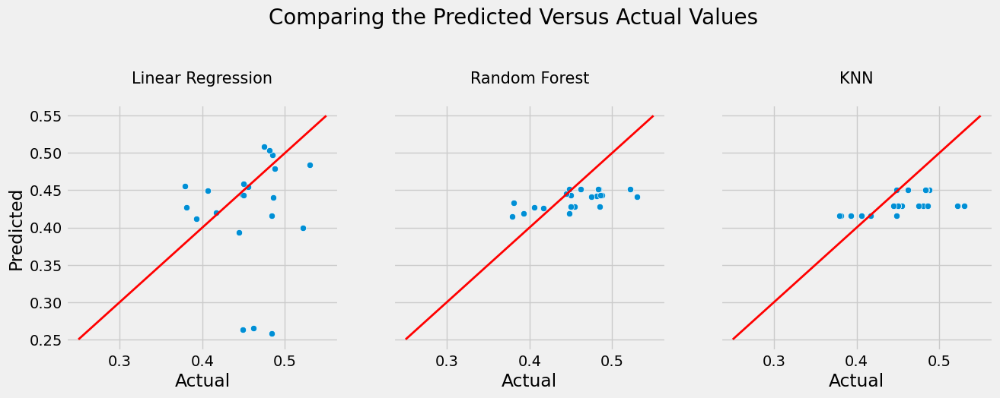

In [120]:
plot_pred_vs_actual(y_pred_lr, y_pred_rf, y_pred_knn, 0.25, 0.55)

In [121]:
# Plots the count of the residuals for each of the three regression models

def plot_residual_comparison(lr, rf, knn):

    fig, ax =plt.subplots(1,3,figsize=(14,6), sharey=True, sharex=True)
    fig.suptitle("Distribution of Test Set Residuals", fontsize=20, y=1.05)


    sns.histplot(lr, ax=ax[0])
    ax[0].set_title("Linear Regression", fontsize=15, pad=20)
    ax[0].set_xlabel("Prediction Error")
    ax[0].set_ylabel("Count")

    sns.histplot(rf, ax=ax[1])
    ax[1].set_title("Random Forest", fontsize=15, pad=20)
    ax[1].set_xlabel("Prediction Error")
    ax[1].set_ylabel("Count")

    sns.histplot(knn, ax=ax[2])
    ax[2].set_title("KNN", fontsize=15, pad=20)
    ax[2].set_xlabel("Prediction Error")
    ax[2].set_ylabel("Count");


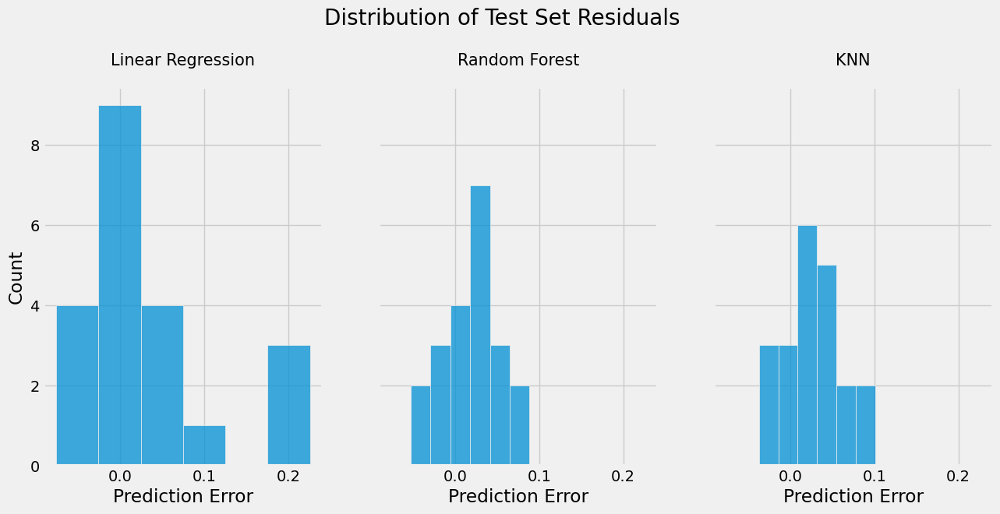

In [122]:
diff_lr = (y_test - y_pred_lr)
diff_rf = (y_test - y_pred_rf)
diff_knn = (y_test - y_pred_knn)

plot_residual_comparison(diff_lr, diff_rf, diff_knn)

In [123]:
# Plots a comparison of the performance for each of the three regression models

def plot_model_performance(MSE_lr, MSE_rf, MSE_knn, R2_score_lr, 
                           R2_score_rf, R2_score_knn, MAPE_lr, MAPE_rf, MAPE_knn, 
                           MAE_lr, MAE_rf, MAE_knn):

    MSEs = pd.Series([MSE_lr, MSE_rf, MSE_knn], name='values')
    R2s = pd.Series([R2_score_lr, R2_score_rf, R2_score_knn], name='values')
    MAPEs = pd.Series([MAPE_lr, MAPE_rf, MAPE_knn], name='values')
    MAEs = pd.Series([MAE_lr, MAE_rf, MAE_knn], name='values')
    labels = pd.Series(['LR','RF','KNN'], name='labels')


    fig, ax =plt.subplots(2,2,figsize=(18,12), sharex=True, sharey=False)
    fig.suptitle("Evaluating Model Performance", fontsize=20, y=1.05)


    sns.pointplot(data=pd.concat([MSEs, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend=True, 
                  ax=ax[0,0], hue='values')
    ax[0,0].set_title("Mean Squared Errors", fontsize=15, y=1.05)
    ax[0,0].set_xlabel("Model", fontsize=10)
    ax[0,0].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1))

    sns.pointplot(data=pd.concat([R2s, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend=True, 
                  ax=ax[0,1], hue='values')
    ax[0,1].set_title("R Squared Scores", fontsize=15, y=1.05)
    ax[0,1].set_xlabel("Model", fontsize=10)
    ax[0,1].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1))

    sns.pointplot(data=pd.concat([MAPEs, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend='brief', 
                  ax=ax[1,0], hue='values')
    ax[1,0].set_title("Mean Absolute Percent Errors", fontsize=15, y=1.05)
    ax[1,0].set_xlabel("Model", fontsize=10)
    ax[1,0].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1))

    sns.pointplot(data=pd.concat([MAEs, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend=True, 
                  ax=ax[1,1], hue='values')
    ax[1,1].set_title("Mean Absolute Errors", fontsize=15, y=1.05)
    ax[1,1].set_xlabel("Model", fontsize=10)
    ax[1,1].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1));

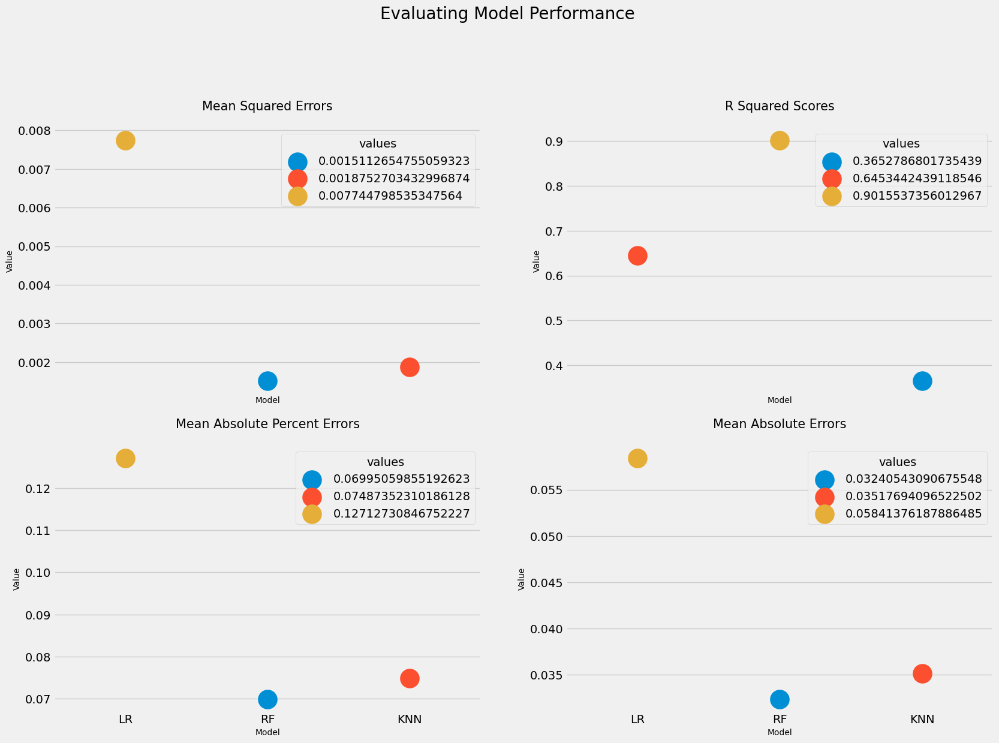

In [124]:
plot_model_performance(MSE_lr, MSE_rf, MSE_knn, R2_score_lr, R2_score_rf, R2_score_knn, 
                       MAPE_lr, MAPE_rf, MAPE_knn, MAE_lr, MAE_rf, MAE_knn)


Random Forest appears to be the best of the three regression models.  The R Squared value is over 0.9 while the other three metrics remain quite low.

## 3.9 Summary
<a id='3.9_Summary'></a>

The preprocessing and training portion of the notebook is now complete.  In it, I further refined the dataframe, I defined safety, and I added a 'Date' column.  I then performed some exploratory time series aggregations in order to learn more about the data.

I then encoded the categorical columns and aggregated the data for modeling.  I created the target called 'Safety Ratio', and performed additional EDA.  

I created a dataframe for modeling and ran three regression models to see if any would be useful in predicting the target values.  Random forest was the best of the three.


___

# 4 Modeling
<a id='4_Modeling'></a>

## 4.1 A Deeper Look into the First Modeling Dataframe
<a id='4.1_A_Deeper_Look_into_the_First_Modeling_Dataframe'></a>

I'll begin the modeling portion of the notebook by taking a deeper look into the modeling dataframe created during preprocessing and training.

## 4.1.1 Linear Regression Coefficients
<a id='4.1.1_Linear_Regression_Coefficients'></a>

In [125]:
def get_all_coefs_and_fns_df(model):
    fn = model.feature_names_in_
    coef = model.coef_
    fn = pd.DataFrame(fn)
    fn.columns = ['feature_name']
    coef = pd.DataFrame(coef)
    coef.columns = ['coef']
    coef_df = fn.join(coef)
    return coef_df

def get_pos_coefs_df(coef_df):
    pos_coef_df = coef_df[coef_df['coef']>=0]
    pos_coef_df = pos_coef_df.sort_values(by='coef', ascending=False)
    pos_coef_df.set_index('feature_name', inplace=True)
    #pos_coef_df.reset_index(inplace=True, drop=True)
    return pos_coef_df
    
    
def get_neg_coefs_df(coef_df):
    neg_coef_df = coef_df[coef_df['coef']<0]
    neg_coef_df['coef'] = abs(neg_coef_df['coef'])
    neg_coef_df = neg_coef_df.sort_values(by='coef', ascending=False)
    neg_coef_df.set_index('feature_name', inplace=True)
    #neg_coef_df.reset_index(inplace=True, drop=True)
    return neg_coef_df
        

In [126]:
Model_lr_all_coefs = get_all_coefs_and_fns_df(Model_lr)

In [127]:
Model_lr_pos_coefs = get_pos_coefs_df(Model_lr_all_coefs)
#Model_lr_pos_coefs

In [128]:
Model_lr_neg_coefs = get_neg_coefs_df(Model_lr_all_coefs)
#Model_lr_neg_coefs


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [129]:
Model_lr_pos_coefs = Model_lr_pos_coefs.sort_values(by='coef', ascending=True)
Model_lr_neg_coefs = Model_lr_neg_coefs.sort_values(by='coef', ascending=True)


In [130]:
# Plot positive and negative lr coefs

def plot_pos_and_neg_lr_coefs(pos_coefs, neg_coefs):
    
    fig, ax =plt.subplots(2,1,figsize=(12,10), sharex=False)
    fig.suptitle("Linear Regression Coefficients", fontsize=20)
    plt.subplots_adjust(hspace=0.5)

    pos_coefs.plot(kind='barh', legend=True, ax=ax[0])
    ax[0].set_title("Positive Coefficients", fontsize=15, pad=20)
    ax[0].set_ylabel("Feature")
    ax[0].set_xlabel("Coefficients")
    ax[0].legend(loc='lower right')
    #ax[0].bar_label(ax[0].containers[0])


    neg_coefs.plot(kind='barh',legend=True, ax=ax[1])
    ax[1].set_title("Negative Coefficients", fontsize=15, pad=20)
    ax[1].set_ylabel("Feature")
    ax[1].set_xlabel("Coefficients")
    ax[1].legend(loc='lower right')
    #ax[1].bar_label(ax[1].containers[0])

    plt.show();

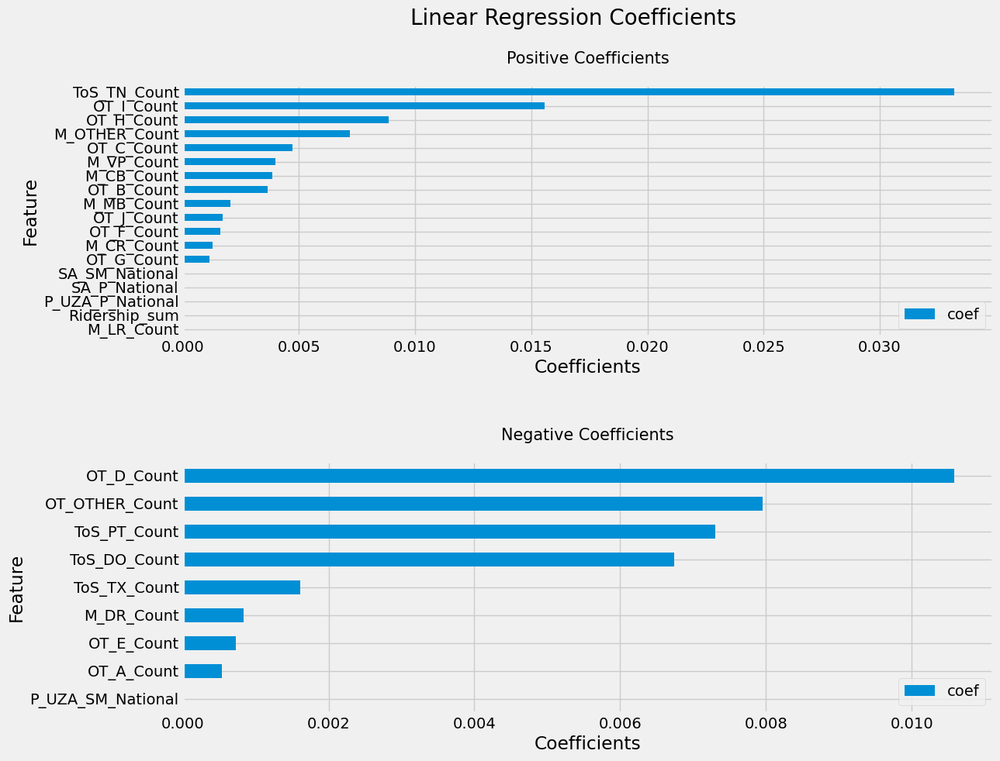

In [131]:
plot_pos_and_neg_lr_coefs(Model_lr_pos_coefs, Model_lr_neg_coefs)

The linear regression model is suggesting Tos_TN_Count has the greatest positive effect on the target value while Ridership_sum, SA_SM_National and others appear inconsequential.  It also suggests that OT_D_Count has the greatest negative effect on the target value followed by OT_OTHER_Count, ToS_PT_Count, and ToS_DO_Count.  The linear regression model did not perform very well, though, so I don't place much value in these findings.

## 4.1.2 Random Forest Feature Importance
<a id='4.1.2_Random_Forest_Feature_Importance'></a>

I'll take a deeper look now at the random forest model, which was the best performing model, for the modeling dataframe above.

In [132]:
def plot_rf_feature_importances(model):
    importances = model.feature_importances_
    std = np.std([a.feature_importances_ for a in model.estimators_], axis=0)
    feature_importances = pd.Series(importances, index=X.columns)
    feature_importances = feature_importances.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(10,8))
    feature_importances.plot.barh(yerr=std, ax=ax)
    ax.set_title("Random Forest Feature Importance")
    ax.set_ylabel("Feature")
    ax.set_xlabel("Importance");

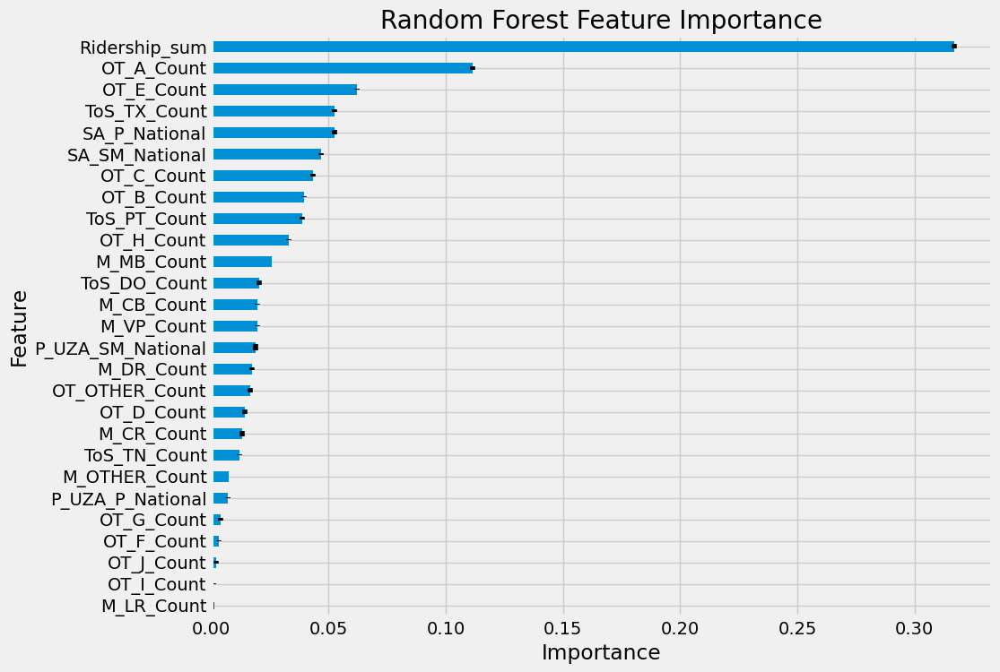

In [133]:
plot_rf_feature_importances(Model_rf)

The random forest model suggests that Ridership_sum has the greatest importance by far when predicting the target for this dataframe. It is interesting to see that the service area size and population (SA_SM_National, SA_P_National) rank much higher on the list of importance than the primary uza size and population (P_UZA_SM_National, P_UZA_P_National).  Additionally, light rail (M_LR_Count) ranks least important of all.

## 4.1.3 XGBoost Regression
<a id='4.1.3_XGBoost_Regression'></a>

In [134]:
Model_xgbr = xgb.XGBRegressor()

In [135]:
Model_xgbr.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [136]:
y_pred_xgbr = Model_xgbr.predict(X_test)

In [137]:

R2_score_xgbr = Model_xgbr.score(X_train, y_train)
print("R Squared score:", R2_score_xgbr)

MAPE_xgbr = mean_absolute_percentage_error(y_test, y_pred_xgbr)
print("MAPE:", MAPE_xgbr)

MAE_xgbr = mean_absolute_error(y_test, y_pred_xgbr)
print("MAE:", MAE_xgbr)

MSE_xgbr = mean_squared_error(y_test, y_pred_xgbr)
print("MSE:", MSE_xgbr)

R Squared score: 0.9988188524931811
MAPE: 0.04840337959111421
MAE: 0.0222257874823852
MSE: 0.000783482170628978


In [138]:
get_residuals(y_pred_xgbr)

,y_test,y_pred,residual
81,0.380515,0.386508,-0.005993
82,0.417012,0.371985,0.045027
83,0.392577,0.371128,0.021448
84,0.378903,0.372946,0.005957
85,0.447780,0.413262,0.034518
86,0.406094,0.451848,-0.045753
87,0.454975,0.451848,0.003128
88,0.449671,0.451848,-0.002176
89,0.484801,0.451848,0.032954
90,0.529945,0.467606,0.062340


In [139]:
get_resid_stats(get_residuals(y_pred_xgbr))

,y_test,y_pred,residual
min,0.378903,0.371128,-0.045753
max,0.529945,0.484790,0.062340
median,0.454975,0.467606,0.007191
mean,0.455473,0.447287,0.008186
<lambda>,0.378903,0.451848,-0.045753
std,0.041875,0.038850,0.027428


In [140]:
def plot_pred_vs_act_single(y_pred, num1, num2):
    fig, ax =plt.subplots(1,1,figsize=(14,4), sharey=True, sharex=True)
    fig.suptitle("Comparing the Predicted Versus Actual Values", fontsize=20, y=1.2)


    sns.scatterplot(x=y_test, y=y_pred, ax=ax)
    ax.set_title("XGBoost Regression", fontsize=15, pad=20)
    ax.set_xlabel("Actual")
    ax.set_ylabel("Predicted")
    #ax.plot([x for x in range (0,2)],[x for x in range (0,2)], color='red')
    ax.plot([num1, num2], [num1, num2], linewidth=2, color='red');


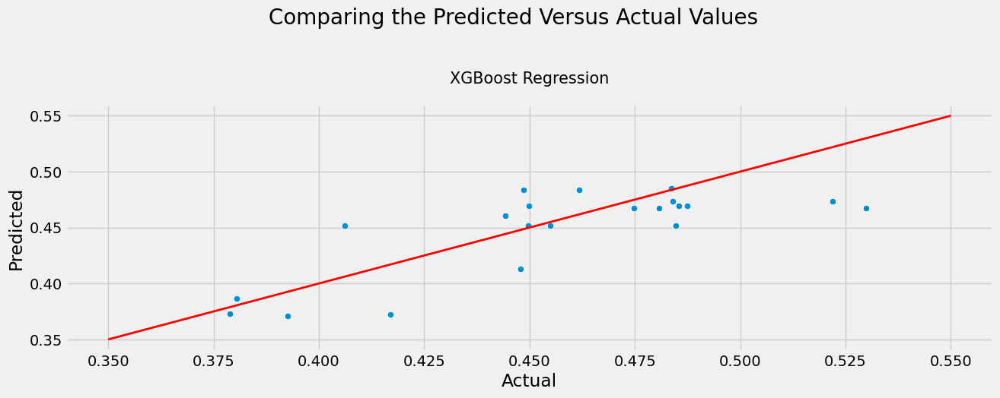

In [141]:
plot_pred_vs_act_single(y_pred_xgbr, 0.35, 0.55)

XGBoost Regression appears to be a very good model for predicting the target.  I'll create a new model based on the whole dataset to see what I can learn from it.

## 4.1.4 Modeling the Whole Dataset
<a id='4.1.4_Modeling_the_Whole_Dataset'></a>

In [142]:
#Defining X and y

X = modeling_df.drop(['Safety Ratio'], axis = 1)
y = modeling_df['Safety Ratio']

In [143]:
Model_xgbr_all = xgb.XGBRegressor()

In [144]:
Model_xgbr_all.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [145]:
shap.initjs()

In [146]:
explainer = shap.TreeExplainer(Model_xgbr_all)

In [147]:
shap_values = explainer.shap_values(X)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


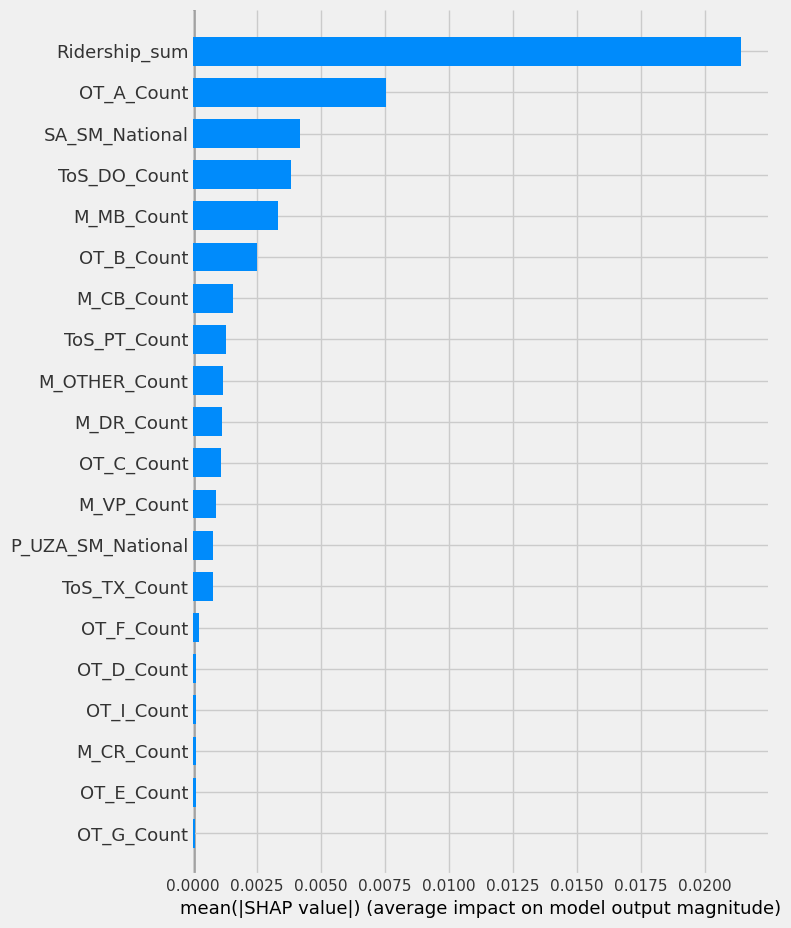

In [148]:
shap.summary_plot(shap_values, X, plot_type="bar")

The summary plot above shows that Ridership_sum was the most important feature, changing the predicted absolute value of the target on average by about 2.25%.


In [149]:
shap.force_plot(explainer.expected_value, shap_values, X)

When the force plot above is displayed in the original sampling order, time order is preserved, meaning each row of the dataframe represents one month.  In that display mode, we can see there is an interesting spike during the 12th month of the dataframe.  I'll take a closer look at the difference between months 11 and 12.

In [150]:
shap.force_plot(explainer.expected_value, 
                shap_values[11, :], X.iloc[11, :])


In [151]:
shap.force_plot(explainer.expected_value, 
                shap_values[12, :], X.iloc[12, :])


Interesting to see the difference in what is contributing to the difference from the mean for each instance.  In the 11th month, OT_A_Count is accounting for the largest part of the decrease while in the 12th month, Ridership_sum is accounting for the largest part of the increase.  Both months show almost the same value for M_CB_Count, which means this doesn't play a role in the change from month 11 to month 12.

The full force plot also showed a marked decrease in the target value from rows 74 to 89.  This corresponds to the Covid-19 pandemic which resulted in a huge, sudden decrease in ridership as we can see in month 80 below.

In [152]:
shap.force_plot(explainer.expected_value, 
                shap_values[80, :], X.iloc[80, :])


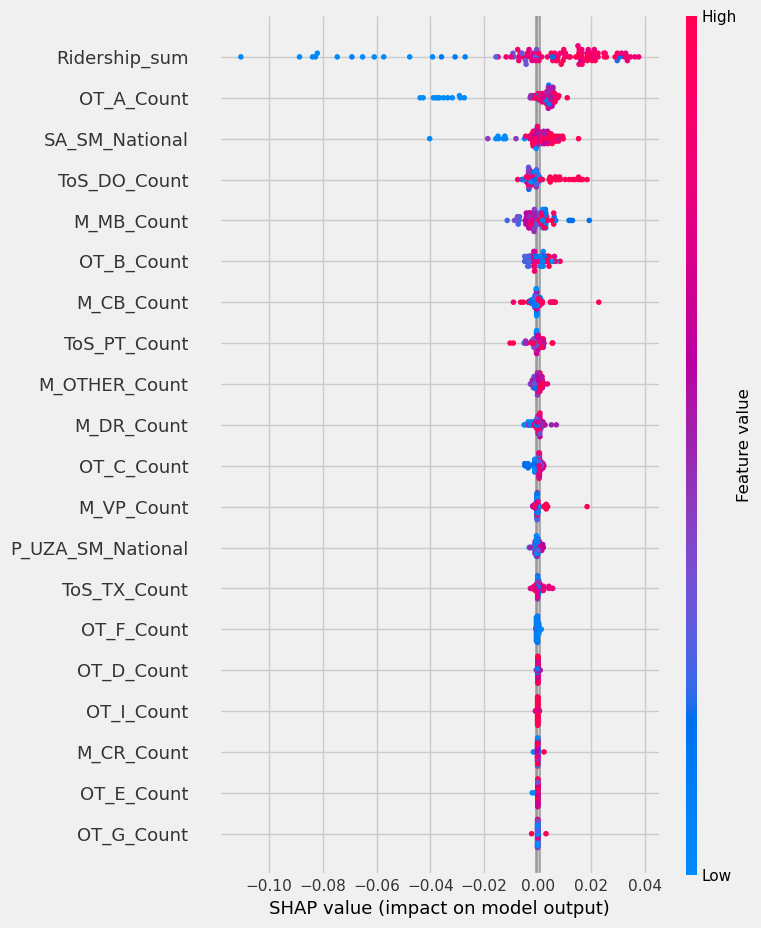

In [153]:
shap.summary_plot(shap_values, X)

The summary plot above gives another view of the influence of each feature.  High ridership increases the predicted safety ratio.  To a lesser degree, OT_A_Count and SA_SM_National do as well.

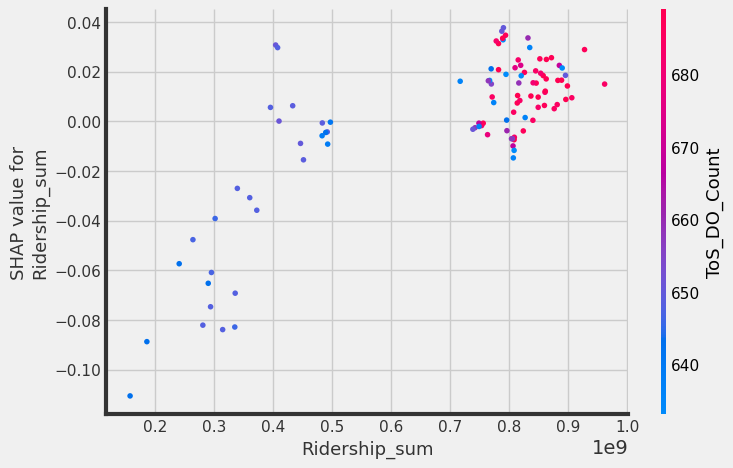

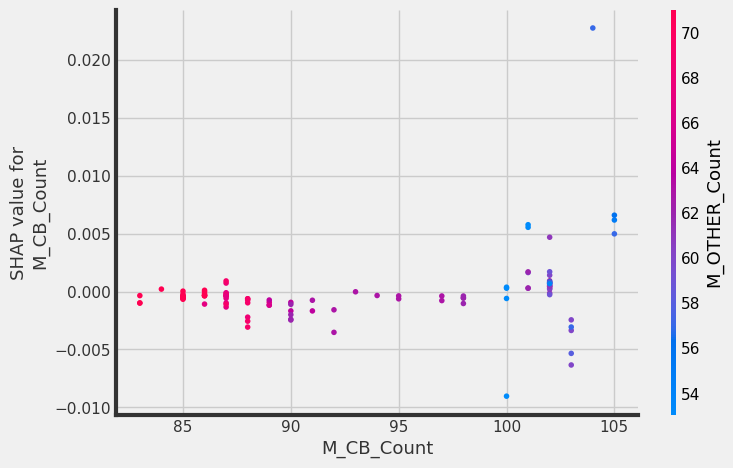

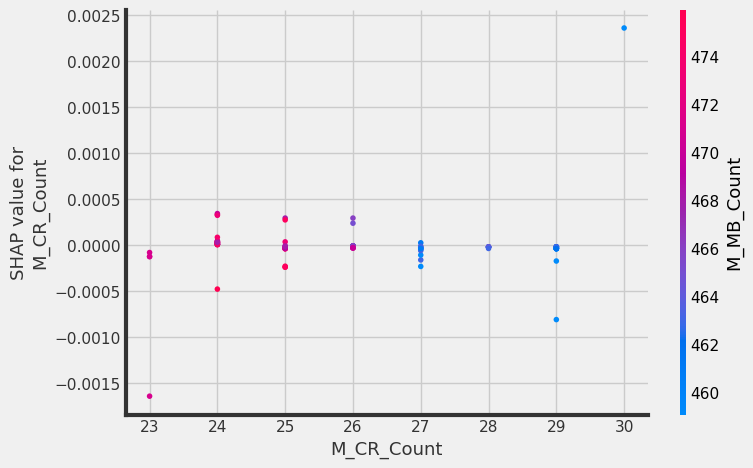

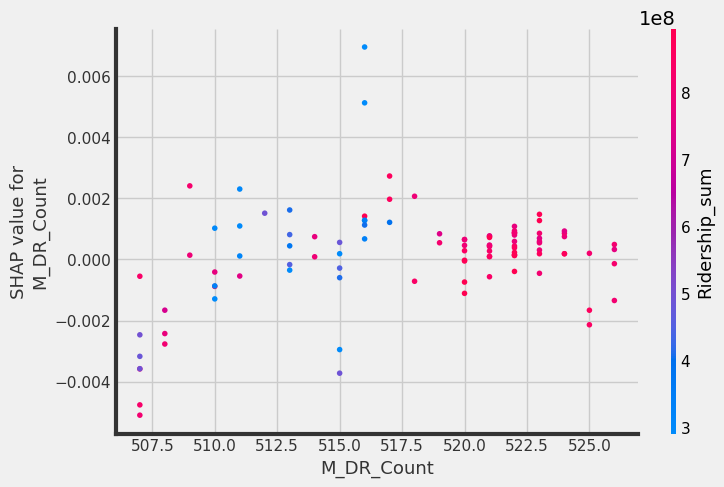

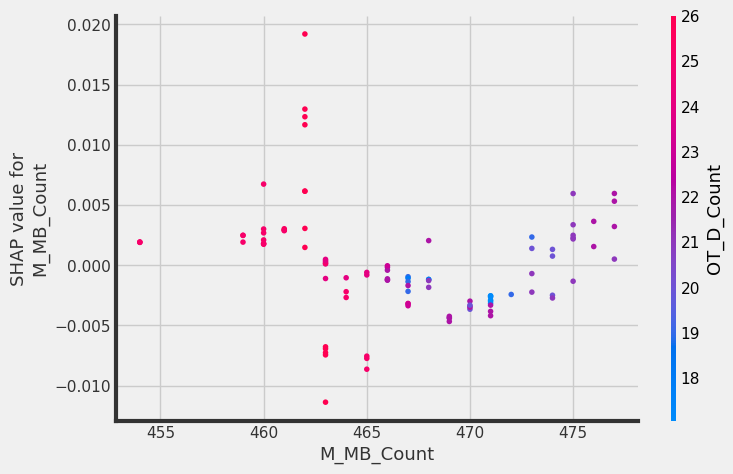

...

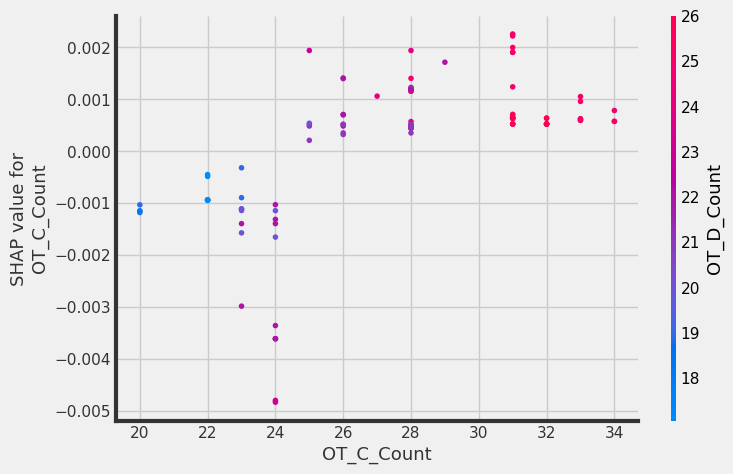

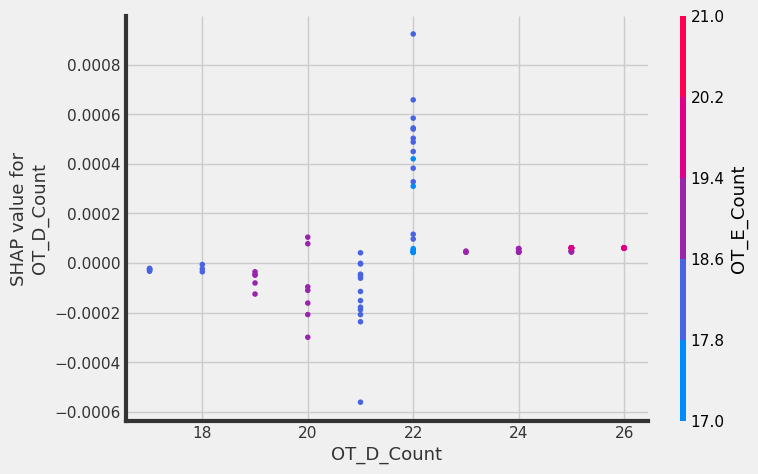

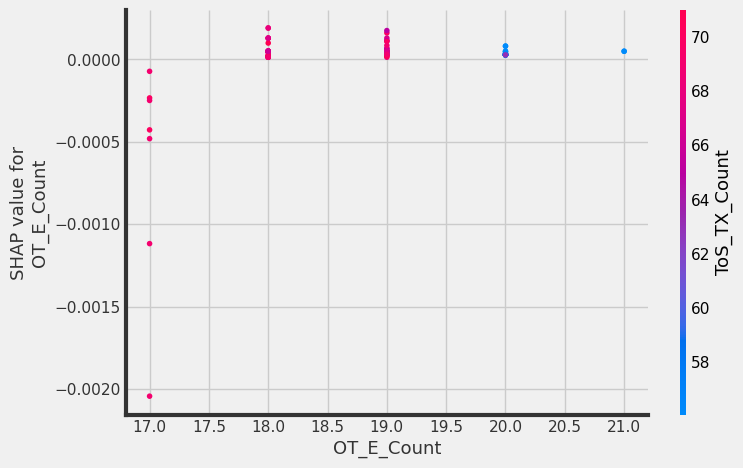

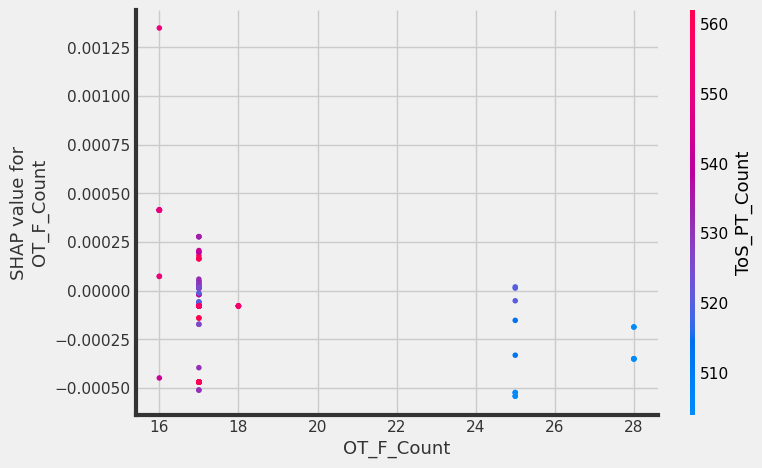

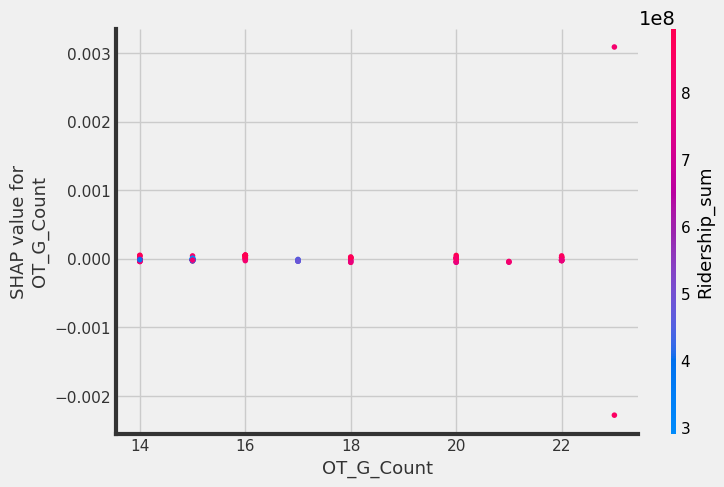

invalid value encountered in divide
invalid value encountered in divide


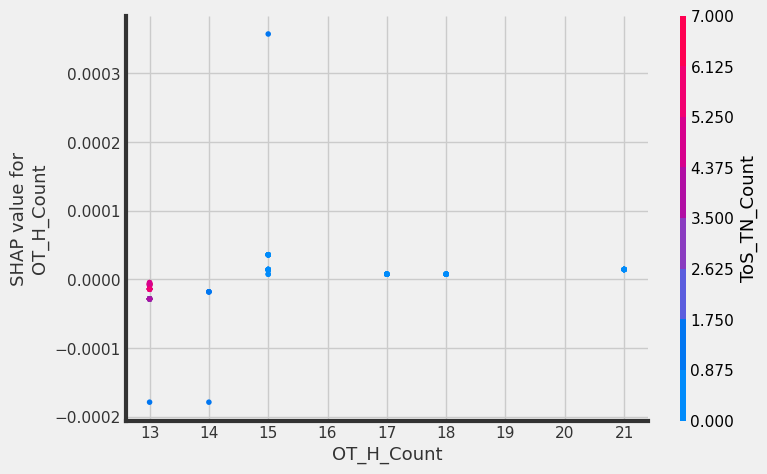

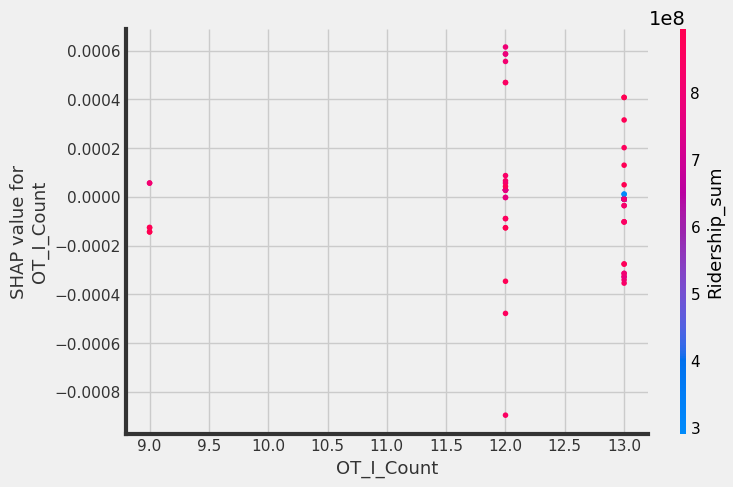

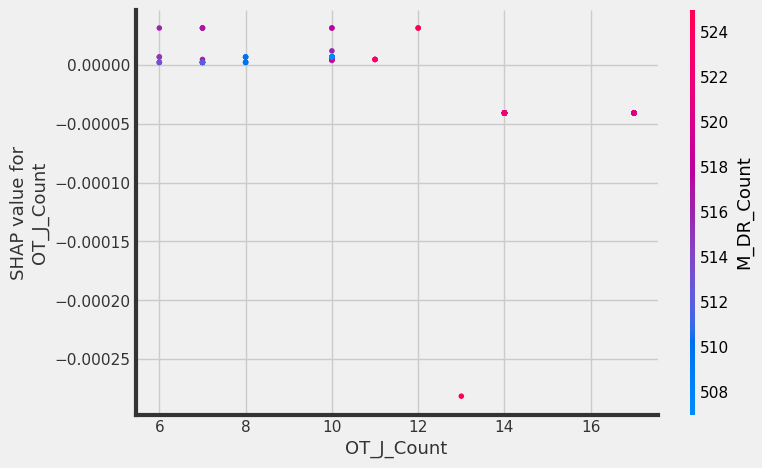

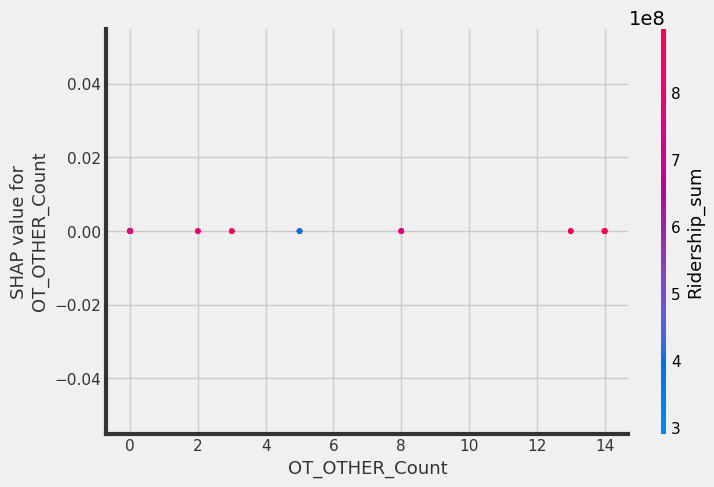

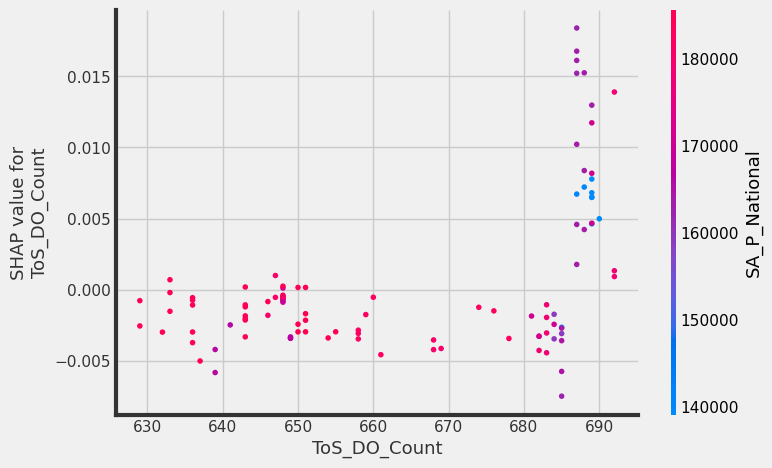

...

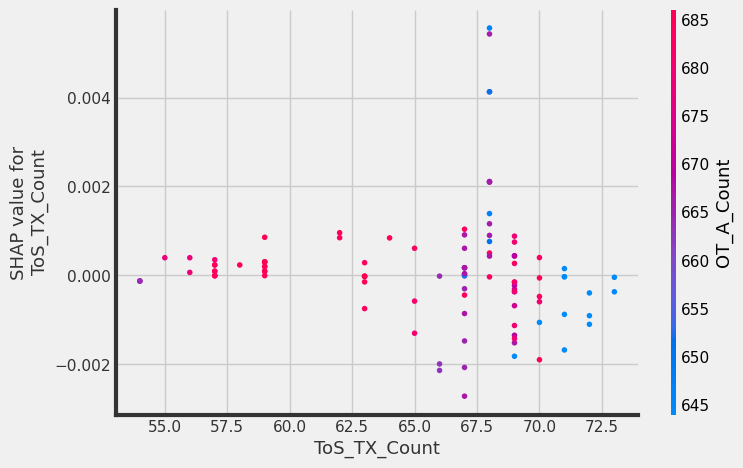

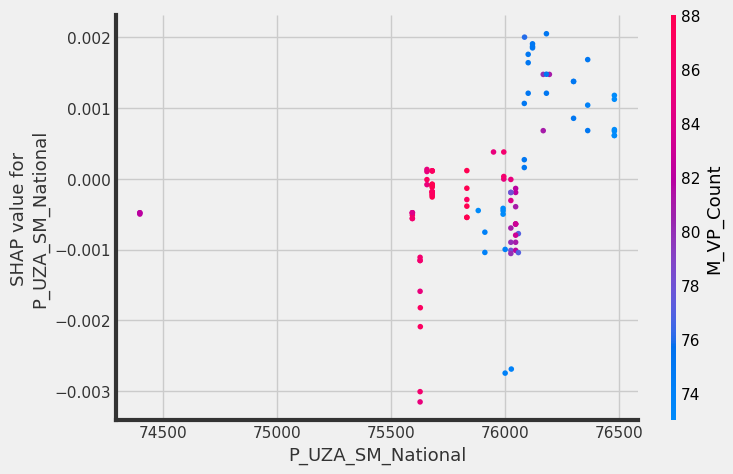

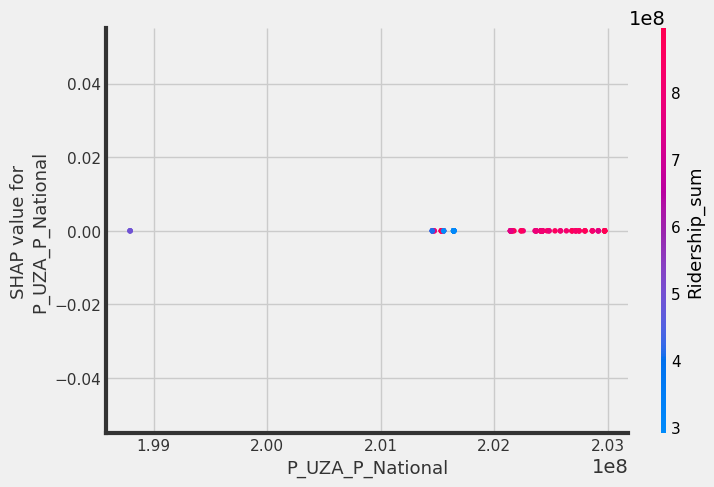

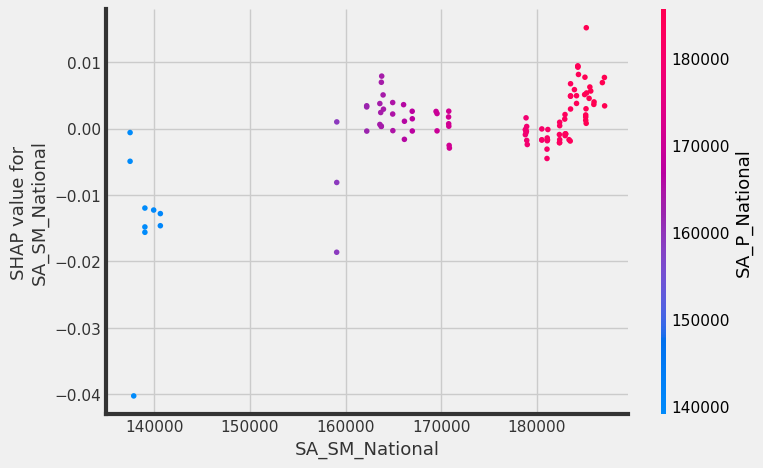

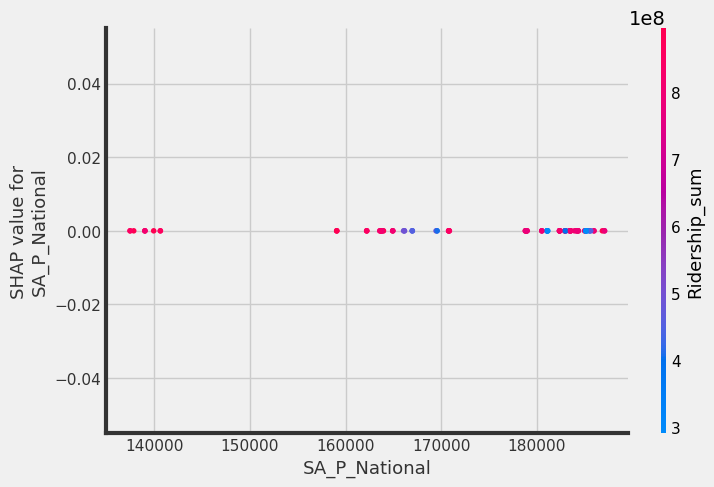

In [154]:
for name in X.columns:
    shap.dependence_plot(name, shap_values, X)


## 4.2 Second Modeling Dataframe:  Aggregated by Time and Location
<a id='4.2_Second_Modeling_Dataframe'></a>
This aggregation results in one row of data per location per month.

|  |  |
|:---------|:-------------|
|Time|Time|
|Dimensions|Location|
|Features|Mode (encoded and reduced)|
||Type of Service (ecoded)|
||Organization Type (encoded and reduced)|
||Primary UZA Sq Miles|
||Primary UZA Population|
||Service Area Sq Miles|
||Service Area Population|
||Ridership|
|Target|Safety Ratio|



### 4.2.1 Aggregating the Data for Modeling
<a id='4.2.1_Aggregating_the_Data_for_Modeling'></a>

In [155]:
modeling_df2 = National_data.groupby(['Primary UZA Name','Date']).agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum'),
    Ridership_sum = ('Ridership','sum'),
    P_UZA_SM_avg = ('Primary UZA Sq Miles', 'mean'),
    P_UZA_P_avg = ('Primary UZA Population', 'mean'),
    SA_SM_avg = ('Service Area Sq Miles', 'mean'),
    SA_P_avg = ('Service Area Population', 'mean'),
    M_CB_Count = ('M_CB', 'sum'),
    M_CR_Count = ('M_CR', 'sum'),
    M_DR_Count = ('M_DR', 'sum'),
    M_MB_Count = ('M_MB', 'sum'),
    M_VP_Count = ('M_VP', 'sum'),
    M_LR_Count = ('M_LR', 'sum'),
    M_OTHER_Count = ('M_OTHER', 'sum'),
    OT_A_Count = ('OT_A', 'sum'),
    OT_B_Count = ('OT_B', 'sum'),
    OT_C_Count = ('OT_C', 'sum'),
    OT_D_Count = ('OT_D', 'sum'),
    OT_E_Count = ('OT_E', 'sum'),
    OT_F_Count = ('OT_F', 'sum'),
    OT_G_Count = ('OT_G', 'sum'),
    OT_H_Count = ('OT_H', 'sum'),
    OT_I_Count = ('OT_I', 'sum'),
    OT_J_Count = ('OT_J', 'sum'),
    OT_OTHER_Count = ('OT_OTHER', 'sum'),
    ToS_DO_Count = ('ToS_DO', 'sum'),
    ToS_PT_Count = ('ToS_PT', 'sum'),
    ToS_TN_Count = ('ToS_TN', 'sum'),
    ToS_TX_Count = ('ToS_TX', 'sum')
).reset_index()


**Checking the aggregation**

In [156]:
#  Subsets a dataframe for a given value in a given column

def select_subset (df, column, value):
    l = df[df[column]==value]
    return l

In [157]:
# subsetting the two dataframes by location

m = select_subset(modeling_df2, 'Primary UZA Name', 'Stockton, CA')
m = m.set_index('Date')

n = select_subset(National_data, 'Primary UZA Name', 'Stockton, CA')


In [158]:
check_agg_part_1('Mode', 'CB', '2017-03-01', m, n, 'M_CB_Count', 'M_CB')


Checking Part 1 of Aggregation:  
Comparing two calculation for the Mode CB for 2017-03-01
modeling dataframe value: 1
checked value: 1


### 4.2.2 Creating the Target
<a id='4.2.2_Creating_the_Target'></a>

In [159]:
create_target(modeling_df2)
modeling_df2.head()

,Primary UZA Name,Date,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,P_UZA_SM_avg,P_UZA_P_avg,SA_SM_avg,...,OT_G_Count,OT_H_Count,OT_I_Count,OT_J_Count,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,Safety Ratio
0,"Aberdeen-Bel Air South-Bel Air North, MD",2014-01-01,0,0,0,56822,23279,131.0,213751.0,131.0,...,0,0,0,0,0,2,0,0,0,0.000000
1,"Aberdeen-Bel Air South-Bel Air North, MD",2014-02-01,0,0,0,50492,22805,131.0,213751.0,131.0,...,0,0,0,0,0,2,0,0,0,0.000000
2,"Aberdeen-Bel Air South-Bel Air North, MD",2014-03-01,0,0,0,60754,26917,131.0,213751.0,131.0,...,0,0,0,0,0,2,0,0,0,0.000000
3,"Aberdeen-Bel Air South-Bel Air North, MD",2014-04-01,0,0,0,68725,31941,131.0,213751.0,131.0,...,0,0,0,0,0,2,0,0,0,0.000000
4,"Aberdeen-Bel Air South-Bel Air North, MD",2014-05-01,0,1,1,63952,30483,131.0,213751.0,131.0,...,0,0,0,0,0,2,0,0,0,3.127346


In [160]:
modeling_df2['Safety Ratio'].isna().sum()

50

In rows where there were no fatalities, injuries, or events, I end up with Nans because I have divided by zero.  I will replace the Nans with zeros since that is the logical value.


In [161]:
modeling_df2['Safety Ratio'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
modeling_df2['Safety Ratio'].isna().sum()


0

In [162]:
modeling_df2['Safety Ratio'].isna().sum()

0

In [163]:
modeling_df2 = modeling_df2.drop(['VRM_sum', 'Fatalities_sum','Injuries_sum','Events_sum'], axis=1)


In [164]:
modeling_df2 = modeling_df2.set_index('Date')


### 4.2.3 Exploring the Data
<a id='4.2.3_Exploring_the_Data'></a>

In [165]:
modeling_df2.describe()

,Ridership_sum,P_UZA_SM_avg,P_UZA_P_avg,SA_SM_avg,SA_P_avg,M_CB_Count,M_CR_Count,M_DR_Count,M_MB_Count,M_VP_Count,...,OT_G_Count,OT_H_Count,OT_I_Count,OT_J_Count,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,Safety Ratio
count,3.014300e+04,30143.00000,3.014300e+04,30143.000000,3.014300e+04,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000,...,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000,30143.000000
mean,2.357385e+06,256.84537,6.839090e+05,586.937347,4.673362e+05,0.315662,0.088710,1.751684,1.579670,0.274293,...,0.057095,0.052185,0.042398,0.039147,0.008559,2.246790,1.829778,0.006801,0.221179,0.323803
std,1.893555e+07,409.61245,1.600650e+06,1263.081944,6.647831e+05,0.931598,0.350681,1.860456,1.857333,0.507071,...,0.341962,0.794675,0.245983,0.258990,0.147726,2.887141,2.789139,0.082188,0.604442,0.872074
min,0.000000e+00,11.00000,5.124000e+04,9.000000,2.272300e+04,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.688250e+04,56.00000,1.087400e+05,65.000000,1.285235e+05,0.000000,0.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.538270e+05,119.00000,2.320450e+05,193.000000,2.264355e+05,0.000000,0.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,4.545320e+05,271.00000,5.497770e+05,596.833333,5.035060e+05,0.000000,0.000000,2.000000,2.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.355872
max,3.951441e+08,3450.00000,1.835130e+07,15355.000000,6.216177e+06,14.000000,3.000000,23.000000,19.000000,3.000000,...,3.000000,16.000000,2.000000,3.000000,4.000000,37.000000,26.000000,1.000000,8.000000,34.721776


0.3238034632842603


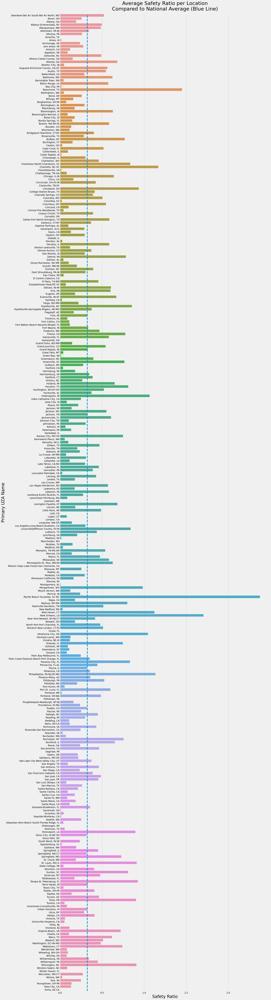

In [166]:
# Barplot of 'Safety Ratio' per Location over time 

fig, ax =plt.subplots(1,1,figsize=(20,100))
ax.set_title('Average Safety Ratio per Location\nCompared to National Average (Blue Line)', fontsize=30, pad=20)

SR_avg = modeling_df2.groupby ('Primary UZA Name')['Safety Ratio'].mean()
SR_Nat_avg = modeling_df2['Safety Ratio'].mean()
print(SR_Nat_avg)

SR_avg_df = pd.DataFrame(SR_avg)
SR_avg_df = SR_avg_df.reset_index()
SR_avg_df
g= sns.barplot(data=SR_avg_df, y='Primary UZA Name',x='Safety Ratio', ax=ax)
g.axvline(SR_Nat_avg, linestyle='--')
plt.xlabel('Safety Ratio',fontsize=25)
plt.ylabel('Primary UZA Name',fontsize=25);

In [167]:
m_df2_temp = modeling_df2.reset_index()
#sns.pairplot(m_df2_temp, corner=True)


<AxesSubplot:>

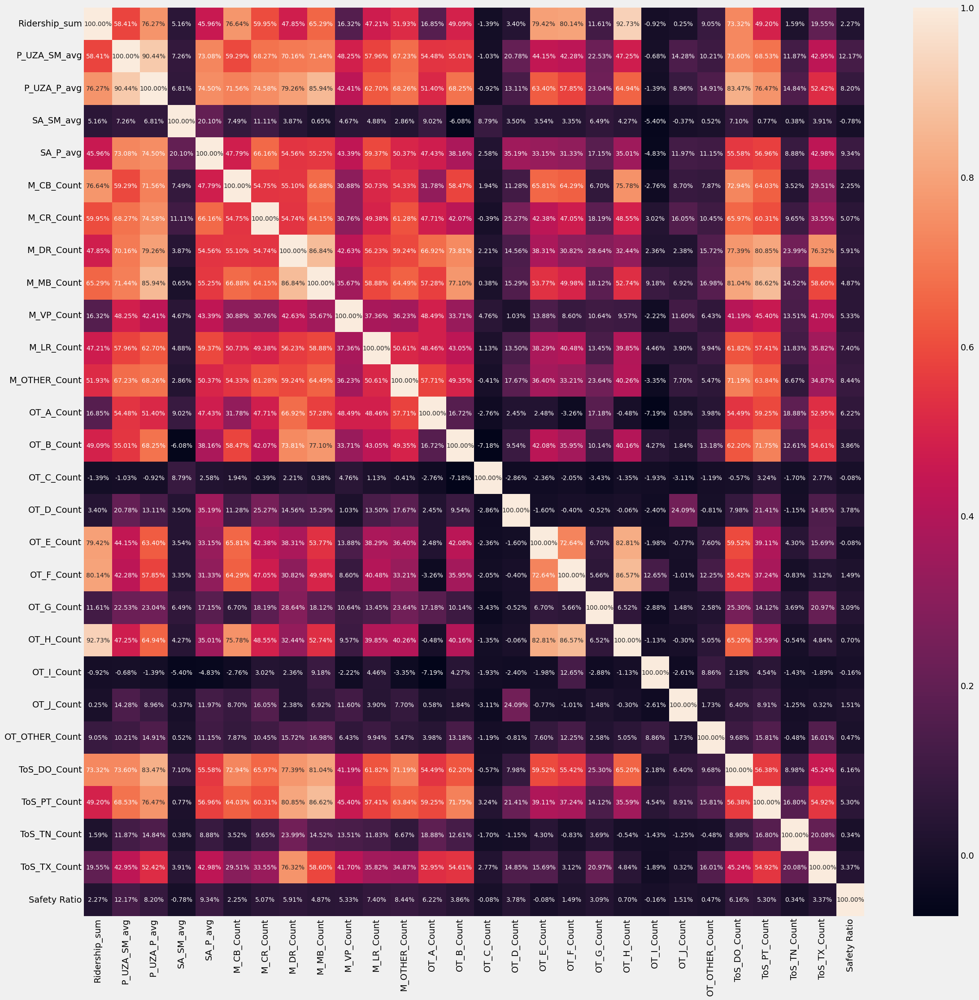

In [168]:
plt.subplots(figsize=(25,25))
sns.heatmap(modeling_df2.corr(), annot=True, fmt='.2%', annot_kws={"fontsize":10})

### 4.2.4 Model Trials: Regression
<a id= '4.2.4_Model_Trials_Regression'></a>
I will try three different regression models to see their usefulness for prediction.  The train/test split will respect time order.

In [169]:
# saving a copy of the dataframe before location and date are droppped

modeling_df2_with_location_and_date = modeling_df2.copy()

In [170]:
# Checking to see if there are any zeros in the values of 'Safety Ratio'.

modeling_df2['Safety Ratio'].min()

0.0

Since I have zeros in my target values, MAPE will not give a usable value for model evaluation.

#### 4.2.4.1 Train/Test Split
<a id= '4.2.4.1_Train_Test_Split'></a>

In [171]:
# Dropping the Date column but retaining the time order 

modeling_df2.reset_index(inplace=True)
modeling_df2 = modeling_df2.drop(columns=['Date', 'Primary UZA Name'])

In [172]:
#Defining X and y from modeling_df

X = modeling_df2.drop(['Safety Ratio'], axis = 1)
y = modeling_df2['Safety Ratio']

In [173]:
# Train/Test split respecting time order (shuffle=False)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False, random_state=42
)
X_train.index.min(), X_train.index.max()

(0, 24113)

In [174]:
X_test.index.min(), X_test.index.max()

(24114, 30142)

#### 4.2.4.2 Linear Regression
<a id= '4.2.4.2_Linear_Regression'></a>


In [175]:
Model_lr2 = LinearRegression()

In [176]:
Model_lr2.fit(X_train, y_train)

LinearRegression()

In [177]:
y_pred_lr2 = Model_lr2.predict(X_test)

In [178]:
#Evaluation

R2_score_lr2 = Model_lr2.score(X_train, y_train)
print("R Squared score:", R2_score_lr2)

#MAPE_lr2 = mean_absolute_percentage_error(y_test, y_pred_lr2)
#print("MAPE:", MAPE_lr2)

MAE_lr2 = mean_absolute_error(y_test, y_pred_lr2)
print("MAE:", MAE_lr2)

MSE_lr2 = mean_squared_error(y_test, y_pred_lr2)
print("MSE:", MSE_lr2)

R Squared score: 0.025133645488415457
MAE: 0.4250191505920609
MSE: 0.6563900408107647


In [179]:
get_residuals(y_pred_lr2)

,y_test,y_pred,residual
24114,0.0,0.246825,-0.246825
24115,0.0,0.246823,-0.246823
24116,0.0,0.246826,-0.246826
24117,0.0,0.246824,-0.246824
24118,0.0,0.246825,-0.246825
...,...,...,...
30138,0.0,0.228747,-0.228747
30139,0.0,0.228748,-0.228748
30140,0.0,0.228747,-0.228747
30141,0.0,0.228747,-0.228747


In [180]:
get_resid_stats(get_residuals(y_pred_lr2))

,y_test,y_pred,residual
min,0.000000,0.060564,-0.656074
max,13.065491,0.700865,12.889034
median,0.000000,0.284476,-0.253412
mean,0.299303,0.302032,-0.002729
<lambda>,0.000000,0.198316,-0.253411
std,0.815535,0.099412,0.810242


In [181]:
Model_lr2_all_coefs = get_all_coefs_and_fns_df(Model_lr2)

In [182]:
Model_lr2_pos_coefs = get_pos_coefs_df(Model_lr2_all_coefs)
Model_lr2_pos_coefs

,coef
feature_name,
M_LR_Count,7.545474e-02
M_OTHER_Count,7.223830e-02
OT_F_Count,3.897942e-02
OT_J_Count,3.211867e-02
ToS_DO_Count,1.937165e-02
M_DR_Count,1.504156e-02
OT_OTHER_Count,1.118381e-02
ToS_PT_Count,7.821762e-03
P_UZA_SM_avg,3.536901e-04


In [183]:
Model_lr2_neg_coefs = get_neg_coefs_df(Model_lr2_all_coefs)
Model_lr2_neg_coefs


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,coef
feature_name,
M_CR_Count,1.263779e-01
ToS_TN_Count,6.463319e-02
OT_H_Count,5.574371e-02
OT_E_Count,4.259985e-02
M_MB_Count,4.131728e-02
M_CB_Count,3.569766e-02
ToS_TX_Count,2.796937e-02
OT_G_Count,2.505916e-02
M_VP_Count,2.475090e-02


In [184]:
Model_lr2_pos_coefs = Model_lr2_pos_coefs.sort_values(by='coef', ascending=True)
Model_lr2_neg_coefs = Model_lr2_neg_coefs.sort_values(by='coef', ascending=True)

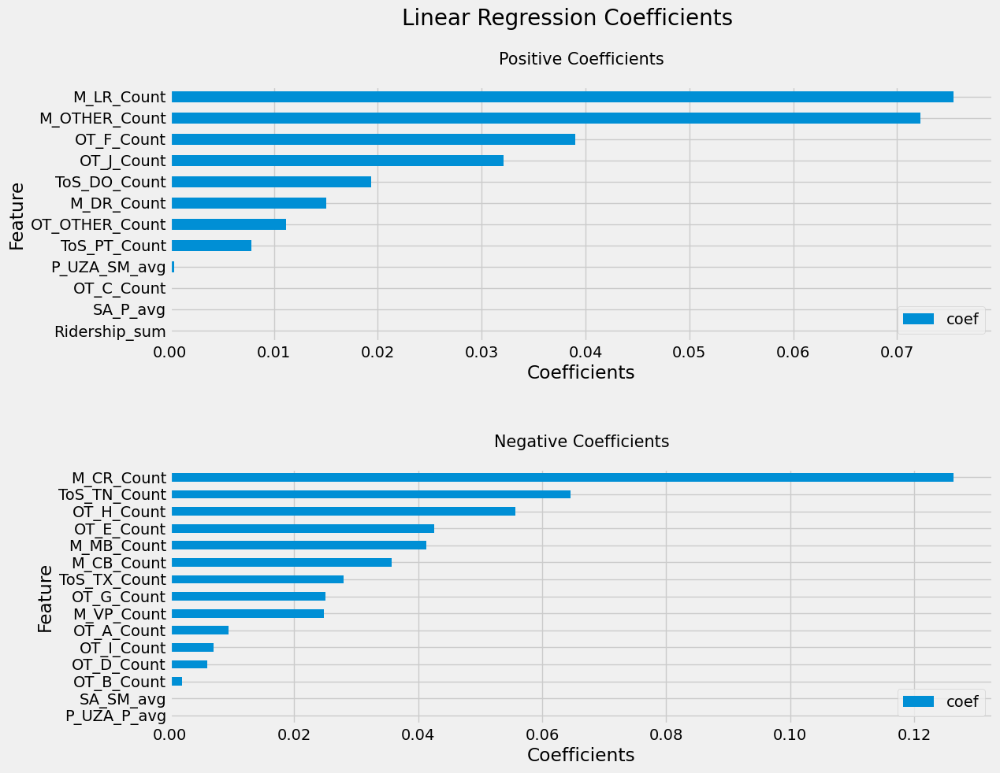

In [185]:
plot_pos_and_neg_lr_coefs(Model_lr2_pos_coefs, Model_lr2_neg_coefs)

The linear regression model is suggesting light rail (M_LR_Count) has the greatest positive effect on the target value while, again, Ridership_sum appears inconsequential.  It also finds that M_CR_Count has by far the greatest negative effect on the target value followed by ToS_TN_Count and others.  As with the first modeling dataframe, though, the linear regression model did not perform very well.  So I don't place much value in these findings.

#### 4.2.4.3 Random Forest
<a id= '4.2.4.3_Random_Forest'></a>

In [186]:
Model_rf2 = RandomForestRegressor()

In [187]:
Model_rf2.fit(X_train, y_train)

RandomForestRegressor()

In [188]:
y_pred_rf2 = Model_rf2.predict(X_test)

In [189]:
# Evaluation

R2_score_rf2 = Model_rf2.score(X_train, y_train)
print("R Squared score:", R2_score_rf2)

#MAPE_rf2 = mean_absolute_percentage_error(y_test, y_pred_rf2)
#print("MAPE:", MAPE_rf2)

MAE_rf2 = mean_absolute_error(y_test, y_pred_rf2)
print("MAE:", MAE_rf2)

MSE_rf2 = mean_squared_error(y_test, y_pred_rf2)
print("MSE:", MSE_rf2)

R Squared score: 0.8339504058728316
MAE: 0.49700651681358043
MSE: 0.7989197107612331


In [190]:
get_residuals(y_pred_rf2)

,y_test,y_pred,residual
24114,0.0,0.091773,-0.091773
24115,0.0,0.073342,-0.073342
24116,0.0,0.168595,-0.168595
24117,0.0,0.063955,-0.063955
24118,0.0,0.096222,-0.096222
...,...,...,...
30138,0.0,0.418903,-0.418903
30139,0.0,0.026193,-0.026193
30140,0.0,0.758470,-0.758470
30141,0.0,1.298929,-1.298929


In [191]:
get_resid_stats(get_residuals(y_pred_rf2))

,y_test,y_pred,residual
min,0.000000,0.000000,-3.047505
max,13.065491,3.047505,12.678922
median,0.000000,0.316135,-0.221392
mean,0.299303,0.407302,-0.107999
<lambda>,0.000000,0.000000,0.000000
std,0.815535,0.385887,0.887348


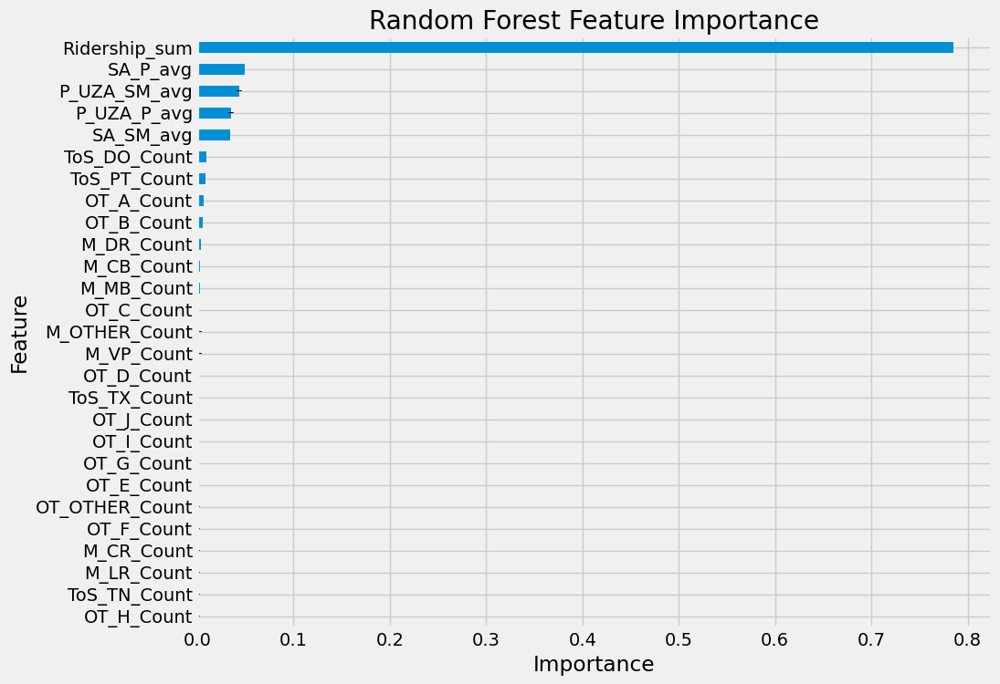

In [192]:
plot_rf_feature_importances(Model_rf2)

The random forest model finds that Ridership is by far the most important feature when predicting the target.  The size and population of the primary uza and service area are the next four in line and have similar values.

#### 4.2.4.4 KNN
<a id= '4.2.4.4_KNN'></a>

In [193]:
Model_knn2 = KNeighborsRegressor()

In [194]:
Model_knn2.fit(X_train, y_train)

KNeighborsRegressor()

In [195]:
y_pred_knn2 = Model_knn2.predict(X_test)

In [196]:
# Evaluation

R2_score_knn2 = Model_knn2.score(X_train, y_train)
print("R Squared score:", R2_score_knn2)

#MAPE_knn2 = mean_absolute_percentage_error(y_test, y_pred_knn2)
#print("MAPE:", MAPE_knn2)

MAE_knn2 = mean_absolute_error(y_test, y_pred_knn2)
print("MAE:", MAE_knn2)

MSE_knn2 = mean_squared_error(y_test, y_pred_knn2)
print("MSE:", MSE_knn2)

R Squared score: 0.2802271692411461
MAE: 0.39526021888108154
MSE: 0.880028958137087


In [197]:
get_residuals(y_pred_knn2)

,y_test,y_pred,residual
24114,0.0,0.614974,-0.614974
24115,0.0,0.522130,-0.522130
24116,0.0,0.071186,-0.071186
24117,0.0,0.543789,-0.543789
24118,0.0,0.614974,-0.614974
...,...,...,...
30138,0.0,0.000000,0.000000
30139,0.0,0.000000,0.000000
30140,0.0,0.000000,0.000000
30141,0.0,0.000000,0.000000


In [198]:
get_resid_stats(get_residuals(y_pred_knn2))

,y_test,y_pred,residual
min,0.000000,0.000000,-6.944355
max,13.065491,6.944355,13.065491
median,0.000000,0.077846,0.000000
mean,0.299303,0.270335,0.028968
<lambda>,0.000000,0.000000,0.000000
std,0.815535,0.518402,0.937729


#### 4.2.4.5 Comparing the Models' Performance
<a id='4.2.4.5_Comparing_the_Models_Performance'></a>


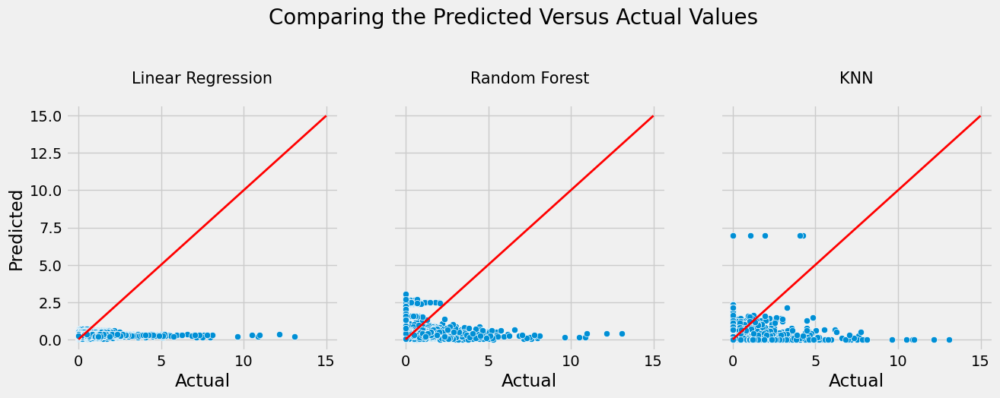

In [199]:
plot_pred_vs_actual(y_pred_lr2, y_pred_rf2, y_pred_knn2, 0, 15)

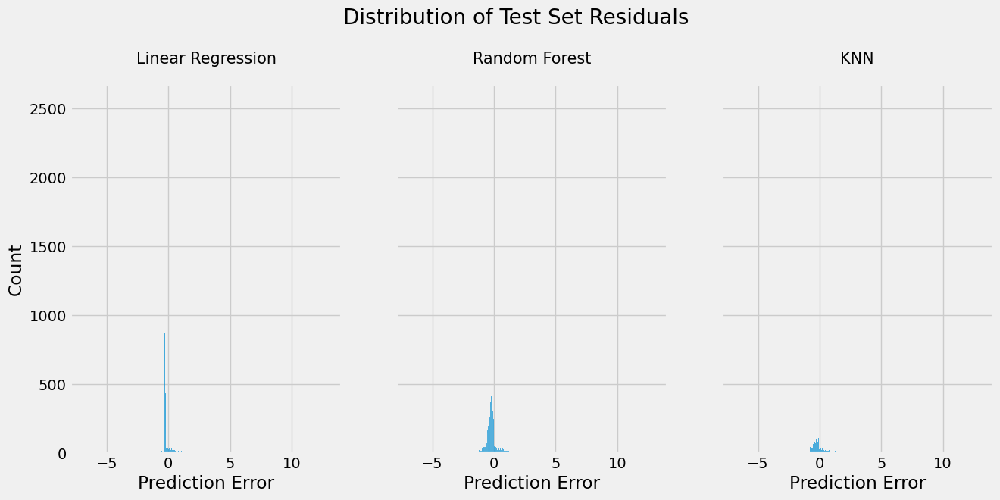

In [200]:
diff_lr2 = (y_test - y_pred_lr2)
diff_rf2 = (y_test - y_pred_rf2)
diff_knn2 = (y_test - y_pred_knn2)

plot_residual_comparison(diff_lr2, diff_rf2, diff_knn2)

In [201]:
#Comparing the performance of the models but excluding MAPE

def plot_model_performance_no_MAPE(MSE_lr, MSE_rf, MSE_knn, R2_score_lr, R2_score_rf, R2_score_knn, MAE_lr, MAE_rf, MAE_knn):

    MSEs = pd.Series([MSE_lr, MSE_rf, MSE_knn], name='values')
    R2s = pd.Series([R2_score_lr, R2_score_rf, R2_score_knn], name='values')
    #MAPEs = pd.Series([MAPE_lr, MAPE_rf, MAPE_knn], name='values')
    MAEs = pd.Series([MAE_lr, MAE_rf, MAE_knn], name='values')
    labels = pd.Series(['LR','RF','KNN'], name='labels')


    fig, ax =plt.subplots(1,3,figsize=(22,6), sharex=True, sharey=False)
    fig.suptitle("Evaluating Model Performance", fontsize=20, y=1.05)


    sns.pointplot(data=pd.concat([MSEs, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend=True, 
                  ax=ax[0], hue='values')
    ax[0].set_title("Mean Squared Errors", fontsize=15, y=1.05)
    ax[0].set_xlabel("Model", fontsize=10)
    ax[0].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1))

    sns.pointplot(data=pd.concat([R2s, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend=True, 
                  ax=ax[1], hue='values')
    ax[1].set_title("R Squared Scores", fontsize=15, y=1.05)
    ax[1].set_xlabel("Model", fontsize=10)
    ax[1].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1))

    sns.pointplot(data=pd.concat([MAEs, labels], axis=1), 
                  x='labels', y='values', 
                  join=False, legend=True, 
                  ax=ax[2], hue='values')
    ax[2].set_title("Mean Absolute Errors", fontsize=15, y=1.05)
    ax[2].set_xlabel("Model", fontsize=10)
    ax[2].set_ylabel("Value", fontsize=10, x=1.05)
    #ax[0,0].set(ylim=(-0.25, 1));

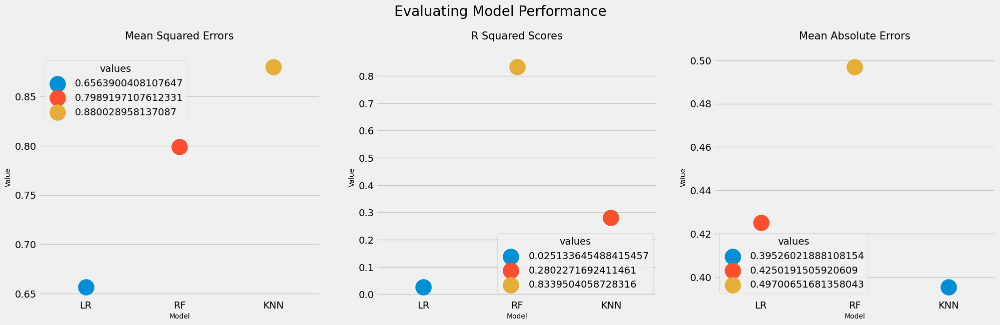

In [202]:
plot_model_performance_no_MAPE(MSE_lr2, MSE_rf2, MSE_knn2, R2_score_lr2, R2_score_rf2, 
                               R2_score_knn2, MAE_lr2, MAE_rf2, MAE_knn2)


Here again, Random Forest appears to be the best of the three at predicting the target. 

#### 4.2.4.6 XGBoost Regression
<a id='4.2.4.6_XGBoost_Regression'></a>

In [203]:
Model_xgbr2 = xgb.XGBRegressor()

In [204]:
Model_xgbr2.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [205]:
y_pred_xgbr2 = Model_xgbr2.predict(X_test)

In [206]:

R2_score_xgbr2 = Model_xgbr2.score(X_train, y_train)
print("R Squared score:", R2_score_xgbr2)

#MAPE_xgbr2 = mean_absolute_percentage_error(y_test, y_pred_xgbr2)
#print("MAPE:", MAPE_xgbr2)

MAE_xgbr2 = mean_absolute_error(y_test, y_pred_xgbr2)
print("MAE:", MAE_xgbr2)

MSE_xgbr2 = mean_squared_error(y_test, y_pred_xgbr2)
print("MSE:", MSE_xgbr2)

R Squared score: 0.5484638737147021
MAE: 0.4544592630535547
MSE: 0.8083175211847626


In [207]:
get_residuals(y_pred_xgbr2)

,y_test,y_pred,residual
24114,0.0,0.092357,-0.092357
24115,0.0,0.112941,-0.112941
24116,0.0,0.092357,-0.092357
24117,0.0,0.112941,-0.112941
24118,0.0,0.092357,-0.092357
...,...,...,...
30138,0.0,0.345227,-0.345227
30139,0.0,0.199429,-0.199429
30140,0.0,0.379514,-0.379514
30141,0.0,0.349304,-0.349304


In [208]:
get_resid_stats(get_residuals(y_pred_xgbr2))

,y_test,y_pred,residual
min,0.000000,-0.514761,-12.993938
max,13.065491,12.993938,13.110761
median,0.000000,0.251150,-0.168977
mean,0.299303,0.339962,-0.040659
<lambda>,0.000000,0.579318,-0.703419
std,0.815535,0.414768,0.898219


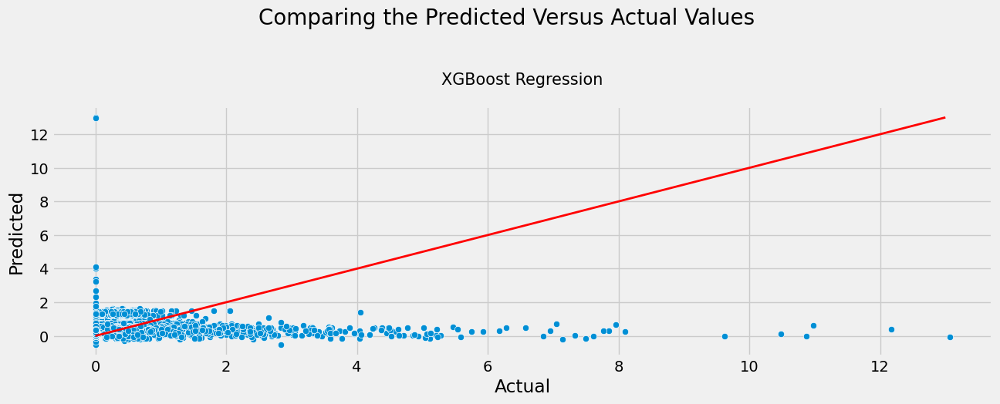

In [209]:
plot_pred_vs_act_single(y_pred_xgbr2, 0, 13)

XGBoost Regression does not appear to predict the target very well for this dataframe.

#### 4.2.4.7 Modeling the Whole Dataset
<a id='4.2.4.7_Modeling_the_Whole_Dataset'></a>
Since random forest was the best predictor for this dataframe, I'll use it to model the complete dataset.

In [210]:
#Defining X and y

X = modeling_df2.drop(['Safety Ratio'], axis = 1)
y = modeling_df2['Safety Ratio']

In [211]:
Model_rf2_all = RandomForestRegressor()

In [212]:
Model_rf2_all.fit(X, y)

RandomForestRegressor()

In [213]:
#shap.initjs()

In [214]:
explainer = shap.TreeExplainer(Model_rf2_all)


In [215]:
#shap_values = explainer.shap_values(X)

In [216]:
#shap.summary_plot(shap_values, X, plot_type="bar")

In [217]:
#shap.force_plot(explainer.expected_value, shap_values, X)

In [218]:
#shap.summary_plot(shap_values, X)

In [219]:
#shap.dependence_plot("Ridership_sum", shap_values, X_train)

In [220]:
###Too big to run

###for name in X.columns:
###    shap.dependence_plot(name, shap_values, X)


#### 4.2.4.8 Modeling Nashville's Data
<a id='4.2.4.8_Modeling_Nashvilles_Data'></a>

In [221]:
modeling_df2_Nashville = modeling_df2_with_location_and_date[
    modeling_df2_with_location_and_date[
        'Primary UZA Name']=='Nashville-Davidson, TN']


In [222]:
modeling_df2_Nashville.reset_index(inplace=True)
modeling_df2_Nashville = modeling_df2_Nashville.drop(columns=['Date', 'Primary UZA Name'])

In [223]:
#Defining X and y

X = modeling_df2_Nashville.drop(['Safety Ratio'], axis = 1)
y = modeling_df2_Nashville['Safety Ratio']

In [224]:
Model_rf2_Nashville = RandomForestRegressor()

In [225]:
Model_rf2_Nashville.fit(X, y)

RandomForestRegressor()

In [226]:
#shap.initjs()

In [227]:
explainer = shap.TreeExplainer(Model_rf2_Nashville)


In [228]:
shap_values = explainer.shap_values(X)

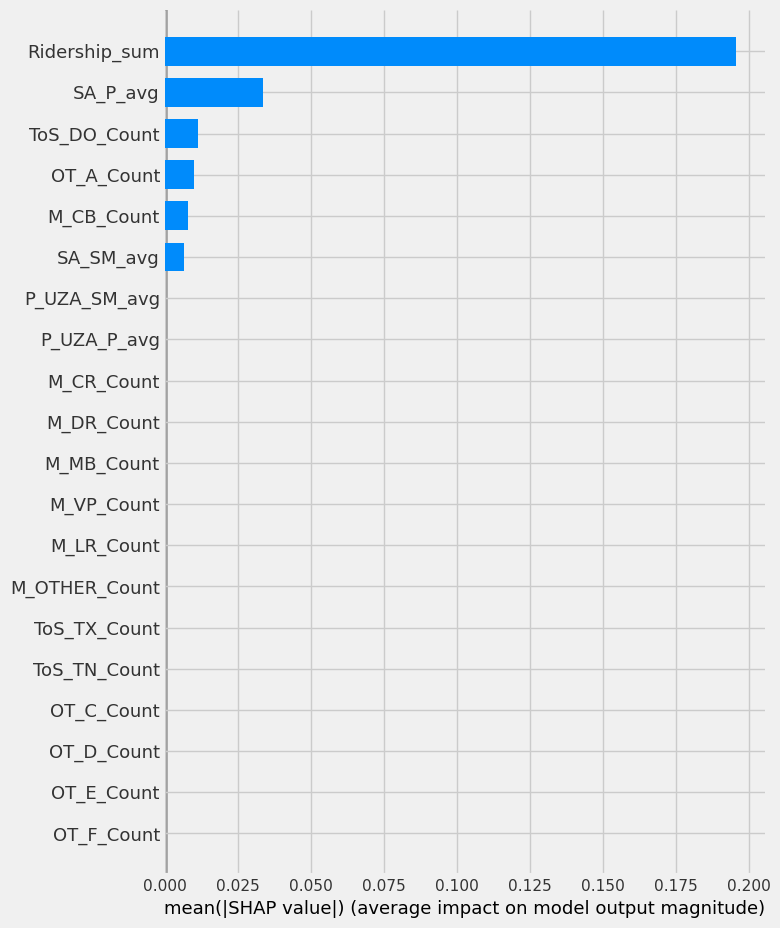

In [229]:
shap.summary_plot(shap_values, X, plot_type="bar")

The summary plot above shows that Ridership_sum was the most important feature, changing the predicted absolute value of the target on average by almost 2%.

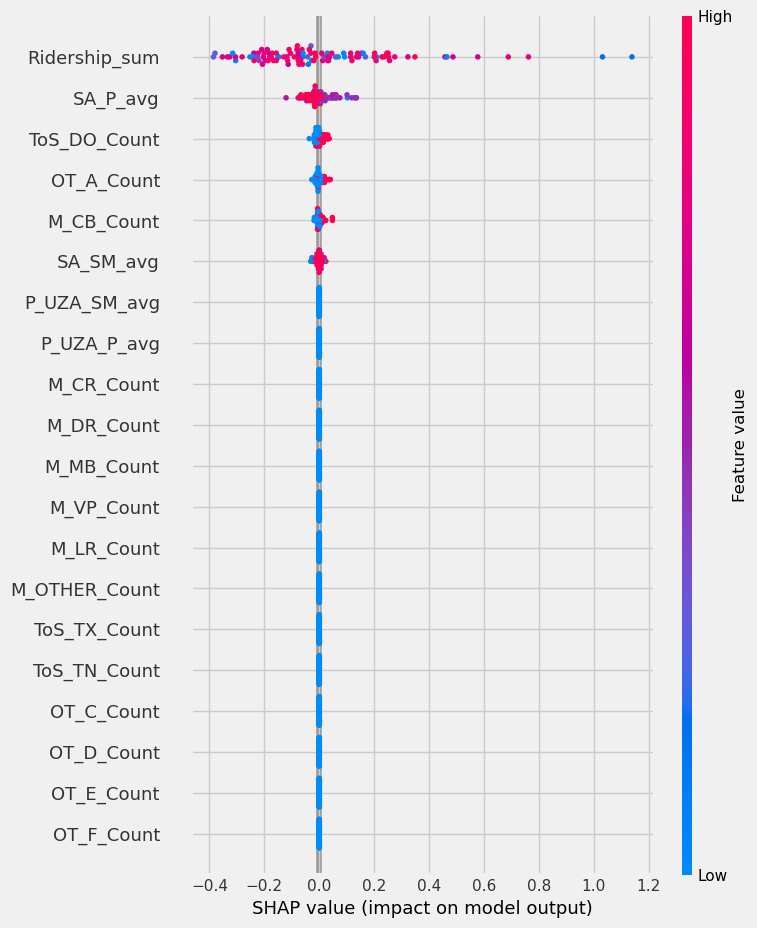

In [230]:
shap.summary_plot(shap_values, X)

It is interesting to see that there is not a straightforward relationship between the ridership values and the target.  Both OT_A_Count and M_CB_Count have a clear relationship with the target - a higher value increases the target - but thier overall effect on the target is less significant than ridership.

The dependence plot below gives additional detail.

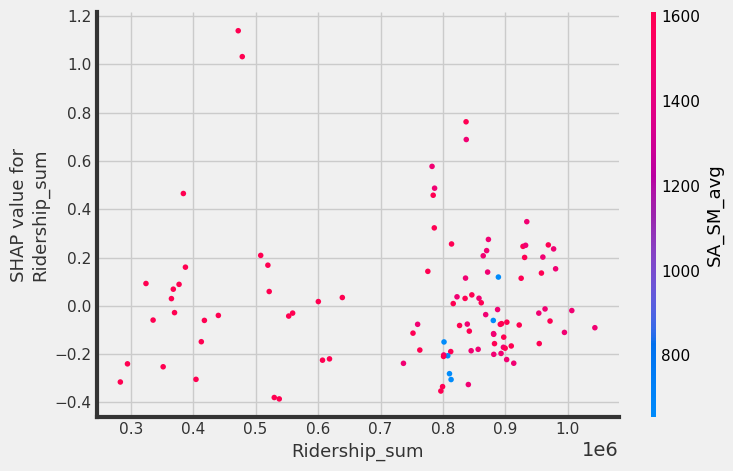

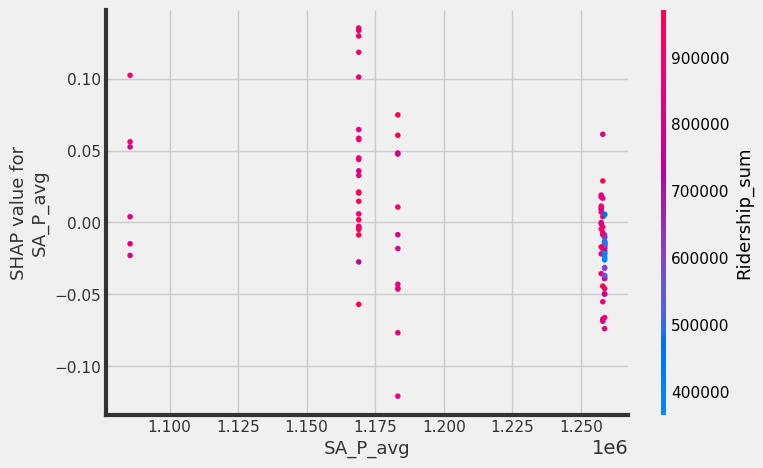

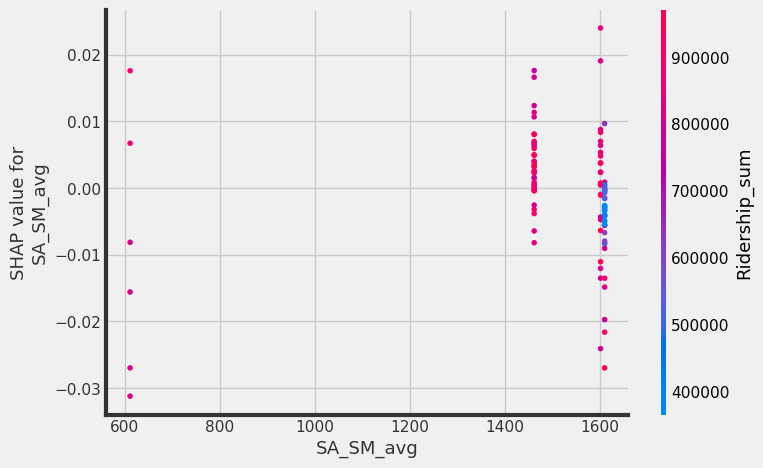

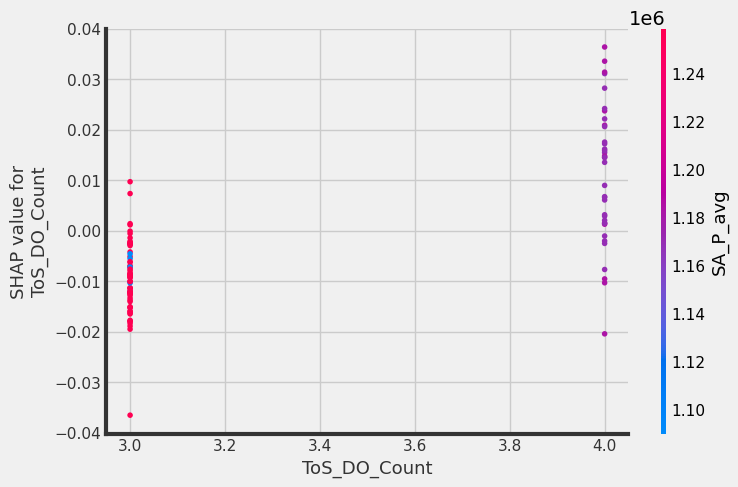

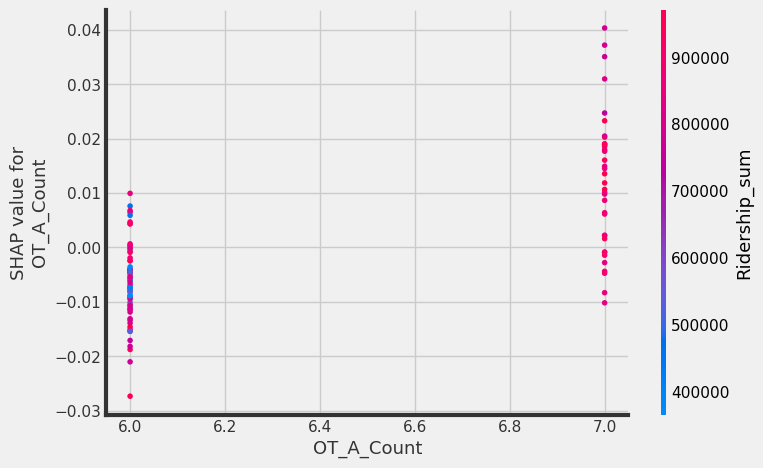

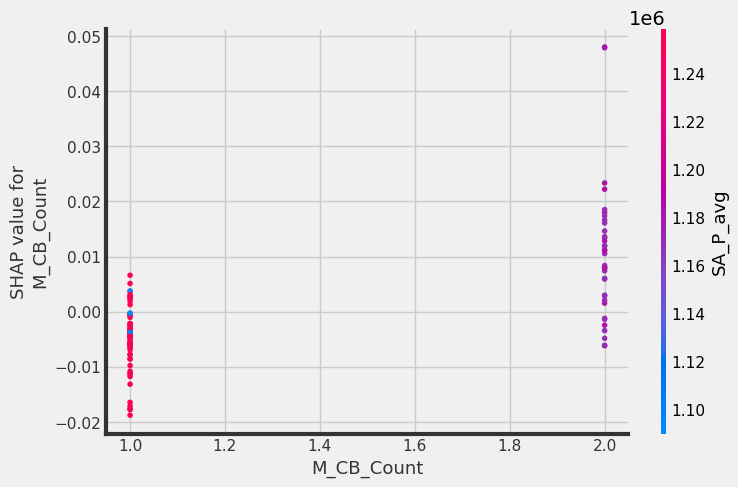

In [231]:
names = ('Ridership_sum','SA_P_avg','SA_SM_avg','ToS_DO_Count','OT_A_Count','M_CB_Count')

for name in names:
    shap.dependence_plot(name, shap_values, X)


In [232]:
shap.force_plot(explainer.expected_value, shap_values, X)

The force plot above, when viewed in original sample order, shows alternating highs and lows.  I'll pull out one high value and one low value to explore.

In [233]:
shap.force_plot(explainer.expected_value, 
                shap_values[16, :], X.iloc[16, :])


In [234]:
shap.force_plot(explainer.expected_value, 
                shap_values[17, :], X.iloc[17, :])


Well, ridership is the clear answer.  It appears ridership in Nahsville ebbs and flows.  It would be interesting to explore this further in another project - perhaps comparing this fluctuation to weather or tourism. 

In [235]:
#shap.dependence_plot("Ridership_sum", shap_values, X_train)

## 4.3 Third Modeling Dataframe:  Aggregated by Time and Mode for the Whole Nation
<a id='4.3_Third_Modeling_Dataframe'></a>
This aggregation results in one row of data per mode per month.

|  |  |
|:---------|:-------------|
|Time|Time|
|Dimensions|The Nation, Mode|
|Features|Type of Service (ecoded)|
||Organization Type (encoded and reduced)|
||Primary UZA Sq Miles|
||Primary UZA Population|
||Service Area Sq Miles|
||Service Area Population|
||Ridership|
|Target|Safety Ratio|



### 4.3.1 Encoding the Data for Modeling
<a id='4.3.1_Encoding_the_Data_for_Modeling'></a>
I will use the version of the National dataframe I saved before the categorical features were encoded because the encoding will be different here.  'Organization Type' and 'Type of Service' will be encoded in the same way such that the value in each row will reflect the number of times that valeus occurred for that month (and here for each mode) in the dataframe.  Mode, however, will be encoded separately later such that the value in that column will be either a zero or a one, equivalent to a yes or no, for whether that row of data occurred with that particular mode or not.

In [236]:
National_data_before_encoding.head()

,5 DIgit NTD ID,Agency,Organization Type,Mode,Type of Service,Rail (Y/N),Primary UZA Code,Primary UZA Name,Primary UZA Sq Miles,Primary UZA Population,...,Year,Month,Vehicles,Vehicle Revenue Miles,Vehicle Revenue Hours,Ridership,Total Events,Total Fatalities,Total Injuries,all_Modes
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,8,Tri-County Metropolitan Transportation Distric...,Independent Public Agency or Authority of Tran...,LR,DO,True,24.0,"Portland, OR-WA",524.0,1849898.0,...,2014,1,104,636145,43533,3030400,1,0,1,['CB' 'DR' 'LR' 'MB' 'SR' 'TR' 'VP' 'YR']
2014-01-01,8,Tri-County Metropolitan Transportation Distric...,Independent Public Agency or Authority of Tran...,MB,DO,False,24.0,"Portland, OR-WA",524.0,1849898.0,...,2014,1,516,1605059,136485,5235300,6,0,11,['CB' 'DR' 'LR' 'MB' 'SR' 'TR' 'VP' 'YR']
2014-01-01,20008,MTA New York City Transit,"Subsidiary Unit of a Transit Agency, Reporting...",DR,PT,False,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,...,2014,1,1579,3704416,317934,474836,11,0,17,['CB' 'CR' 'DR' 'HR' 'LR' 'MB' 'RB' 'VP' 'YR']
2014-01-01,20008,MTA New York City Transit,"Subsidiary Unit of a Transit Agency, Reporting...",HR,DO,True,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,...,2014,1,5232,29283817,1611532,208881579,13,2,9,['CB' 'CR' 'DR' 'HR' 'LR' 'MB' 'RB' 'VP' 'YR']
2014-01-01,20008,MTA New York City Transit,"Subsidiary Unit of a Transit Agency, Reporting...",MB,DO,False,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,...,2014,1,3282,7166888,1013133,57418953,30,1,42,['CB' 'CR' 'DR' 'HR' 'LR' 'MB' 'RB' 'VP' 'YR']


#### 4.3.1.1 Encoding the Categorical Features
<a id='4.3.1.1_Encoding_the_Categorical_Features'></a>

In [237]:
#Renaming the Organization Types so the dummied column names won't be so cumbersome

National_data_limited_encoding = National_data_before_encoding.copy()

map_org_type(National_data_limited_encoding)


In [238]:
# encoding 'Organization Type' and 'Type of Service'

National_data_limited_encoding = pd.get_dummies(National_data_limited_encoding, 
                                                columns=['Organization Type',
                                                         'Type of Service'], 
                                                prefix=['OT','ToS'])


#### 4.3.1.2 Creating '...OTHER' Columns for Organization Type
<a id='4.3.1.2_Creating_OTHER_Columns_for_Organization_Type'></a>

In [239]:
National_data_limited_encoding['OT_OTHER'] = (
    National_data_limited_encoding['OT_K'] + National_data_limited_encoding['OT_L'])


In [240]:
National_data_limited_encoding.head()

,5 DIgit NTD ID,Agency,Mode,Rail (Y/N),Primary UZA Code,Primary UZA Name,Primary UZA Sq Miles,Primary UZA Population,Service Area Sq Miles,Service Area Population,...,OT_H,OT_I,OT_J,OT_K,OT_L,ToS_DO,ToS_PT,ToS_TN,ToS_TX,OT_OTHER
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,8,Tri-County Metropolitan Transportation Distric...,LR,True,24.0,"Portland, OR-WA",524.0,1849898.0,533.0,1542044.0,...,0,0,0,0,0,1,0,0,0,0
2014-01-01,8,Tri-County Metropolitan Transportation Distric...,MB,False,24.0,"Portland, OR-WA",524.0,1849898.0,533.0,1542044.0,...,0,0,0,0,0,1,0,0,0,0
2014-01-01,20008,MTA New York City Transit,DR,False,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,321.0,8491079.0,...,0,0,0,0,0,0,1,0,0,0
2014-01-01,20008,MTA New York City Transit,HR,True,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,321.0,8491079.0,...,0,0,0,0,0,1,0,0,0,0
2014-01-01,20008,MTA New York City Transit,MB,False,1.0,"New York-Newark, NY-NJ-CT",3450.0,18351295.0,321.0,8491079.0,...,0,0,0,0,0,1,0,0,0,0


### 4.3.2 Aggregating the Data for Modeling
<a id='4.3.2_Aggregating_the_Data_for_Modeling'></a>

#### 4.3.2.1 Part 1 of Aggregation
<a id='4.3.2.1_Part_1_of_Aggregation'></a>

In [241]:
modeling_df3_piece_1 = National_data_limited_encoding.groupby(['Date', 'Mode']).agg(
    Fatalities_sum=('Total Fatalities', 'sum'),
    Injuries_sum=('Total Injuries', 'sum'),
    Events_sum=('Total Events', 'sum'),
    VRM_sum=('Vehicle Revenue Miles','sum'),
    Ridership_sum = ('Ridership','sum'),
    OT_A_Count = ('OT_A', 'sum'),
    OT_B_Count = ('OT_B', 'sum'),
    OT_C_Count = ('OT_C', 'sum'),
    OT_D_Count = ('OT_D', 'sum'),
    OT_E_Count = ('OT_E', 'sum'),
    OT_F_Count = ('OT_F', 'sum'),
    OT_G_Count = ('OT_G', 'sum'),
    OT_H_Count = ('OT_H', 'sum'),
    OT_I_Count = ('OT_I', 'sum'),
    OT_J_Count = ('OT_J', 'sum'),
    OT_OTHER_Count = ('OT_OTHER', 'sum'),
    ToS_DO_Count = ('ToS_DO', 'sum'),
    ToS_PT_Count = ('ToS_PT', 'sum'),
    ToS_TN_Count = ('ToS_TN', 'sum'),
    ToS_TX_Count = ('ToS_TX', 'sum')
).reset_index()


In [242]:
modeling_df3_piece_1.shape


(1428, 22)

In [243]:
modeling_df3_piece_1.head()

,Date,Mode,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,OT_A_Count,OT_B_Count,OT_C_Count,...,OT_F_Count,OT_G_Count,OT_H_Count,OT_I_Count,OT_J_Count,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count
0,2014-01-01,CB,2,40,6,9799029,7382751,51.0,24,1,...,2,0,17,0,0,1,51.0,49,0,0
1,2014-01-01,CC,0,0,0,25284,496750,0.0,1,0,...,0,0,0,0,0,0,1.0,0,0,0
2,2014-01-01,CR,0,0,0,28062564,38598567,16.0,0,0,...,3,0,0,0,0,0,7.0,16,0,0
3,2014-01-01,DR,0,76,52,59090140,7910270,261.0,217,10,...,8,10,0,2,2,5,220.0,230,0,73
4,2014-01-01,HR,5,31,45,55530393,300475967,11.0,1,0,...,1,0,0,0,0,0,14.0,1,0,0


#### 4.3.2.2 Part 2 of Aggregation
<a id='4.3.2.2_Part_2_of_Aggregation'></a>

In [244]:
# Step 1: averaging within each location
# for example, averaging within Houston TX so Houston has only one value

temp_df3 = National_data_limited_encoding.groupby(['Primary UZA Name', 'Mode', 'Date']).agg(
    P_UZA_SM_avg = ('Primary UZA Sq Miles', 'mean'),
    P_UZA_P_avg = ('Primary UZA Population', 'mean'),
    SA_SM_avg = ('Service Area Sq Miles', 'mean'),
    SA_P_avg = ('Service Area Population', 'mean'),
).reset_index()



In [245]:
temp_df3.shape

(82518, 7)

In [246]:
temp_df3.head(15)

,Primary UZA Name,Mode,Date,P_UZA_SM_avg,P_UZA_P_avg,SA_SM_avg,SA_P_avg
0,"Aberdeen-Bel Air South-Bel Air North, MD",DR,2014-01-01,131.0,213751.0,131.0,218590.0
1,"Aberdeen-Bel Air South-Bel Air North, MD",DR,2014-02-01,131.0,213751.0,131.0,218590.0
2,"Aberdeen-Bel Air South-Bel Air North, MD",DR,2014-03-01,131.0,213751.0,131.0,218590.0
3,"Aberdeen-Bel Air South-Bel Air North, MD",DR,2014-04-01,131.0,213751.0,131.0,218590.0
4,"Aberdeen-Bel Air South-Bel Air North, MD",DR,2014-05-01,131.0,213751.0,131.0,218590.0
5,"Aberdeen-Bel Air South-Bel Air North, MD",DR,2014-06-01,131.0,213751.0,131.0,218590.0
6,"Aberdeen-Bel Air South-Bel Air North, MD",MB,2014-01-01,131.0,213751.0,131.0,218590.0
7,"Aberdeen-Bel Air South-Bel Air North, MD",MB,2014-02-01,131.0,213751.0,131.0,218590.0
8,"Aberdeen-Bel Air South-Bel Air North, MD",MB,2014-03-01,131.0,213751.0,131.0,218590.0
9,"Aberdeen-Bel Air South-Bel Air North, MD",MB,2014-04-01,131.0,213751.0,131.0,218590.0


In [247]:
# Step 2: summing the values for each location
# for example, this adds the value found above for Houston 
# to the value for Las Vegas, and so on.

modeling_df3_piece_2 = temp_df3.groupby(['Date','Mode']).agg(
    P_UZA_SM_National = ('P_UZA_SM_avg','sum'),
    P_UZA_P_National = ('P_UZA_P_avg','sum'),
    SA_SM_National = ('SA_SM_avg','sum'),
    SA_P_National = ('SA_P_avg','sum')
)
modeling_df3_piece_2 = modeling_df3_piece_2.round(0)
modeling_df3_piece_2 = modeling_df3_piece_2.reset_index()
modeling_df3_piece_2

,Date,Mode,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National
0,2014-01-01,CB,31986.0,101772572.0,46008.0,46075628.0
1,2014-01-01,CC,524.0,3281212.0,49.0,836620.0
2,2014-01-01,CR,21665.0,82327534.0,24561.0,63764271.0
3,2014-01-01,DR,75865.0,201468911.0,126347.0,116462306.0
4,2014-01-01,HR,19569.0,72751547.0,11010.0,40163978.0
...,...,...,...,...,...,...
1423,2022-06-01,SR,17373.0,46934845.0,6177.0,16863256.0
1424,2022-06-01,TB,5739.0,16687282.0,6545.0,10003711.0
1425,2022-06-01,TR,524.0,1849898.0,11.0,91561.0
1426,2022-06-01,VP,40695.0,127644361.0,87860.0,108294263.0


In [248]:
modeling_df3_piece_1.shape

(1428, 22)

In [249]:
modeling_df3_piece_2.shape

(1428, 6)

#### 4.3.2.3 Joining Part 1 and Part 2
<a id='4.3.2.3_Joining_Part_1_and_Part_2'></a>

In [250]:
modeling_df3 = pd.merge(modeling_df3_piece_1, modeling_df3_piece_2, on=['Mode','Date'])

In [251]:
modeling_df3 = modeling_df3.set_index('Date')

In [252]:
modeling_df3.shape

(1428, 25)

In [253]:
modeling_df3.head()

,Mode,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,OT_A_Count,OT_B_Count,OT_C_Count,OT_D_Count,...,OT_J_Count,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,CB,2,40,6,9799029,7382751,51.0,24,1,3,...,0,1,51.0,49,0,0,31986.0,101772572.0,46008.0,46075628.0
2014-01-01,CC,0,0,0,25284,496750,0.0,1,0,0,...,0,0,1.0,0,0,0,524.0,3281212.0,49.0,836620.0
2014-01-01,CR,0,0,0,28062564,38598567,16.0,0,0,3,...,0,0,7.0,16,0,0,21665.0,82327534.0,24561.0,63764271.0
2014-01-01,DR,0,76,52,59090140,7910270,261.0,217,10,3,...,2,5,220.0,230,0,73,75865.0,201468911.0,126347.0,116462306.0
2014-01-01,HR,5,31,45,55530393,300475967,11.0,1,0,2,...,0,0,14.0,1,0,0,19569.0,72751547.0,11010.0,40163978.0


#### 4.3.2.4 Encoding 'Mode'
<a id='4.3.2.4_Encoding_Mode'></a>

In [254]:
# saving a version of the modeling dataframe before encoding mode for exploration later

modeling_df3_before_encoding_mode = modeling_df3.copy()

In [255]:
# Creating an OTHER column for mode

modeling_df3['Mode'] = modeling_df3['Mode'].replace([
    'CC','HR','MG','RB','SR','TB','TR','YR'], 'OTHER')


### 

In [256]:
# encode mode now such that each column means yes or no for each mode

modeling_df3 = pd.get_dummies(modeling_df3, columns=['Mode'], prefix=['M'])
modeling_df3.head()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,OT_A_Count,OT_B_Count,OT_C_Count,OT_D_Count,OT_E_Count,...,P_UZA_P_National,SA_SM_National,SA_P_National,M_CB,M_CR,M_DR,M_LR,M_MB,M_OTHER,M_VP
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,2,40,6,9799029,7382751,51.0,24,1,3,1,...,101772572.0,46008.0,46075628.0,1,0,0,0,0,0,0
2014-01-01,0,0,0,25284,496750,0.0,1,0,0,0,...,3281212.0,49.0,836620.0,0,0,0,0,0,1,0
2014-01-01,0,0,0,28062564,38598567,16.0,0,0,3,1,...,82327534.0,24561.0,63764271.0,0,1,0,0,0,0,0
2014-01-01,0,76,52,59090140,7910270,261.0,217,10,3,5,...,201468911.0,126347.0,116462306.0,0,0,1,0,0,0,0
2014-01-01,5,31,45,55530393,300475967,11.0,1,0,2,0,...,72751547.0,11010.0,40163978.0,0,0,0,0,0,1,0


#### 4.3.2.5 Checking the Aggregation
<a id='4.3.2.5_Checking_the_Aggregation'></a>

In [257]:
# subsetting the two dataframes for a given mode since this step isn't part of 
# the check_agg_part_1 function I created earlier in the notebook

p = select_subset(modeling_df3_piece_1, 'Mode', 'HR')
p = p.set_index('Date')

q = select_subset(National_data_limited_encoding, 'Mode', 'HR')


In [258]:
check_agg_part_1('Organization Type', 'A', '2018-02-01', p, q, 'OT_A_Count', 'OT_A')


Checking Part 1 of Aggregation:  
Comparing two calculation for the Organization Type A for 2018-02-01
modeling dataframe value: 11.0
checked value: 11


In [259]:
# subsetting the two dataframes for a given mode since this step isn't part of 
# the check_agg_part_2_step_1 function I created earlier in the notebook

r = select_subset(temp_df3, 'Mode', 'HR')


In [260]:
check_agg_part_2_step_1('P_UZA_P_avg', 'Primary UZA Population', 
                        'Washington, DC-VA-MD', '2021-02-01', r, q)


Checking Part 2 Step 1 of Aggregation:  
Comparing two calculation for the average Primary UZA Population for Washington, DC-VA-MD 2021-02-01
modeling dataframe value: 4586770.0
checked value: 4586770.0


In [261]:
# Checks the second step of the second part of the aggregation.
# I needed an alternate version of the function I made earlier in the notebook
# to use for this aggregation.

def check_agg_part_2_step_2_v2(mod_column, Nat_column, date, mode, mod_df, temp_df):

    print ('\033[1m' + 'Checking Part 2 Step 2 of Aggregation: ','\033[0m')
    print("Comparing two calculation for the total", Nat_column, "for", mode, "for", date)

    t = mod_df[mod_df['Date']==date]
    t = t[t['Mode']==mode]
    print ('modeling dataframe value', t[mod_column].item())

    w = temp_df[temp_df['Date']==date]
    w = w[w['Mode']==mode]
    w = w.drop_duplicates(subset=['Primary UZA Name', 'Mode'])
    w = w[Nat_column].sum()
    w = w.round(0)
    print('checked value:', w)


In [262]:
check_agg_part_2_step_2_v2('SA_SM_National', 'SA_SM_avg', '2022-06-01', 'HR', 
                           modeling_df3_piece_2, temp_df3)


Checking Part 2 Step 2 of Aggregation:  
Comparing two calculation for the total SA_SM_avg for HR for 2022-06-01
modeling dataframe value 14965.0
checked value: 14965.0


### 4.3.3 Creating the Target
<a id='4.3.3_Creating_the_Target'></a>

In [263]:
create_target(modeling_df3)
modeling_df3.head()

,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,OT_A_Count,OT_B_Count,OT_C_Count,OT_D_Count,OT_E_Count,...,SA_SM_National,SA_P_National,M_CB,M_CR,M_DR,M_LR,M_MB,M_OTHER,M_VP,Safety Ratio
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,2,40,6,9799029,7382751,51.0,24,1,3,1,...,46008.0,46075628.0,1,0,0,0,0,0,0,0.489844
2014-01-01,0,0,0,25284,496750,0.0,1,0,0,0,...,49.0,836620.0,0,0,0,0,0,1,0,0.000000
2014-01-01,0,0,0,28062564,38598567,16.0,0,0,3,1,...,24561.0,63764271.0,0,1,0,0,0,0,0,0.000000
2014-01-01,0,76,52,59090140,7910270,261.0,217,10,3,5,...,126347.0,116462306.0,0,0,1,0,0,0,0,0.216618
2014-01-01,5,31,45,55530393,300475967,11.0,1,0,2,0,...,11010.0,40163978.0,0,0,0,0,0,1,0,0.145866


In [264]:
modeling_df3['Safety Ratio'].isna().sum()

39

In rows where there were no fatalities, injuries, or events, I end up with Nans because I have divided by zero.  I will replace the Nans with zeros since that is the logical value.


In [265]:
modeling_df3['Safety Ratio'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)
modeling_df3['Safety Ratio'].isna().sum()


0

In [266]:
modeling_df3 = modeling_df3.drop(['VRM_sum', 'Fatalities_sum','Injuries_sum','Events_sum'], axis=1)


### 4.3.4 Exploring the Data
<a id='4.3.4_Exploring_the_Data'></a>

In [267]:
modeling_df3.describe()

,Ridership_sum,OT_A_Count,OT_B_Count,OT_C_Count,OT_D_Count,OT_E_Count,OT_F_Count,OT_G_Count,OT_H_Count,OT_I_Count,...,SA_SM_National,SA_P_National,M_CB,M_CR,M_DR,M_LR,M_MB,M_OTHER,M_VP,Safety Ratio
count,1.428000e+03,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,...,1428.000000,1.428000e+03,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000,1428.000000
mean,4.976096e+07,47.947479,32.489496,1.953782,1.613445,1.343137,1.306723,1.205182,1.101541,0.894958,...,37786.249300,4.662581e+07,0.071429,0.071429,0.071429,0.071429,0.071429,0.571429,0.071429,1.391377
std,1.084478e+08,85.294268,67.905489,3.655731,1.852407,1.800853,2.057283,2.692209,3.153654,2.281863,...,50683.515553,4.269222e+07,0.257630,0.257630,0.257630,0.257630,0.257630,0.495045,0.257630,3.027320
min,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,11.000000,7.283200e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.211597e+06,3.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,4984.000000,1.026993e+07,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.019272
50%,4.762025e+06,10.000000,2.000000,0.000000,1.000000,1.000000,0.500000,0.000000,0.000000,0.000000,...,11032.000000,3.775006e+07,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.315005
75%,2.288458e+07,43.000000,16.000000,2.000000,3.000000,2.000000,1.000000,1.000000,0.000000,0.000000,...,49501.000000,6.586100e+07,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.252361
max,4.687261e+08,281.000000,218.000000,13.000000,6.000000,6.000000,12.000000,12.000000,17.000000,9.000000,...,172786.000000,1.330208e+08,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,36.196911


In [268]:
m_df3_temp = modeling_df3.reset_index()
#sns.pairplot(m_df3_temp, corner=True)


<AxesSubplot:>

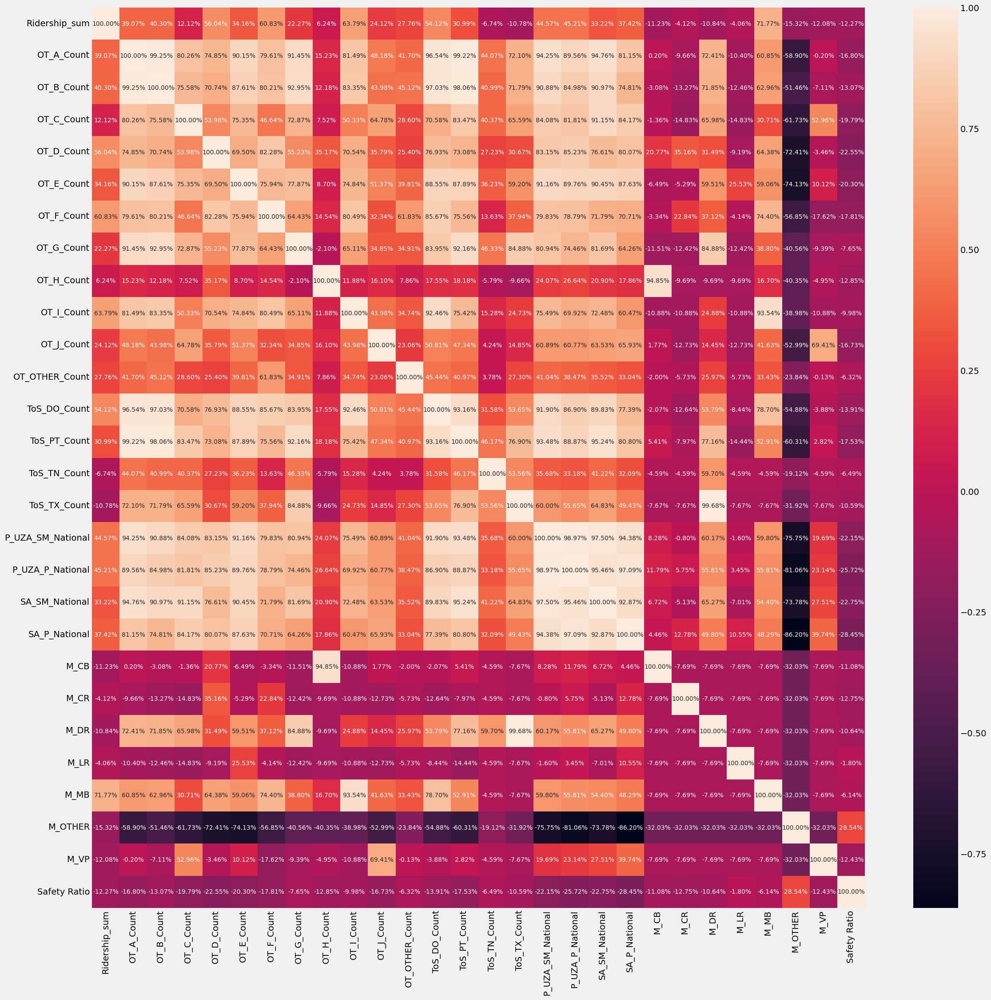

In [269]:
plt.subplots(figsize=(25,25))
sns.heatmap(modeling_df3.corr(), annot=True, fmt='.2%', annot_kws={"fontsize":10})

In [270]:
create_target(modeling_df3_before_encoding_mode)
modeling_df3_before_encoding_mode['Safety Ratio'].replace([np.inf, -np.inf, np.nan], 0, inplace=True)


In [271]:
modeling_df3_before_encoding_mode.head()

,Mode,Fatalities_sum,Injuries_sum,Events_sum,VRM_sum,Ridership_sum,OT_A_Count,OT_B_Count,OT_C_Count,OT_D_Count,...,OT_OTHER_Count,ToS_DO_Count,ToS_PT_Count,ToS_TN_Count,ToS_TX_Count,P_UZA_SM_National,P_UZA_P_National,SA_SM_National,SA_P_National,Safety Ratio
Date,,,,,,,,,,,,,,,,,,,,,
2014-01-01,CB,2,40,6,9799029,7382751,51.0,24,1,3,...,1,51.0,49,0,0,31986.0,101772572.0,46008.0,46075628.0,0.489844
2014-01-01,CC,0,0,0,25284,496750,0.0,1,0,0,...,0,1.0,0,0,0,524.0,3281212.0,49.0,836620.0,0.000000
2014-01-01,CR,0,0,0,28062564,38598567,16.0,0,0,3,...,0,7.0,16,0,0,21665.0,82327534.0,24561.0,63764271.0,0.000000
2014-01-01,DR,0,76,52,59090140,7910270,261.0,217,10,3,...,5,220.0,230,0,73,75865.0,201468911.0,126347.0,116462306.0,0.216618
2014-01-01,HR,5,31,45,55530393,300475967,11.0,1,0,2,...,0,14.0,1,0,0,19569.0,72751547.0,11010.0,40163978.0,0.145866


Average Safety Ratio: 1.391377382973061


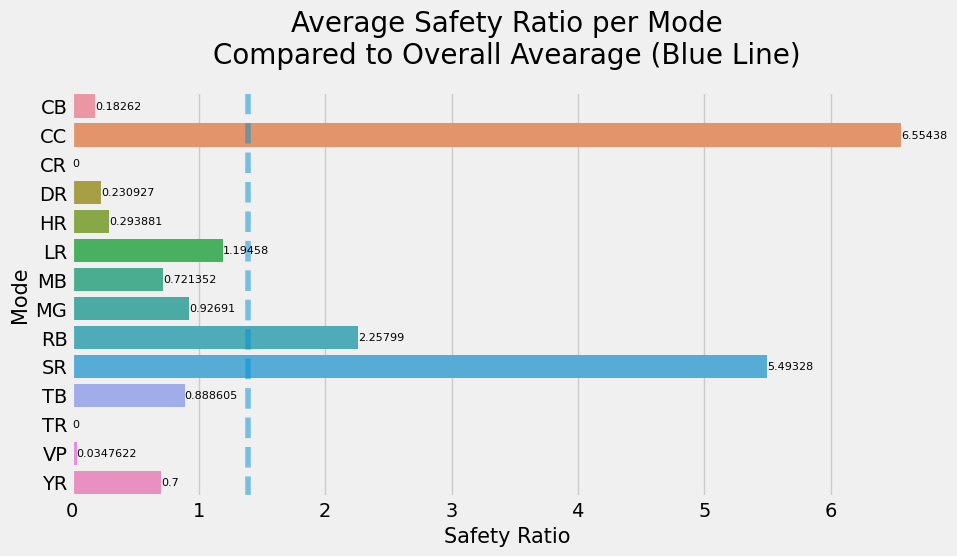

In [272]:
# Barplot of 'Safety Ratio' per Mode over time 

fig, ax =plt.subplots(1,1,figsize=(10,5))
ax.set_title('Average Safety Ratio per Mode\nCompared to Overall Avearage (Blue Line)', fontsize=20, pad=20)

SR_mode_avg = modeling_df3_before_encoding_mode.groupby ('Mode')['Safety Ratio'].mean()
SR_overall_avg = modeling_df3_before_encoding_mode['Safety Ratio'].mean()
print("Average Safety Ratio:", SR_overall_avg)

SR_mode_avg_df = pd.DataFrame(SR_mode_avg)
SR_mode_avg_df = SR_mode_avg_df.reset_index()
SR_mode_avg_df

g= sns.barplot(data=SR_mode_avg_df, y='Mode',x='Safety Ratio', ax=ax)
ax.bar_label(ax.containers[0], fontsize=8)
g.axvline(SR_overall_avg, linestyle='--', alpha=0.5)
plt.xlabel('Safety Ratio',fontsize=15)
plt.ylabel('Mode',fontsize=15);

It is interesting to see that the average safety ratio is zero for both CR and TR.  I'll check the this to see if that is accurate.

In [273]:
def check_CR_and_TR(mode, column):
    t1 = National_data_before_encoding.copy()
    t1 = t1.reset_index()
    t2 = t1[t1['Mode']==mode]
    print (column, "Reported for", mode, ":", t2[column].sum())

In [274]:
check_CR_and_TR('CR', 'Total Fatalities')
check_CR_and_TR('CR', 'Total Injuries')
check_CR_and_TR('CR', 'Total Events')
check_CR_and_TR('TR', 'Total Injuries')
check_CR_and_TR('TR', 'Total Fatalities')
check_CR_and_TR('TR', 'Total Events')

Total Fatalities Reported for CR : 0
Total Injuries Reported for CR : 0
Total Events Reported for CR : 0
Total Injuries Reported for TR : 0
Total Fatalities Reported for TR : 0
Total Events Reported for TR : 0


### 4.3.5 Model Trials: Regression
<a id= '4.3.5_Model_Trials_Regression'></a>
I will try three different regression models to see their usefulness for prediction.  The train/test split will respect time order.

In [275]:
# Checking to see if there are any zeros in the values of 'Safety Ratio'.

modeling_df3['Safety Ratio'].min()

0.0

Since I have zeros in my target values, MAPE will not give a usable value for model evaluation.

#### 4.3.5.1 Train/Test Split
<a id= '4.3.5.1_Train_Test_Split'></a>

In [276]:
# Dropping the Date column but retaining the time order 

modeling_df3.reset_index(inplace=True)
modeling_df3 = modeling_df3.drop(columns='Date')

In [277]:
#Defining X and y from modeling_df

X = modeling_df3.drop(['Safety Ratio'], axis = 1)
y = modeling_df3['Safety Ratio']

In [278]:
# Train/Test split respecting time order (shuffle=False)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False, random_state=42
)
X_train.index.min(), X_train.index.max()

(0, 1141)

In [279]:
X_test.index.min(), X_test.index.max()

(1142, 1427)

#### 4.3.5.2 Linear Regression
<a id= '4.3.5.2_Linear_Regression'></a>


In [280]:
Model_lr3 = LinearRegression()

In [281]:
Model_lr3.fit(X_train, y_train)

LinearRegression()

In [282]:
y_pred_lr3 = Model_lr3.predict(X_test)

In [283]:
#Evaluation

R2_score_lr3 = Model_lr3.score(X_train, y_train)
print("R Squared score:", R2_score_lr3)

#MAPE_lr3 = mean_absolute_percentage_error(y_test, y_pred_lr3)
#print("MAPE:", MAPE_lr3)

MAE_lr3 = mean_absolute_error(y_test, y_pred_lr3)
print("MAE:", MAE_lr3)

MSE_lr3 = mean_squared_error(y_test, y_pred_lr3)
print("MSE:", MSE_lr3)

R Squared score: 0.21011601163563964
MAE: 1.4033937073628648
MSE: 3.5868239756276785


In [284]:
get_residuals(y_pred_lr3)

,y_test,y_pred,residual
1142,1.019985,0.910034,0.109951
1143,4.195937,5.241024,-1.045087
1144,0.428646,2.380472,-1.951826
1145,0.000000,3.197067,-3.197067
1146,0.054279,2.100083,-2.045804
...,...,...,...
1423,9.811617,4.878562,4.933055
1424,3.498275,2.397161,1.101114
1425,0.000000,3.196121,-3.196121
1426,0.037320,1.738474,-1.701154


In [285]:
get_resid_stats(get_residuals(y_pred_lr3))

,y_test,y_pred,residual
min,0.000000,-1.521811,-3.197067
max,11.585472,5.426726,8.982677
median,0.384628,1.315244,-0.204207
mean,1.149065,1.594127,-0.445062
<lambda>,0.000000,3.197067,-3.197067
std,1.906761,1.568135,1.844081


In [286]:
Model_lr3_all_coefs = get_all_coefs_and_fns_df(Model_lr3)

In [287]:
Model_lr3_pos_coefs = get_pos_coefs_df(Model_lr3_all_coefs)
Model_lr3_pos_coefs

,coef
feature_name,
M_MB,1.741844e+01
M_DR,1.330006e+01
M_VP,2.639245e+00
OT_D_Count,1.485164e+00
OT_B_Count,2.807440e-01
OT_H_Count,1.802104e-01
OT_C_Count,1.649873e-01
OT_A_Count,3.812801e-02
P_UZA_SM_National,4.643344e-05


In [288]:
Model_lr3_neg_coefs = get_neg_coefs_df(Model_lr3_all_coefs)
Model_lr3_neg_coefs


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,coef
feature_name,
M_CB,1.031285e+01
M_CR,9.298096e+00
M_OTHER,9.095504e+00
M_LR,4.651291e+00
OT_I_Count,1.616530e+00
OT_OTHER_Count,4.234027e-01
OT_E_Count,3.646043e-01
ToS_TX_Count,2.032924e-01
OT_G_Count,1.839730e-01


In [289]:
Model_lr3_pos_coefs = Model_lr3_pos_coefs.sort_values(by='coef', ascending=True)
Model_lr3_neg_coefs = Model_lr3_neg_coefs.sort_values(by='coef', ascending=True)

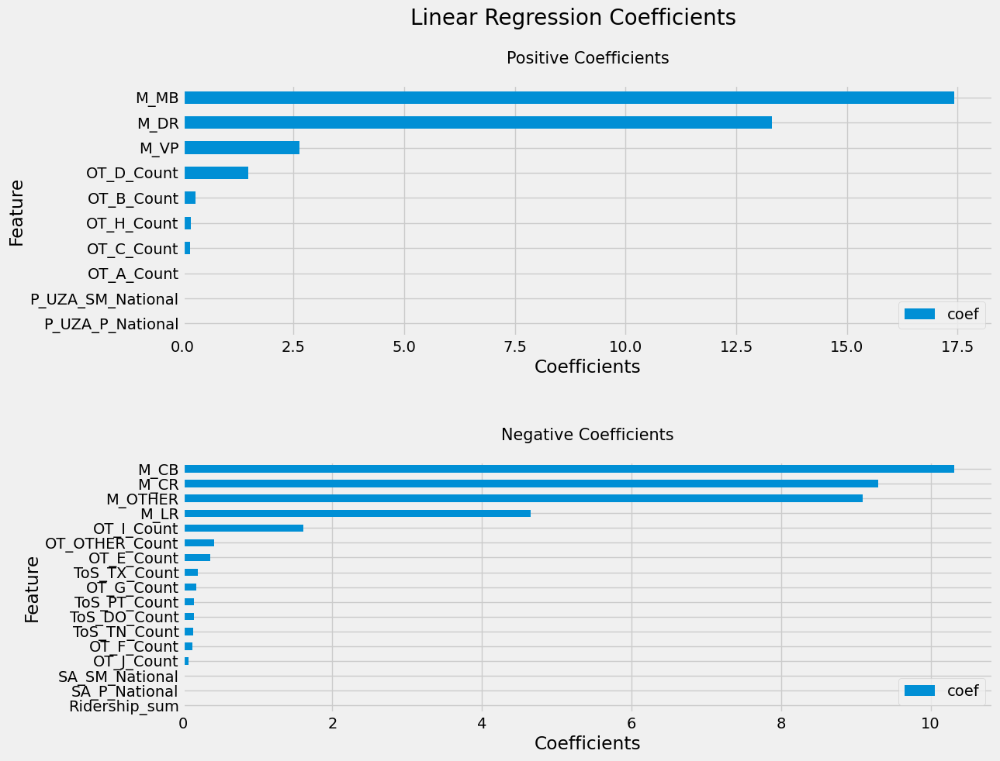

In [290]:
plot_pos_and_neg_lr_coefs(Model_lr3_pos_coefs, Model_lr3_neg_coefs)

#### 4.3.5.3 Random Forest
<a id= '4.3.5.3_Random_Forest'></a>

In [291]:
Model_rf3 = RandomForestRegressor()

In [292]:
Model_rf3.fit(X_train, y_train)

RandomForestRegressor()

In [293]:
y_pred_rf3 = Model_rf3.predict(X_test)

In [294]:

R2_score_rf3 = Model_rf3.score(X_train, y_train)
print("R Squared score:", R2_score_rf3)

#MAPE_rf3 = mean_absolute_percentage_error(y_test, y_pred_rf3)
#print("MAPE:", MAPE_rf3)

MAE_rf3 = mean_absolute_error(y_test, y_pred_rf3)
print("MAE:", MAE_rf3)

MSE_rf3 = mean_squared_error(y_test, y_pred_rf3)
print("MSE:", MSE_rf3)

R Squared score: 0.8816863014085318
MAE: 0.6790615917724632
MSE: 2.323558715819481


In [295]:
get_residuals(y_pred_rf3)

,y_test,y_pred,residual
1142,1.019985,1.923295,-0.903309
1143,4.195937,1.204509,2.991428
1144,0.428646,0.782844,-0.354198
1145,0.000000,0.000000,0.000000
1146,0.054279,0.024139,0.030139
...,...,...,...
1423,9.811617,6.084308,3.727309
1424,3.498275,0.775830,2.722444
1425,0.000000,0.000000,0.000000
1426,0.037320,0.032393,0.004927


In [296]:
get_resid_stats(get_residuals(y_pred_rf3))

,y_test,y_pred,residual
min,0.000000,0.000000,-2.625474
max,11.585472,6.084308,9.087094
median,0.384628,0.623023,0.018355
mean,1.149065,0.799584,0.349481
<lambda>,0.000000,0.000000,0.000000
std,1.906761,1.010266,1.486320


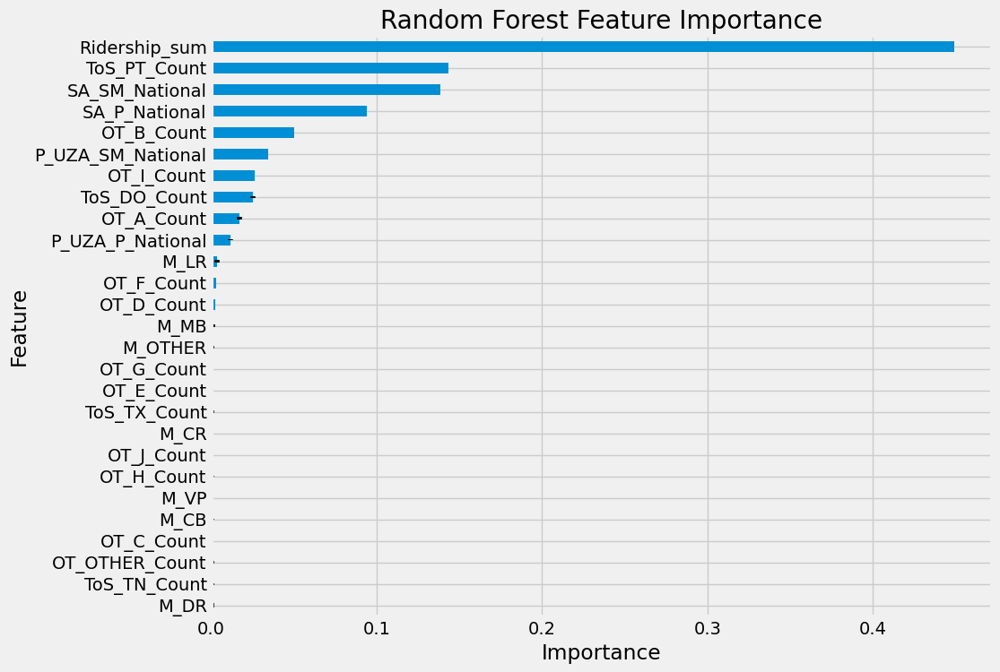

In [297]:
plot_rf_feature_importances(Model_rf3)

#### 4.3.5.4 KNN
<a id= '4.3.5.4_KNN'></a>

In [298]:
Model_knn3 = KNeighborsRegressor()

In [299]:
Model_knn3.fit(X_train, y_train)

KNeighborsRegressor()

In [300]:
y_pred_knn3 = Model_knn3.predict(X_test)

In [301]:

R2_score_knn3 = Model_knn3.score(X_train, y_train)
print("R Squared score:", R2_score_knn3)

#MAPE_knn3 = mean_absolute_percentage_error(y_test, y_pred_knn3)
#print("MAPE:", MAPE_knn3)

MAE_knn3 = mean_absolute_error(y_test, y_pred_knn3)
print("MAE:", MAE_knn3)

MSE_knn3 = mean_squared_error(y_test, y_pred_knn3)
print("MSE:", MSE_knn3)

R Squared score: 0.5946837911033722
MAE: 0.5913797013066694
MSE: 2.2214117605245334


In [302]:
get_residuals(y_pred_knn3)

,y_test,y_pred,residual
1142,1.019985,1.749834,-0.729849
1143,4.195937,4.110340,0.085597
1144,0.428646,0.279728,0.148918
1145,0.000000,0.000000,0.000000
1146,0.054279,0.023817,0.030461
...,...,...,...
1423,9.811617,4.110340,5.701277
1424,3.498275,0.619424,2.878850
1425,0.000000,0.000000,0.000000
1426,0.037320,0.016133,0.021187


In [303]:
get_resid_stats(get_residuals(y_pred_knn3))

,y_test,y_pred,residual
min,0.000000,0.000000,-1.544235
max,11.585472,4.110340,11.585472
median,0.384628,0.345431,0.026953
mean,1.149065,0.767356,0.381709
<lambda>,0.000000,0.000000,0.000000
std,1.906761,1.062406,1.443258


#### 4.3.5.5 Comparing the Models' Performance
<a id='4.3.5.5_Comparing_the_Models_Performance'></a>


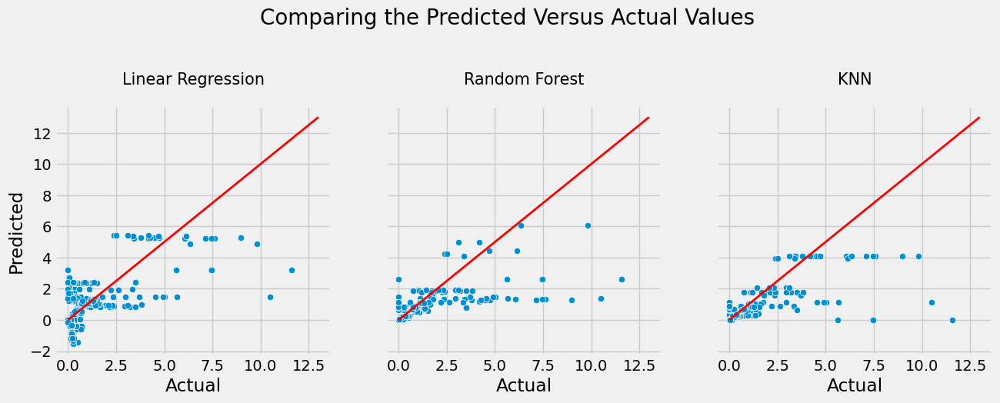

In [304]:
plot_pred_vs_actual(y_pred_lr3, y_pred_rf3, y_pred_knn3, 0, 13)

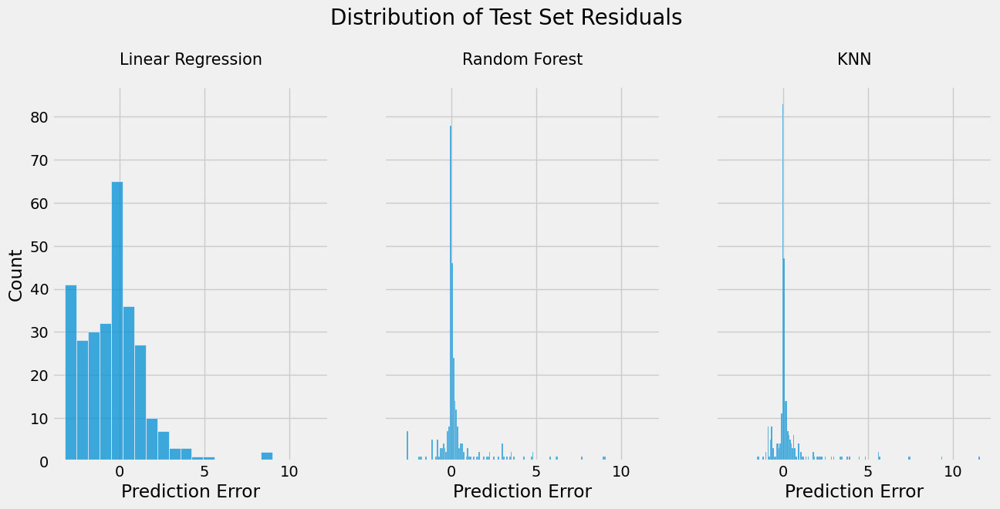

In [305]:
diff_lr3 = (y_test - y_pred_lr3)
diff_rf3 = (y_test - y_pred_rf3)
diff_knn3 = (y_test - y_pred_knn3)

plot_residual_comparison(diff_lr3, diff_rf3, diff_knn3)

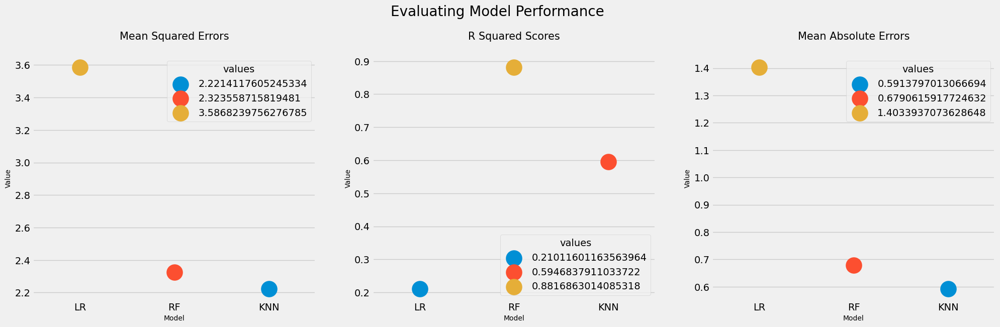

In [306]:
plot_model_performance_no_MAPE(
    MSE_lr3, MSE_rf3, MSE_knn3, R2_score_lr3, R2_score_rf3, R2_score_knn3, 
    MAE_lr3, MAE_rf3, MAE_knn3
)


Since I cannot use MAPE to evaluate this dataframe, R2 is going to be the most meaningful predictor.  The R2 value for random forest again is over 0.9 and is far higher than that for linear regression or k nearest neighbors.

#### 4.3.5.6 XGBoost Regression
<a id='4.3.5.6_XGBoost_Regression'></a>

In [307]:
Model_xgbr3 = xgb.XGBRegressor()

In [308]:
Model_xgbr3.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [309]:
y_pred_xgbr3 = Model_xgbr3.predict(X_test)

In [310]:

R2_score_xgbr3 = Model_xgbr3.score(X_train, y_train)
print("R Squared score:", R2_score_xgbr3)

#MAPE_xgbr3 = mean_absolute_percentage_error(y_test, y_pred_xgbr3)
#print("MAPE:", MAPE_xgbr3)

MAE_xgbr3 = mean_absolute_error(y_test, y_pred_xgbr3)
print("MAE:", MAE_xgbr3)

MSE_xgbr3 = mean_squared_error(y_test, y_pred_xgbr3)
print("MSE:", MSE_xgbr3)

R Squared score: 0.9446670816142115
MAE: 0.7444562612847784
MSE: 2.5873286349572067


In [311]:
get_residuals(y_pred_xgbr3)

,y_test,y_pred,residual
1142,1.019985,1.962739,-0.942754
1143,4.195937,1.281143,2.914794
1144,0.428646,0.453517,-0.024871
1145,0.000000,-0.000529,0.000529
1146,0.054279,0.032454,0.021825
...,...,...,...
1423,9.811617,6.378905,3.432712
1424,3.498275,1.002524,2.495751
1425,0.000000,0.000864,-0.000864
1426,0.037320,0.159389,-0.122070


In [312]:
get_resid_stats(get_residuals(y_pred_xgbr3))

,y_test,y_pred,residual
min,0.000000,-0.622795,-5.147886
max,11.585472,6.378905,10.001640
median,0.384628,0.453517,0.037477
mean,1.149065,0.830942,0.318123
<lambda>,0.000000,-0.000529,0.000529
std,1.906761,1.136430,1.579509


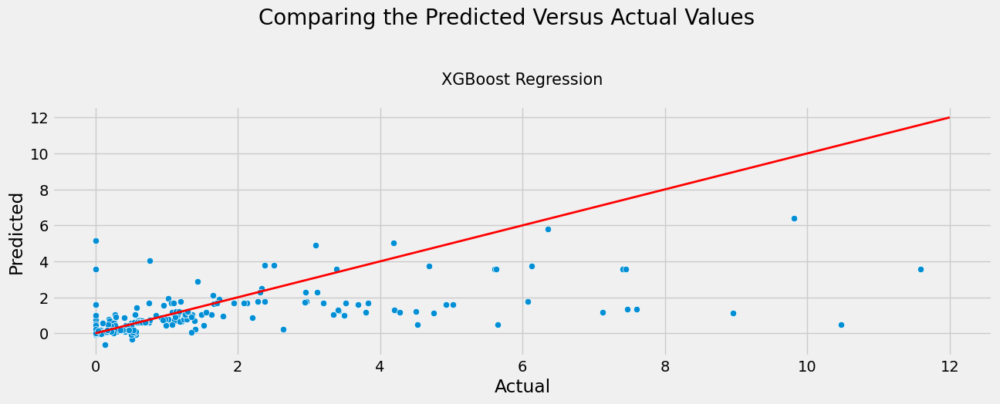

In [313]:
plot_pred_vs_act_single(y_pred_xgbr3, 0, 12)

XGBoost Regression appears to be a good model for predicting the target.  I'll create a new model based on the whole dataset to see what I can learn from it.

#### 4.3.5.7 Modeling the Whole Dataset
<a id='4.3.5.7_Modeling_the_Whole_Dataset'></a>


In [314]:
#Defining X and y

X = modeling_df3.drop(['Safety Ratio'], axis = 1)
y = modeling_df3['Safety Ratio']

In [315]:
Model_xgbr3_all = xgb.XGBRegressor()

In [316]:
Model_xgbr3_all.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [317]:
#shap.initjs()

In [318]:
explainer = shap.TreeExplainer(Model_xgbr3_all)

In [319]:
shap_values = explainer.shap_values(X)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


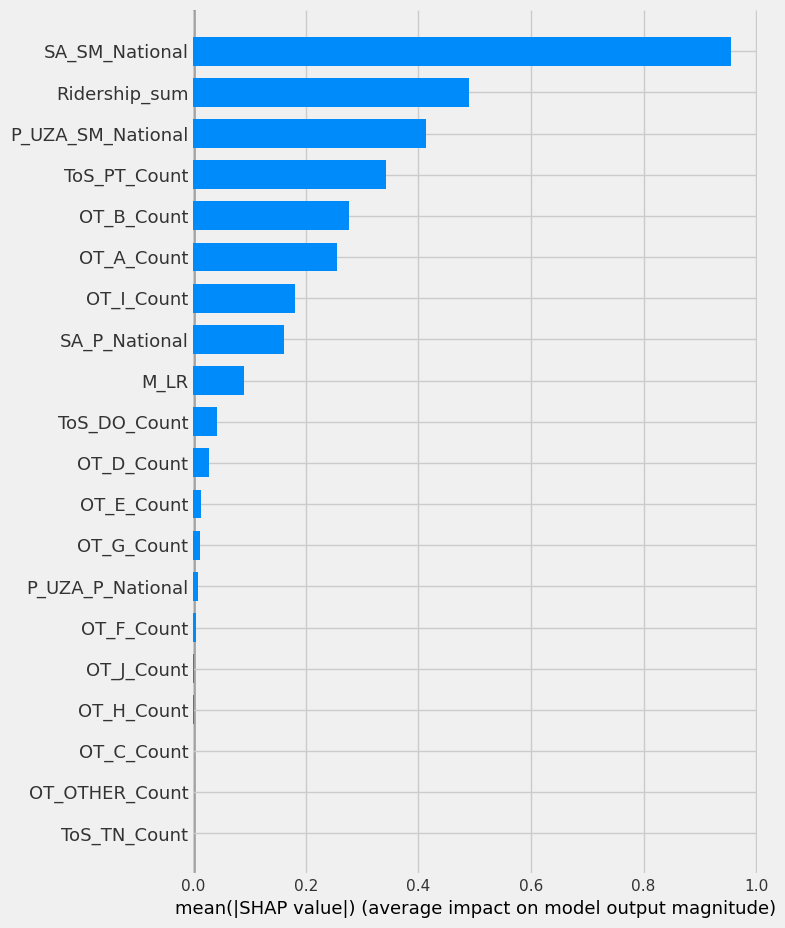

In [320]:
shap.summary_plot(shap_values, X, plot_type="bar")

Here, where we are looking at data by date and mode, we see that the feature with the greatest importance is the square milage of the service area (SA_SM_National).  Ridership comes in second but at about the half the value of SA_SM_National.  The third most important feature is the size of the primary uza (P_UZA_SM_National) again pointing to area as the key to understanding an increase in the target value.

In [321]:
#shap.force_plot(explainer.expected_value, shap_values, X)

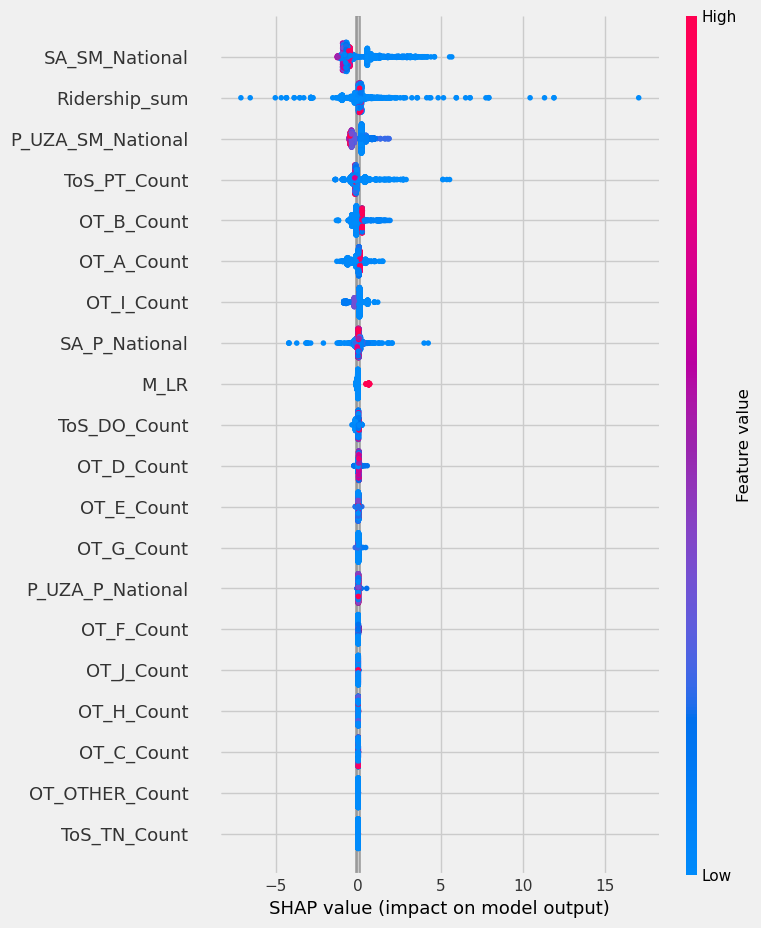

In [322]:
shap.summary_plot(shap_values, X)

Intersting to see that the higher values for SA_SM_National are to the left of zero, indicating they have a small negative effect on the target.  This can be seen in more detail below.

In [323]:
#shap.dependence_plot("Ridership_sum", shap_values, X_train)

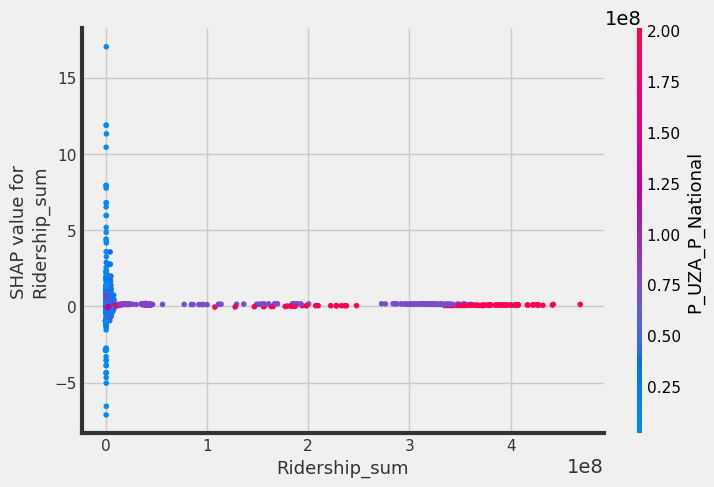

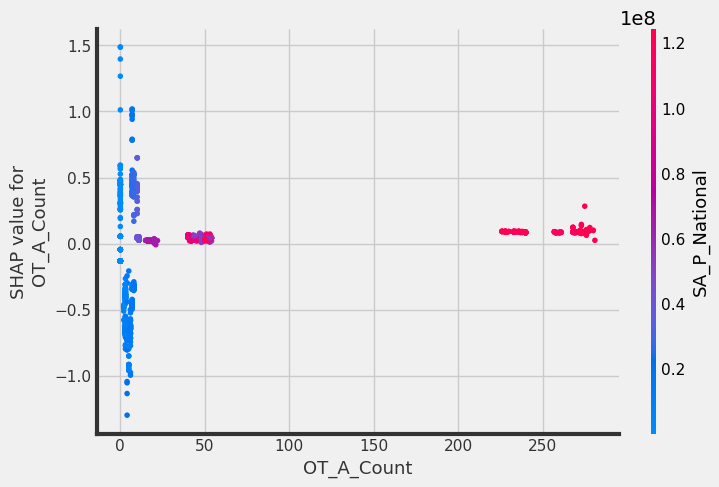

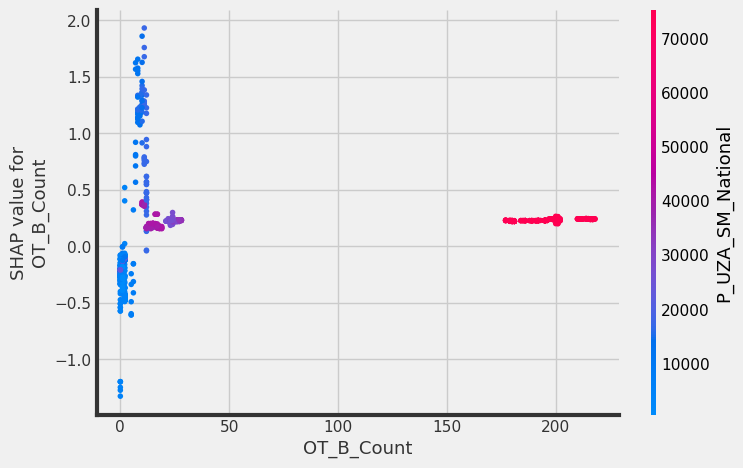

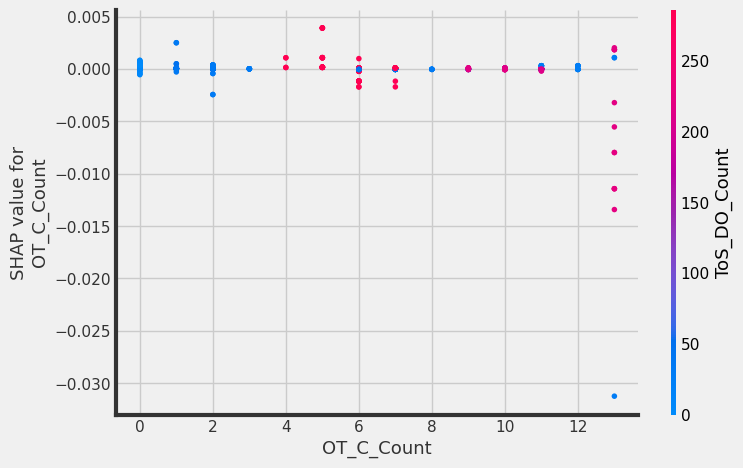

invalid value encountered in divide
invalid value encountered in divide


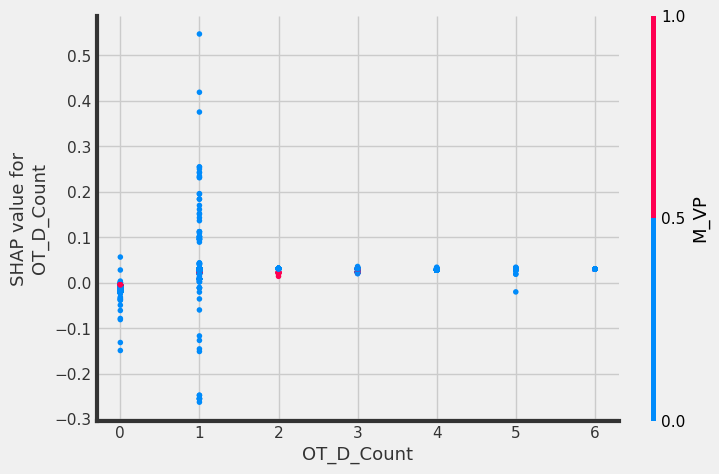

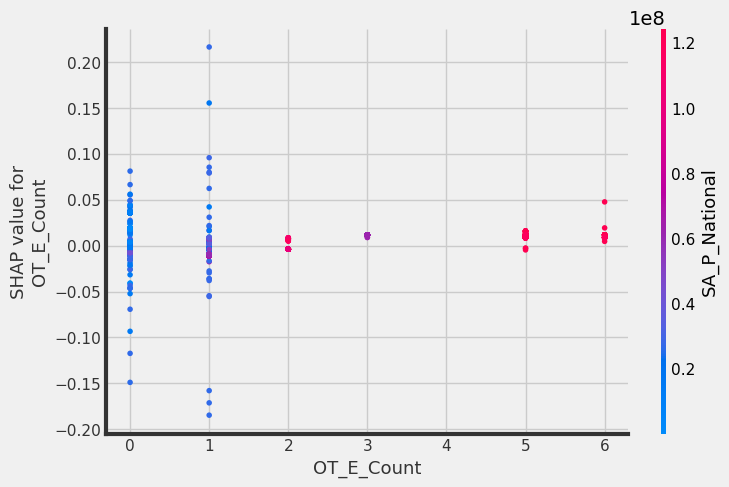

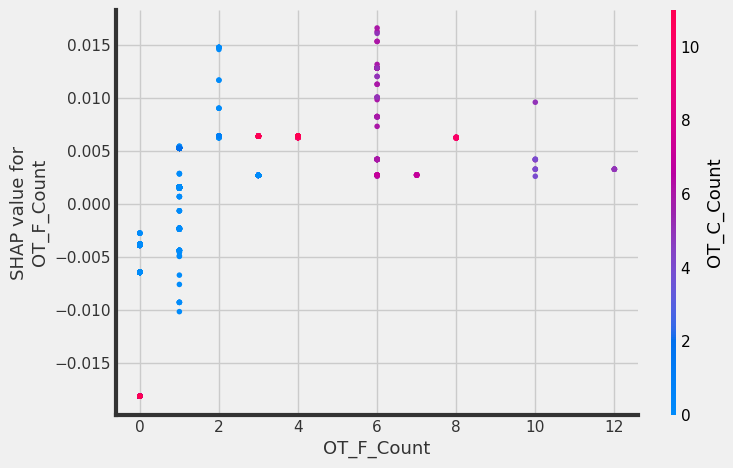

invalid value encountered in divide
invalid value encountered in divide


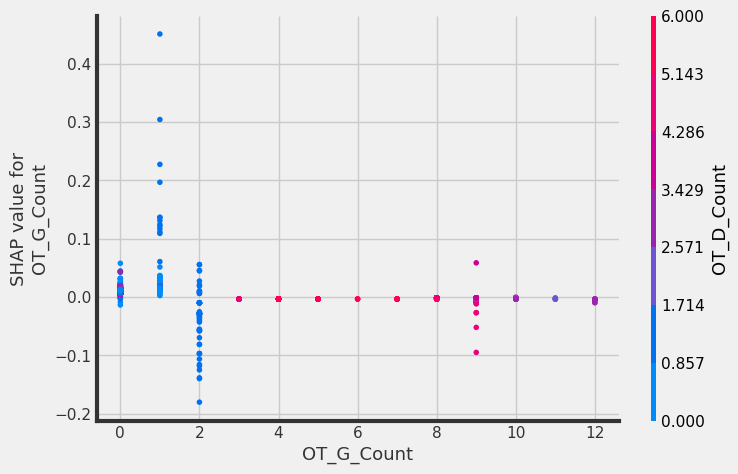

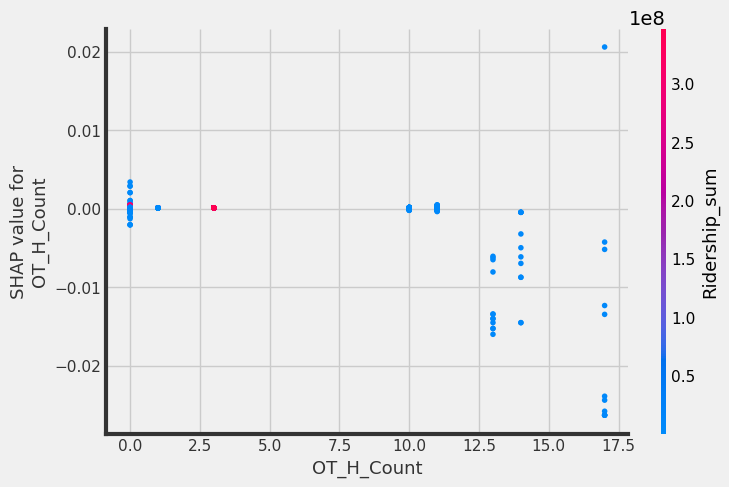

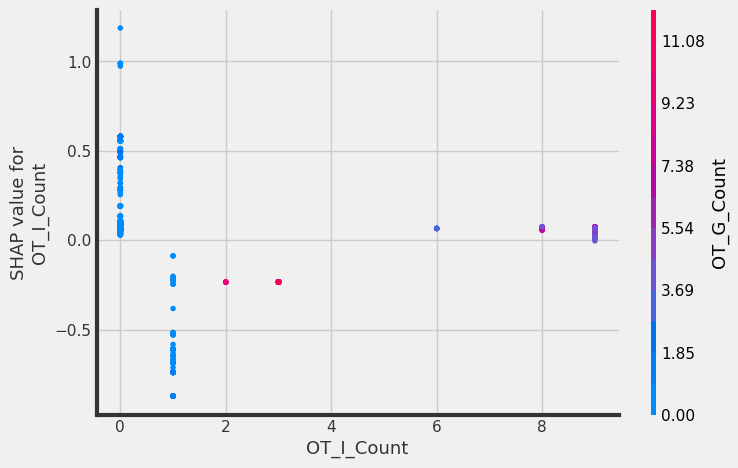

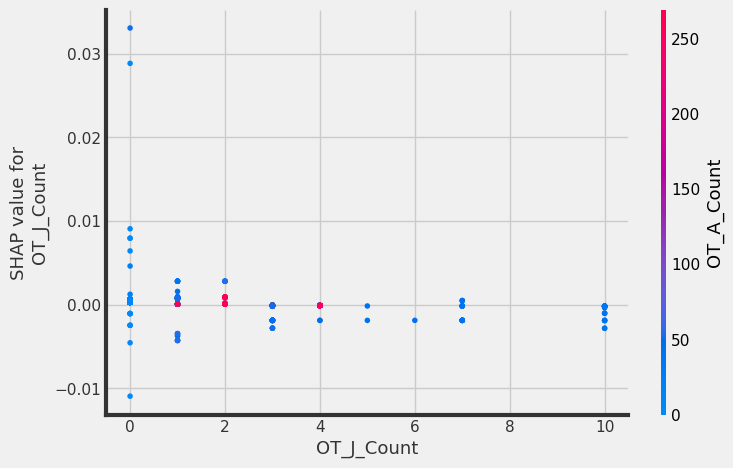

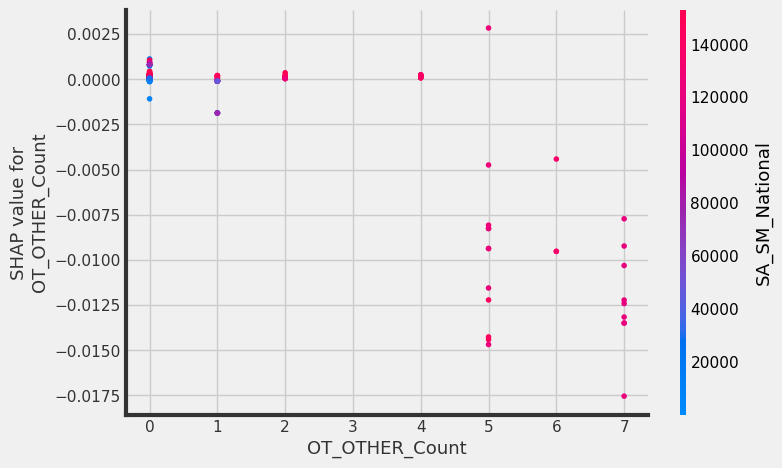

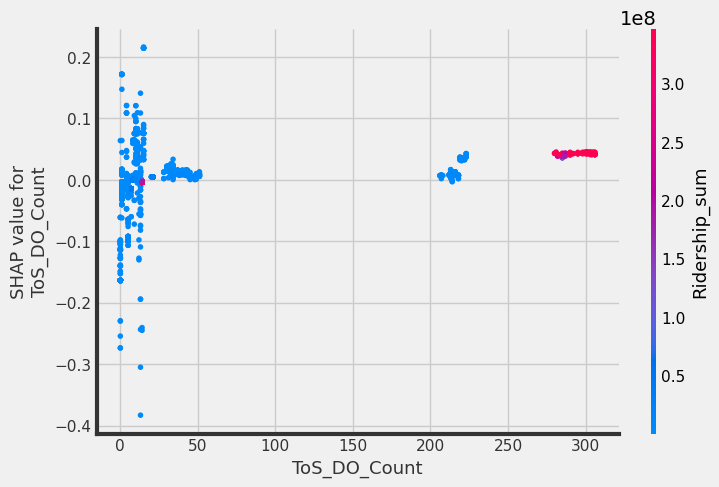

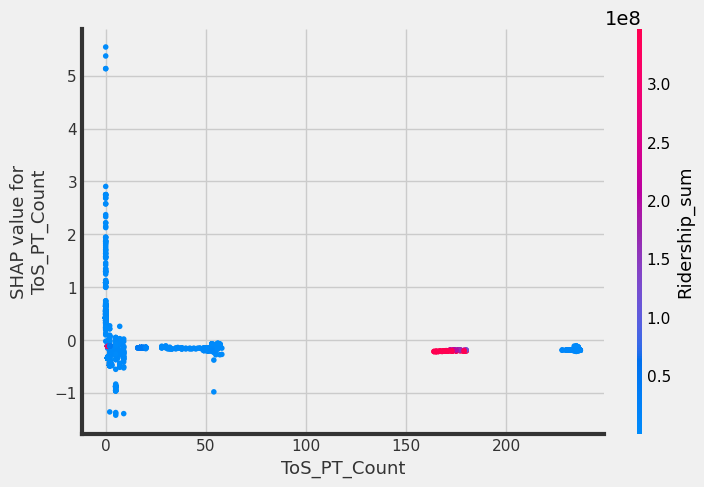

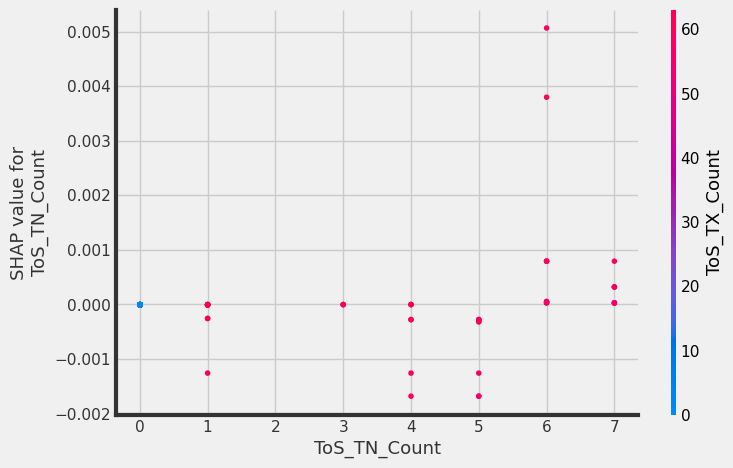

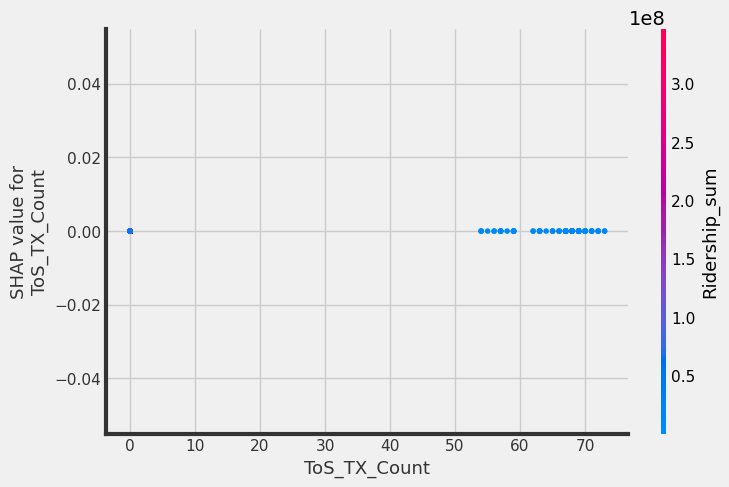

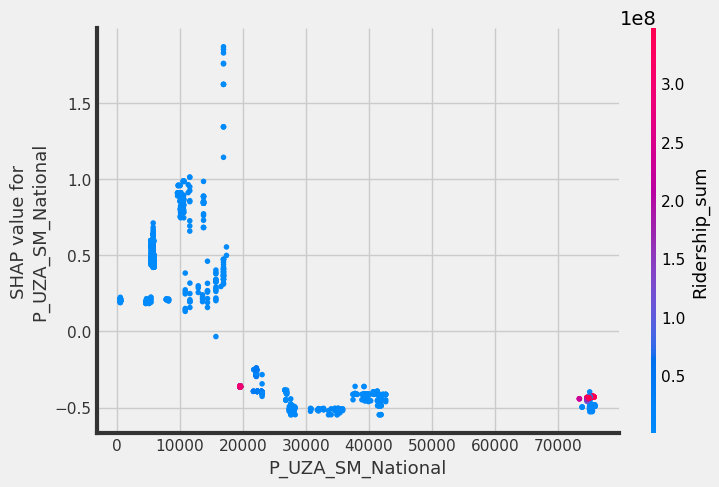

invalid value encountered in divide
invalid value encountered in divide


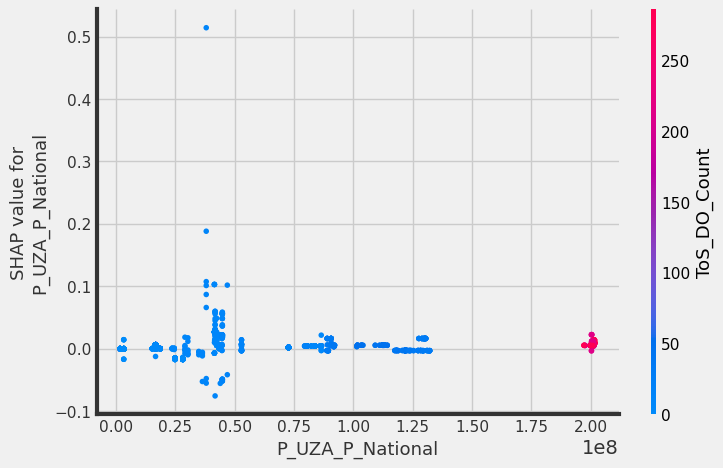

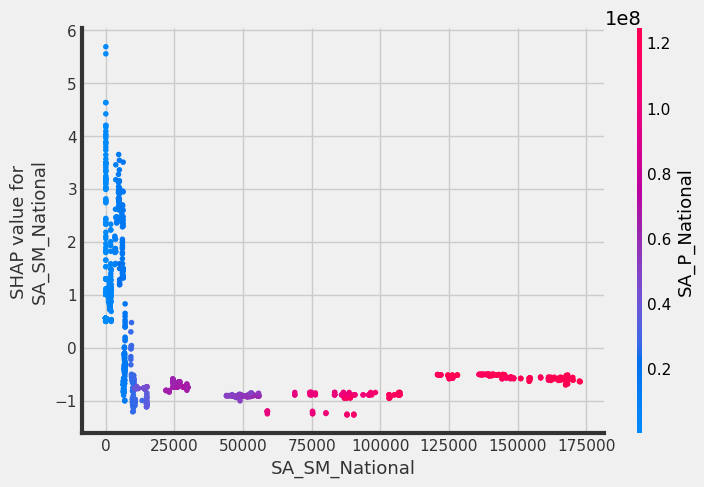

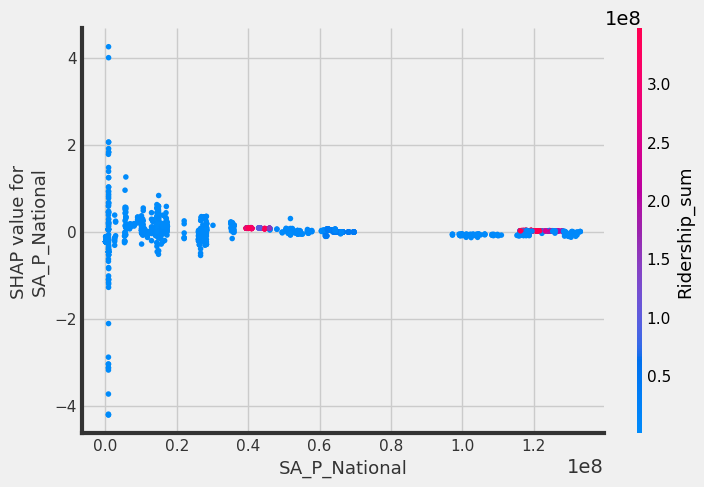

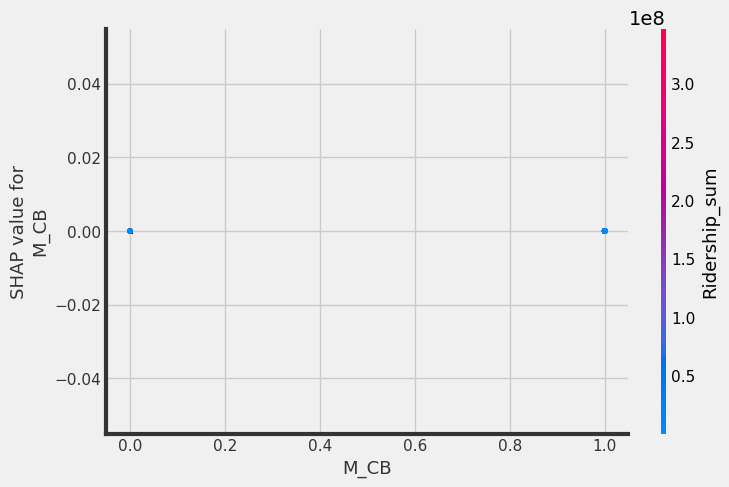

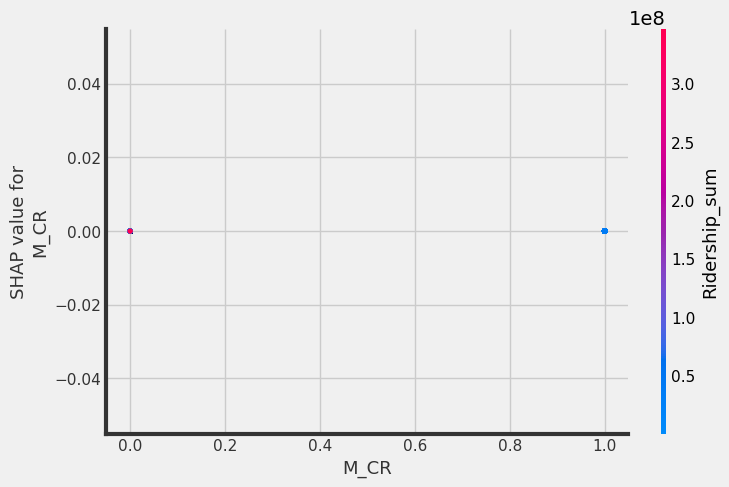

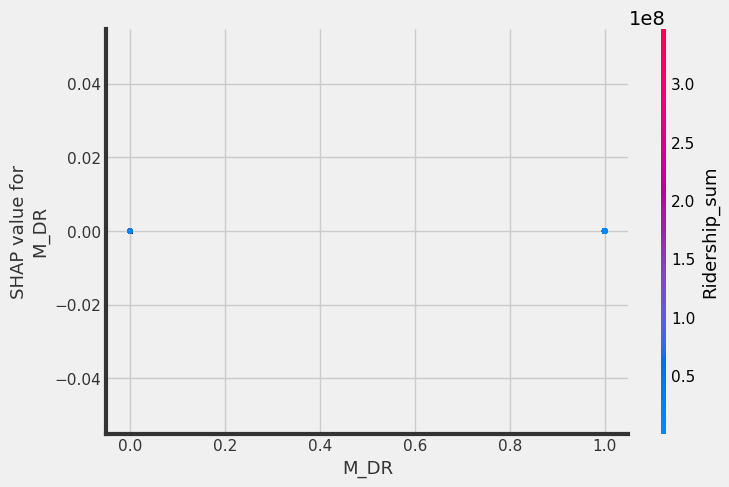

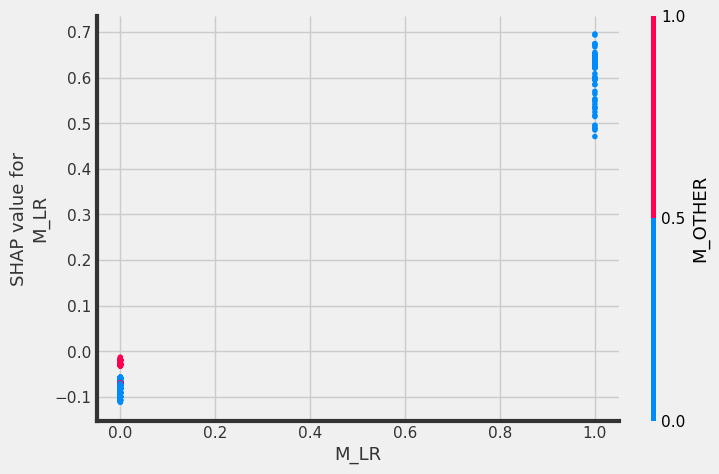

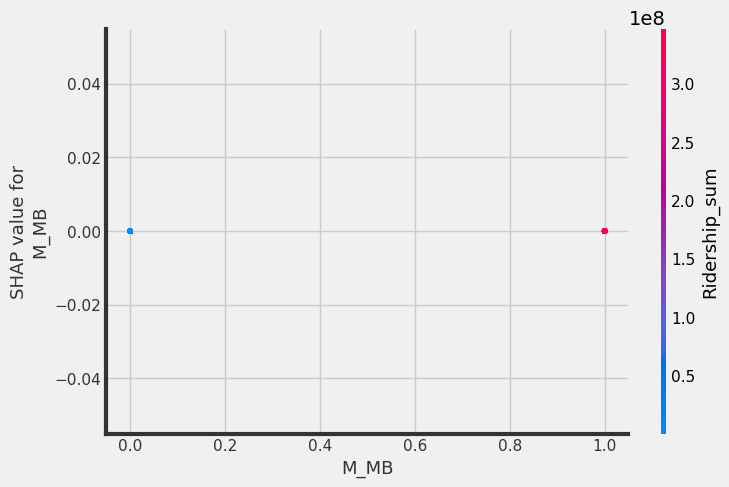

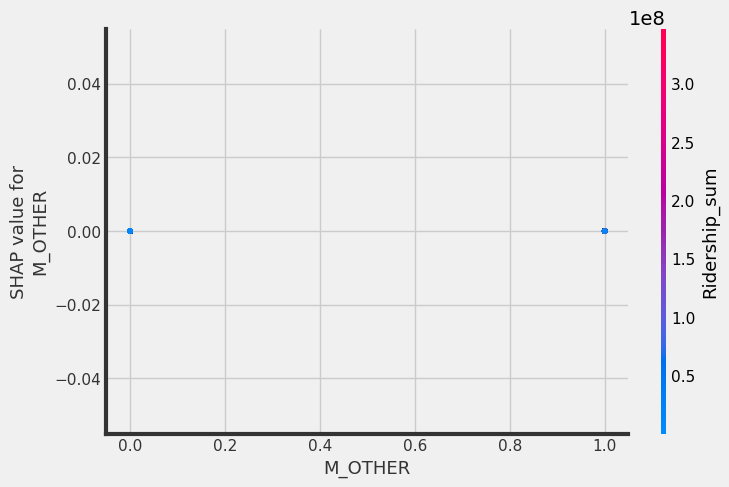

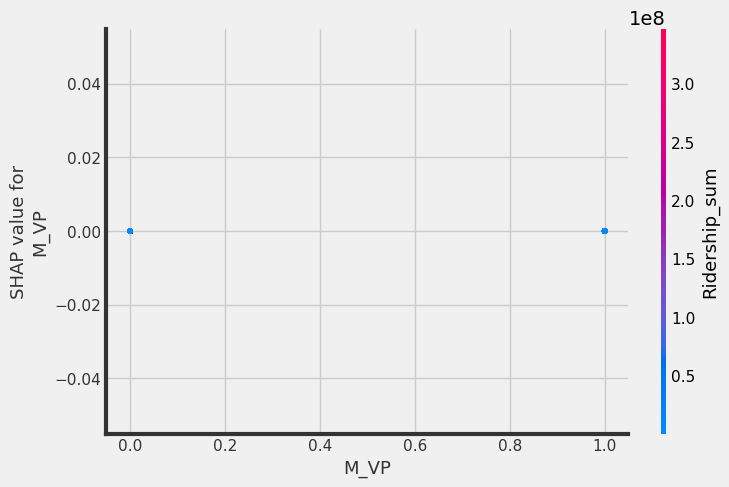

In [324]:
for name in X.columns:
    shap.dependence_plot(name, shap_values, X)


#### 4.3.5.8 Modeling Specific Modes
<a id='4.3.5.8_Modeling_Specific_Modes'></a>


In [325]:
#shap.plots.waterfall(shap_values[0])

In [326]:
modeling_df3_CB = modeling_df3[modeling_df3['M_CB']==1]
modeling_df3_CR = modeling_df3[modeling_df3['M_CR']==1]
modeling_df3_DR = modeling_df3[modeling_df3['M_DR']==1]
modeling_df3_LR = modeling_df3[modeling_df3['M_LR']==1]
modeling_df3_MB = modeling_df3[modeling_df3['M_MB']==1]
modeling_df3_OTHER = modeling_df3[modeling_df3['M_OTHER']==1]
modeling_df3_VP = modeling_df3[modeling_df3['M_VP']==1]

In [327]:
#Defining X and y

X = modeling_df3_CB.drop(['Safety Ratio'], axis = 1)
y = modeling_df3_CB['Safety Ratio']

In [328]:
modeling_df3_CB = xgb.XGBRegressor()

In [329]:
modeling_df3_CB.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [330]:
#shap.initjs()

In [331]:
explainer = shap.TreeExplainer(Model_rf2_Nashville)


In [332]:
shap_values = explainer.shap_values(X)

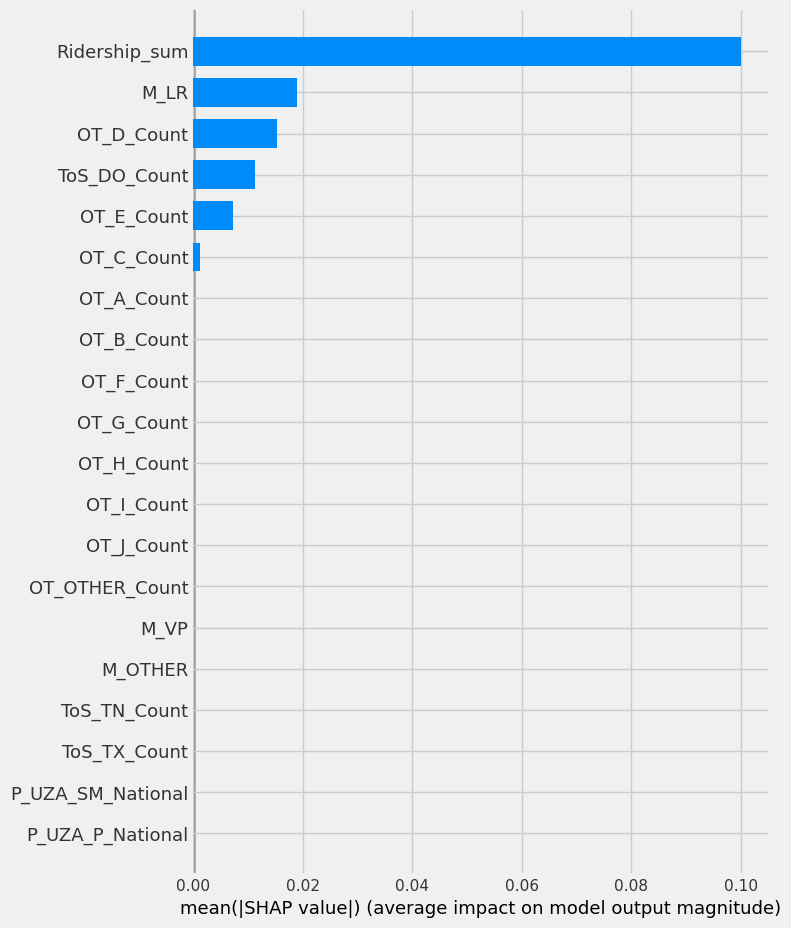

In [333]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [334]:
shap.force_plot(explainer.expected_value, shap_values, X)

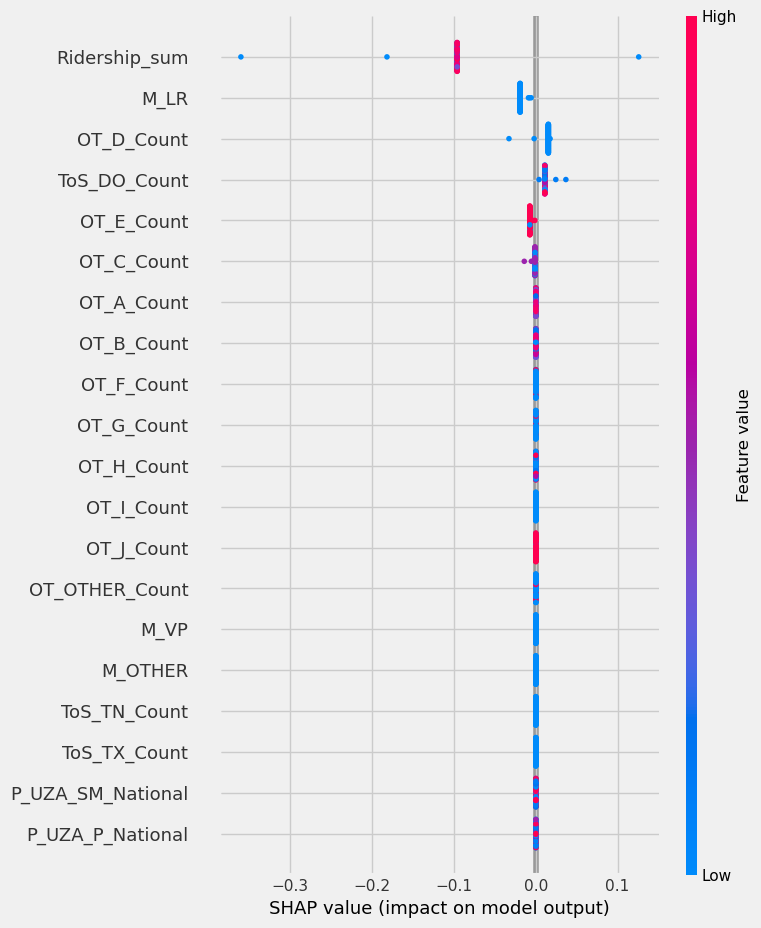

In [335]:
shap.summary_plot(shap_values, X)

In [336]:
#shap.dependence_plot("Ridership_sum", shap_values, X_train)

In [337]:
#names = ('Ridership_sum','SA_P_avg','SA_SM_avg','ToS_DO_Count','OT_A_Count','M_CB_Count')

#for name in names:
#    shap.dependence_plot(name, shap_values, X)


**Light Rail**

In [338]:
#Defining X and y

X = modeling_df3_LR.drop(['Safety Ratio'], axis = 1)
y = modeling_df3_LR['Safety Ratio']

In [339]:
modeling_df3_LR = xgb.XGBRegressor()

In [340]:
modeling_df3_LR.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [341]:
explainer = shap.TreeExplainer(Model_rf2_Nashville)


# compute SHAP values
#explainer = shap.Explainer(model, X)
#shap_values = explainer(X)

In [342]:
shap_values = explainer.shap_values(X)

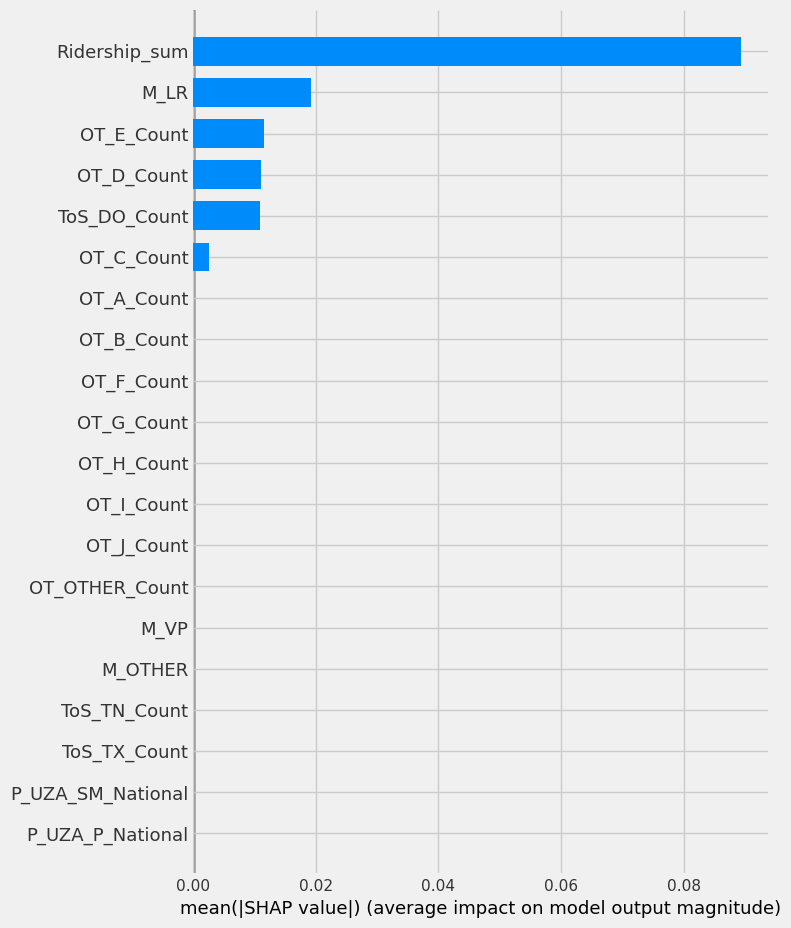

In [343]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [344]:
shap.force_plot(explainer.expected_value, shap_values, X)

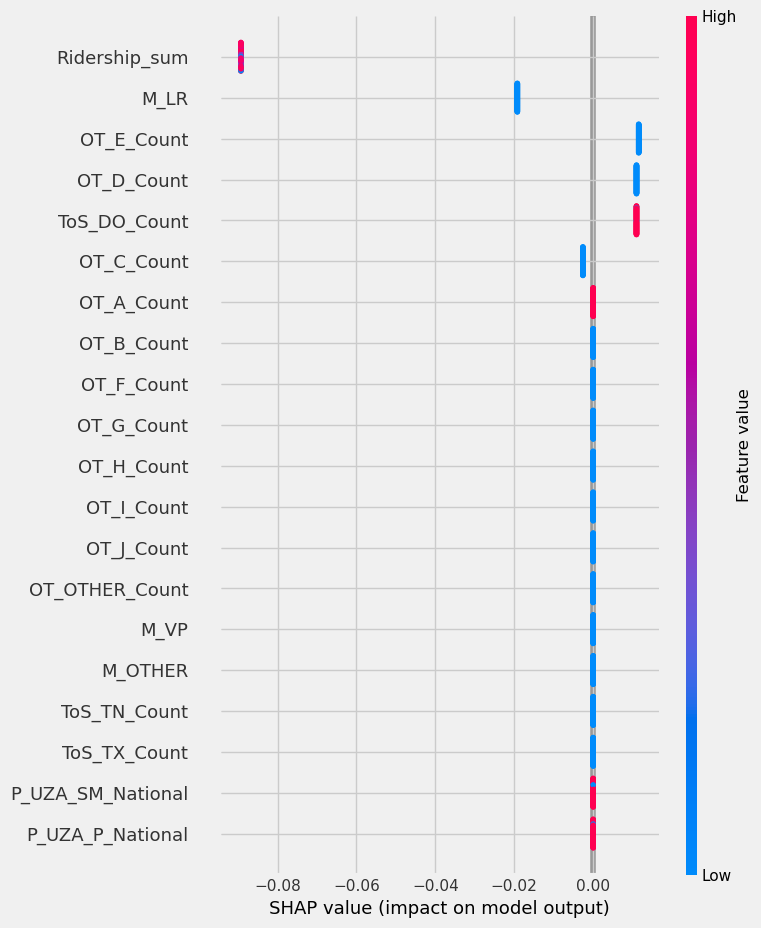

In [345]:
shap.summary_plot(shap_values, X)

## 4.4 Save the Data
<a id='4.4_Save_the_Data'></a>

In [346]:
National_data_before_encoding.to_csv("National_data_before_encoding_post_preprocessing.csv", index=False)
National_data.to_csv("National_data_post_preprocessing.csv", index=False)
Nashville_data.to_csv("Nashville_data_post_preprocessing.csv", index=False)

modeling_df.to_csv("modeling_df.csv", index=False)
modeling_df2.to_csv("modeling_df2.csv", index=False)
modeling_df3.to_csv("modeling_df3.csv", index=False)


## 4.5 Summary
<a id='4.5_Summary'></a>

In this notebook, I further refined the dataframe, I defined safety, and I added a 'Date' column.  I then performed some exploratory time series aggregations in order to learn more about the data.

I then encoded the categorical columns and aggregated the data for modeling.  I created the target called 'Safety Ratio', and performed additional EDA.  

I created three different dataframes for modeling and ran three regression models on each of them to see if any would be useful in predicting the target values.  Random forest was the best of the three regression models for all three dataframes.
